In [268]:
import xarray as xr
import os
import pandas as pd
import geopandas as gpd
import shapely as sp
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy as crt
import math
import matplotlib.colors as colors
from matplotlib.cm import ScalarMappable
import warnings

#------ stats
from statsmodels.tsa.stattools import pacf, acf
from statsmodels.tsa.filters.filtertools import recursive_filter
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
from scipy.optimize import curve_fit
from statsmodels.tsa.statespace.sarimax import SARIMAX
import scipy.stats as st
from scipy.special import exp10
from sklearn.mixture import GaussianMixture

import random
import gstools as gs

base_path = r'c:\Thesis\Data'

First part : Plotting

In [269]:
def load_data(folder_path, test=False):
    """
    BASE FUNCTION

    Load multiple CSV files from a specified folder and combine them into a single DataFrame.

    This function reads all CSV files in the given folder, combines them by stacking them vertically,
    and returns a single Pandas DataFrame containing the data from all the CSV files.

    Parameters:
    folder_path (str): The path to the folder containing the CSV files.
    test (bool): If True, only reads up to 6 CSV files for testing purposes. Defaults to False.

    Returns:
    pandas.DataFrame: A DataFrame containing the combined data from all the CSV files in the folder.

    Example:
    --------
    # Assume you have the following CSV files in the folder 'data_folder/':
    # - file1.csv
    # - file2.csv
    # - file3.csv

    # Load and stack the CSV files
    combined_df = load_and_stack_csv('data_folder/')

    # Display the combined DataFrame
    print(combined_df)

    Notes:
    ------
    - The function assumes that all CSV files in the specified folder have the same structure (i.e., same columns).
    - If a CSV file cannot be read or does not match the expected structure, it will be skipped.
    """
    all_dataframes = []

    # Iterate over all files in the specified folder
    for i, filename in enumerate(os.listdir(folder_path)):
        if test and i >= 3:
            break
        if filename.endswith(".csv"):
            file_path = os.path.join(folder_path, filename)
            try:
                # Read the CSV file into a DataFrame
                df = pd.read_csv(file_path)[["lat","lon","country","date_time","n_crisis","percent_change"]]
                all_dataframes.append(df)
            except Exception as e:
                print(f"Error reading {file_path}: {e}")

    # Combine all DataFrames by stacking them vertically
    combined_df = pd.concat(all_dataframes, ignore_index=True)

    combined_df['date_time'] = pd.to_datetime(combined_df['date_time']) - pd.Timedelta(hours=8)
    combined_df.rename(columns={'n_crisis': 'n_users'}, inplace=True)
    combined_df['n_users'] = np.log10(combined_df['n_users'])
    return combined_df

# Usage example
csv_folder = base_path + '/csv_typhoonSeason/00_TyphoonFree/2022'
DATA = load_data(csv_folder, test=False)

# Filter out non PH points.
DATA = DATA[lambda df: (df['country'] == 'PH') | (df['country'].isna())]
DATA = DATA.drop(columns=['country'])

In [270]:
def shape_data(df, shapefile, lat_col='lat', lon_col='lon'):
    """
    BASE FUNCTION

    Associate each point in a DataFrame with given latitude and longitude columns to a shapefile geometry.

    This function takes a Pandas DataFrame with latitude and longitude columns, converts these coordinates to
    Point geometries, and checks which geometry from a given shapefile each point falls into. The function
    returns a new DataFrame with an additional column indicating the associated geometry.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing latitude and longitude columns.
    lat_col (str): The name of the latitude column in the DataFrame. Default is 'lat'.
    lon_col (str): The name of the longitude column in the DataFrame. Default is 'lon'.
    shapefile_path (str): The file path to the shapefile containing the geometries.

    Returns:
    pandas.DataFrame: A new DataFrame with an additional column 'geometry_id' indicating the associated geometry.
    Notes:
    ------
    - The function assumes that the shapefile is in a coordinate system compatible with the latitude and longitude values.
    - The returned DataFrame contains a new column 'geometry_id' indicating the associated geometry from the shapefile.
    """
    # Convert latitude and longitude to Point geometries
    geometry = [sp.Point(xy) for xy in zip(df[lon_col], df[lat_col])]
    geo_df = gpd.GeoDataFrame(df, geometry=geometry)

    # Ensure both GeoDataFrames are in the same CRS
    if geo_df.crs != shapefile.crs:
        geo_df = geo_df.set_crs(shapefile.crs, allow_override=True)

    # Perform spatial join to associate points with geometries
    geo_df = gpd.sjoin(geo_df, shapefile, how='inner', predicate='within')

    # Rename the index_right column to geometry_id
    geo_df = geo_df.rename(columns={'index_right': 'geometry_id'})

    return geo_df.drop(columns=['lat','lon'])
# Path to the shapefile
shapefile_path = r'c:\Thesis\Data\Shapefiles\gadm41_PHL_1.shp'
shapefile =  gpd.read_file(shapefile_path)
shapefile["NAME_1"] = shapefile["NAME_1"]
shapefile = shapefile[['NAME_1','geometry']]

DATA_SHAPE = shape_data(DATA, shapefile, 'lat', 'lon')
print(DATA_SHAPE)

                  date_time   n_users  percent_change  \
5       2021-12-31 16:00:00  1.308344      -17.217623   
6       2021-12-31 16:00:00  1.547978       71.026187   
7       2021-12-31 16:00:00  1.946108       67.709705   
13      2021-12-31 16:00:00  2.070069      109.229373   
14      2021-12-31 16:00:00       NaN       76.842062   
...                     ...       ...             ...   
8711788 2022-03-31 08:00:00  2.151506      -17.223213   
8711792 2022-03-31 08:00:00  3.223103       -6.255550   
8711793 2022-03-31 08:00:00       NaN       39.763284   
8711796 2022-03-31 08:00:00       NaN       29.700084   
8711798 2022-03-31 08:00:00  3.573974       -9.880251   

                           geometry  geometry_id           NAME_1  
5        POINT (120.87158 16.57302)           12          Benguet  
6         POINT (126.23291 8.38543)           74  Surigao del Sur  
7        POINT (123.94775 12.10378)           45          Masbate  
13        POINT (125.48584 6.51181)        

In [345]:
from tabulate import tabulate

first_five = DATA_SHAPE.head()

# Print the first 5 observations in a pretty table format
print(tabulate(first_five, headers='keys', tablefmt='fancy_grid'))

╒════╤═════════════════════╤═══════════╤══════════════════╤════════════════════════════════════════════╤═══════════════╤═════════════════╕
│    │ date_time           │   n_users │   percent_change │ geometry                                   │   geometry_id │ NAME_1          │
╞════╪═════════════════════╪═══════════╪══════════════════╪════════════════════════════════════════════╪═══════════════╪═════════════════╡
│  5 │ 2021-12-31 16:00:00 │   1.30834 │         -17.2176 │ POINT (120.87158203125 16.57302156734549)  │            12 │ Benguet         │
├────┼─────────────────────┼───────────┼──────────────────┼────────────────────────────────────────────┼───────────────┼─────────────────┤
│  6 │ 2021-12-31 16:00:00 │   1.54798 │          71.0262 │ POINT (126.23291015625 8.38543040771846)   │            74 │ Surigao del Sur │
├────┼─────────────────────┼───────────┼──────────────────┼────────────────────────────────────────────┼───────────────┼─────────────────┤
│  7 │ 2021-12-31 16:00:00 

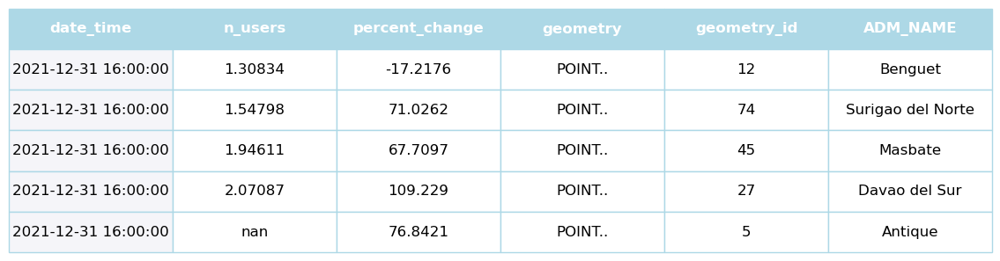

In [355]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.table as tbl

# Sample data
data = {
    'date_time': ['2021-12-31 16:00:00']*5,
    'n_users': [1.30834, 1.54798, 1.94611, 2.07087, None],
    'percent_change': [-17.2176, 71.0262, 67.7097, 109.229, 76.8421],
    'geometry': [
        'POINT..',
        'POINT..',
        'POINT..',
        'POINT..',
        'POINT..'
    ],
    'geometry_id': [12, 74, 45, 27, 5],
    'ADM_NAME': ['Benguet', 'Surigao del Norte', 'Masbate', 'Davao del Sur', 'Antique']
}

df = pd.DataFrame(data)

# Plotting the table
fig, ax = plt.subplots(figsize=(12, 3))  # set size frame
ax.axis('tight')
ax.axis('off')

# Create table
table = ax.table(cellText=df.values, colLabels=df.columns, cellLoc='center', loc='center')

# Styling the table
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)

# Apply styles to the header
for (i, j), cell in table.get_celld().items():
    if i == 0:  # Header row
        cell.set_text_props(weight='bold', color='white')
        cell.set_facecolor('lightblue')
    elif j == 0:  # First column
        cell.set_facecolor('#f5f5f9')
    cell.set_edgecolor('lightblue')
    cell.set_height(0.2)

plt.show()



In [271]:
def load_cuboidPoints(df, date_time_col='date_time'):
    """
    BASE FUNCTION
    
    Create an xarray.Dataset with Point geometries from a DataFrame with a date_time column as the time dimension.

    This function converts a Pandas DataFrame into an xarray.Dataset, setting the specified date_time column
    as the time dimension and renaming it to 'time'.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    date_time_col (str): The name of the column in the DataFrame that represents the date_time dimension.

    Returns:
    xarray.Dataset: An xarray Dataset with 'time' andd geometry as the dimension + information about geometries.

    Notes:
    ------
    - The function assumes that the date_time column is in a format that can be converted to pandas datetime.
    - All columns in the DataFrame, except the date_time column, will be included as data variables in the xarray Dataset.
    """
    # Ensure the date_time column is in datetime format
    df[date_time_col] = pd.to_datetime(df[date_time_col])

    # Set the date_time column as the index
    df = df.set_index([date_time_col,'geometry'])

    # Convert the DataFrame to an xarray Dataset
    ds = df.to_xarray()

    # Rename the date_time dimension to time
    ds = ds.rename({date_time_col: 'date_time'})
    name1s = ds.NAME_1.isel(date_time=0)

    # Drop these variables from the dataset as we will be creating new dimensions
    ds = ds.drop_vars(['geometry_id', 'NAME_1'])
    ds = ds.assign_coords(ADM_NAME=('geometry', name1s.data))

    return ds

ds = load_cuboidPoints(DATA_SHAPE)

# Display the Dataset
print(ds)

<xarray.Dataset> Size: 56MB
Dimensions:         (date_time: 269, geometry: 13046)
Coordinates:
  * date_time       (date_time) datetime64[ns] 2kB 2021-12-31T16:00:00 ... 20...
  * geometry        (geometry) object 104kB POINT (117.00439453125 7.81984685...
    ADM_NAME        (geometry) object 104kB 'Palawan' ... 'Davao del Sur'
Data variables:
    n_users         (date_time, geometry) float64 28MB nan nan nan ... nan nan
    percent_change  (date_time, geometry) float64 28MB 4.091 13.72 ... 5.126


In [5]:
def mask_cuboidPoints_ADM(ds, polygon_names):
    """
    Select points from the dataset for given polygons according to their names.

    Parameters:
    ds (xarray.Dataset): The xarray dataset containing geometry and data variables.
    polygon_names (list): A list of polygon names to filter points.

    Returns:
    xarray.Dataset: A new xarray dataset containing only the points within the specified polygons.
    """
    # Ensure the dataset has the required dimensions and variables
    if 'ADM_NAME' not in ds or 'geometry' not in ds:
        raise ValueError("Dataset must contain 'ADM_NAME' and 'geometry' coordinates.")
    
    # Convert polygon_names to a list if it is not already
    if isinstance(polygon_names, str):
        polygon_names = [polygon_names]
    
    # Select data where ADM_NAME matches any of the specified polygon names
    mask = ds.ADM_NAME.isin(polygon_names)
    selected_data = ds.sel(geometry=mask)
    
    return selected_data

# Example usage:
ds_masked_ADM = mask_cuboidPoints_ADM(ds, ["Bohol"])
print(ds_masked_ADM)


<xarray.Dataset> Size: 44kB
Dimensions:         (date_time: 15, geometry: 172)
Coordinates:
  * date_time       (date_time) datetime64[ns] 120B 2021-12-13T16:00:00 ... 2...
  * geometry        (geometry) object 1kB POINT (124.21142578125 9.6873977319...
    ADM_NAME        (geometry) object 1kB 'Bohol' 'Bohol' ... 'Bohol' 'Bohol'
Data variables:
    n_users         (date_time, geometry) float64 21kB 1.632 1.993 ... 1.052
    percent_change  (date_time, geometry) float64 21kB 60.26 49.11 ... -61.95


In [6]:
def mask_cuboidPoints_circle(ds, center, radius):
    """
    Masks the dataset to include only points within a specified circle.

    Parameters:
    ds (xarray.Dataset): The xarray dataset containing geometry and data variables.
    center (tuple): A tuple of coordinates (longitude, latitude) representing the center of the circle.
    radius (float): The radius of the circle in the same units as the coordinates.

    Returns:
    xarray.Dataset: A new xarray dataset containing only the points within the specified circle.
    """
    # Ensure the dataset has the required 'geometry' dimension
    if 'geometry' not in ds.coords:
        raise ValueError("Dataset must contain 'geometry' coordinate.")
    
    # Create a Shapely Point for the center
    center_point = sp.Point(center)
    
    # Function to check if a point is within the circle
    def is_within_circle(geom):
        point = sp.Point(geom)
        return center_point.distance(point) <= radius
    
    # Apply the mask to the dataset
    mask = np.array([is_within_circle(geom) for geom in ds.geometry.values])
    selected_data = ds.isel(geometry=np.where(mask)[0])
    return selected_data

# Select data within a circle
center_coordinates = (120,12.58)  
radius = 3.5
ds_masked_circle = mask_cuboidPoints_circle(ds, center_coordinates, radius)
ds_masked_circle

<xarray.Dataset> Size: 917kB
Dimensions:         (date_time: 15, geometry: 3580)
Coordinates:
  * date_time       (date_time) datetime64[ns] 120B 2021-12-13T16:00:00 ... 2...
  * geometry        (geometry) object 29kB POINT (119.42138671875 10.37976447...
    ADM_NAME        (geometry) object 29kB 'Palawan' 'Palawan' ... 'Antique'
Data variables:
    n_users         (date_time, geometry) float64 430kB 1.167 nan ... 1.837
    percent_change  (date_time, geometry) float64 430kB 25.45 50.6 ... -50.12

In [7]:
def mask_cuboidPoints_square(ds, center, side_length):
    """
    Masks the dataset to include only points within a specified square.

    Parameters:
    ds (xarray.Dataset): The xarray dataset containing geometry and data variables.
    center (tuple): A tuple of coordinates (longitude, latitude) representing the center of the square.
    side_length (float): The side length of the square in the same units as the coordinates.

    Returns:
    xarray.Dataset: A new xarray dataset containing only the points within the specified square.
    """
    # Ensure the dataset has the required 'geometry' dimension
    if 'geometry' not in ds.coords:
        raise ValueError("Dataset must contain 'geometry' coordinate.")
    
    # Calculate the half side length
    half_side = side_length / 2
    
    # Define the boundaries of the square
    min_x = center[0] - half_side
    max_x = center[0] + half_side
    min_y = center[1] - half_side
    max_y = center[1] + half_side
    
    # Function to check if a point is within the square
    def is_within_square(geom):
        x, y = geom.x, geom.y
        return min_x <= x <= max_x and min_y <= y <= max_y
    
    # Apply the mask to the dataset
    mask = np.array([is_within_square(geom) for geom in ds.geometry.values])
    selected_data = ds.isel(geometry=np.where(mask)[0])
    return selected_data

# Select data within a square
center_coordinates = (120, 12.58)
side_length = 7.0  # Side length of the square
ds_masked_square = mask_cuboidPoints_square(ds, center_coordinates, side_length)
ds_masked_square

<xarray.Dataset> Size: 1MB
Dimensions:         (date_time: 15, geometry: 4432)
Coordinates:
  * date_time       (date_time) datetime64[ns] 120B 2021-12-13T16:00:00 ... 2...
  * geometry        (geometry) object 35kB POINT (119.42138671875 10.37976447...
    ADM_NAME        (geometry) object 35kB 'Palawan' 'Palawan' ... 'Cebu' 'Cebu'
Data variables:
    n_users         (date_time, geometry) float64 532kB 1.167 nan ... nan nan
    percent_change  (date_time, geometry) float64 532kB 25.45 50.6 ... -94.04

In [7]:
def aggregate_cuboidGeometry_time(ds, format, time_col='date_time'):
    """
    TIME FUNCTION
    
    Aggregate the data in an xarray.Dataset by day.

    This function takes an xarray.Dataset and aggregates the data by day, returning a new xarray.Dataset
    with daily aggregated data.

    Parameters:
    ds (xarray.Dataset): The input xarray Dataset containing the data.
    format (str): The aggregation format. Acceptable values are 'daily', 'weekly', and 'monthly'.
    time_col (str): The name of the time dimension in the xarray Dataset. Default is 'time'.

    Returns:
    xarray.Dataset: A new xarray Dataset with data aggregated by day.

    Notes:
    ------
    - The function assumes that the time dimension is named 'time' or as specified by the time_col parameter.
    - All variables in the xarray Dataset will be aggregated by day using their mean value.
    """

    if format not in ['daily', 'weekly', 'monthly']:
        raise ValueError("Invalid format. Accepted formats are 'daily', 'weekly', and 'monthly'.")
    
    if format == 'daily':
        resample_freq = '1D'
    elif format == 'weekly':
        resample_freq = '1W'
    elif format == 'monthly':
        resample_freq = '1ME'

    return ds.resample({time_col: resample_freq}).mean()

ds_daily = aggregate_cuboidGeometry_time(ds_masked_circle, "daily", time_col='date_time')
ds_daily

NameError: name 'ds_masked_circle' is not defined

A
loop
loop
loop
B


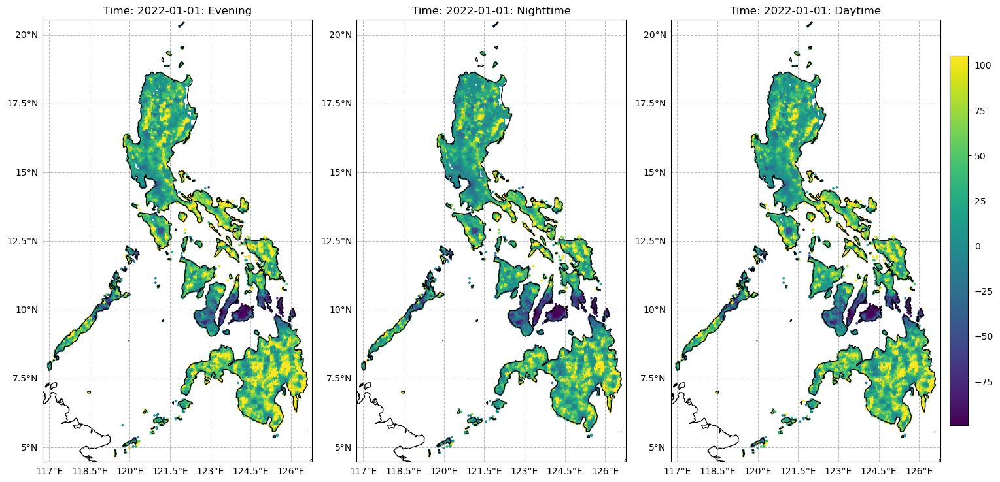

In [341]:
def plot_cuboidPoint_space(dssel, ds,markersize, extent, variable, time_type="hourly", time_dim='date_time',percentile=95):
    """
    Plot geometries from an xarray dataset with a time dimension. If the time dimension has multiple values,
    create multiple subplots, one for each time step.

    Parameters:
    ds_masked_circle (xarray.Dataset): The input dataset containing geometries and data to be plotted.
    time_dim (str): The name of the time dimension in the dataset. Default is 'time'.
    
    """
    def get_week_of_month(date):
        first_day = date - pd.Timedelta(days=date.day - 1)
        return (date.day + first_day.weekday()) // 7 + 1
    
    def categorize_time(time):
        if time.hour == 8:
            return "Nighttime"
        elif time.hour == 16:
            return "Daytime"
        elif time.hour == 0:
            return "Evening"
        else:
            return "other"

    # Convert dataset to dataframe
    df_selected = dssel.to_dataframe().reset_index()
    gdf = gpd.GeoDataFrame(df_selected, geometry='geometry')
    
    # Get bounds for plotting
    minx, miny, maxx, maxy = gdf.total_bounds
    
    # Determine normalization
    global_min = ds[variable].min().values
    #global_max = ds[variable].max().values
    global_max = np.nanpercentile(ds[variable].values, percentile)
    norm = colors.Normalize(global_min, global_max)
    print("A")
    # Check if the dataset has a time dimension
    if time_dim in dssel:
        times = dssel[time_dim].values
    
    num_times = len(times)
    num_cols = 3 if num_times >= 3 else num_times # Number of columns for subplots
    num_rows = math.ceil(num_times / num_cols) if num_times >= 4 else 1
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 16), subplot_kw={'projection': crt.crs.PlateCarree()})
    axes = axes.flatten() if num_times > 1 else [axes]

    for i, time in enumerate(times):
        print("loop")
        ax = axes[i]
        if time is not None:
            gdf_time = gdf[gdf[time_dim] == time]
        else:
            gdf_time = gdf
        
        ax.set_extent([minx - extent, maxx + extent, miny - extent, maxy+ extent], crs=crt.crs.PlateCarree())
        
        # Plot GeoDataFrame with GeoPandas
        gdf_time.plot(ax=ax, marker='o', column=variable, norm=norm, markersize=markersize, cmap='viridis')
        
        # Add a background map with Cartopy
        ax.coastlines()
        gl = ax.gridlines(draw_labels=True, crs=crt.crs.PlateCarree(), color='gray', alpha=0.5, linestyle='--')
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 10, 'color': 'black'}
        gl.ylabel_style = {'size': 10, 'color': 'black'}
        
        # Set plot title
        time = pd.Timestamp(time)
        if time_type == "daily":
            pretty_format = time.strftime('%Y-%m-%d')
        elif time_type == "weekly":
            pretty_format = time.strftime('%Y-%m-%d')
        elif time_type == "monthly":
            pretty_format = time.strftime('%Y-%M')
        else: 
            pretty_format = time.strftime('%Y-%m-%d') + ": " + categorize_time(time)

        title = f'Time: {pretty_format}'
        ax.set_title(title)

    print("B")
    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    # Adjust layout and add colorbar
    fig.tight_layout()
    sm = ScalarMappable(cmap='viridis', norm=norm)
    sm.set_array([])  # Only needed for ScalarMappable
    cbar = fig.colorbar(sm, ax=axes, orientation='vertical', fraction=0.02, pad=0.01)
    plt.show()

plot_cuboidPoint_space(ds.isel(date_time = [1,2,3]),ds, markersize=3, extent=0.2, time_type="hourly",variable="percent_change")

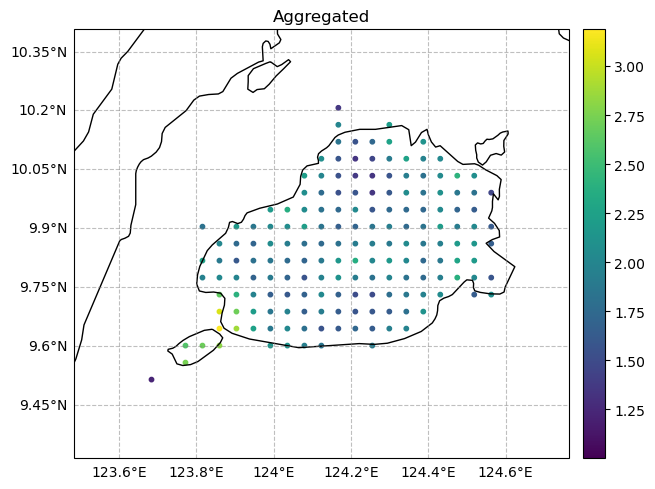

In [9]:
def plot_cuboidPoint_space_agg(dsagg, ds, markersize, extent, variable, title="Geometries Plot"):
    """
    Plot geometries from an xarray dataset that has been aggregated over time.

    Parameters:
    ds (xarray.Dataset): The input dataset containing geometries and data to be plotted.
    markersize (float): The size of the markers in the plot.
    extent (float): The extent to add to the plot bounds.
    variable (str): The variable to be plotted.
    title (str): The title for the plot.
    """
    
    # Convert dataset to dataframe
    df_selected = dsagg.to_dataframe().reset_index()
    gdf = gpd.GeoDataFrame(df_selected, geometry='geometry')
    
    # Get bounds for plotting
    minx, miny, maxx, maxy = gdf.total_bounds
    
    # Determine normalization
    global_min = ds[variable].min().values
    global_max = np.nanpercentile(ds[variable].values, 95)
    norm = colors.Normalize(global_min, global_max)
    
    fig, ax = plt.subplots(1, 1, figsize=(15, 5), subplot_kw={'projection': crt.crs.PlateCarree()})

    ax.set_extent([minx - extent, maxx + extent, miny - extent, maxy + extent], crs=crt.crs.PlateCarree())
    
    # Plot GeoDataFrame with GeoPandas
    gdf.plot(ax=ax, marker='o', column=variable, norm=norm, markersize=markersize, cmap='viridis')
    
    # Add a background map with Cartopy
    ax.coastlines()
    gl = ax.gridlines(draw_labels=True, crs=crt.crs.PlateCarree(), color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'color': 'black'}
    gl.ylabel_style = {'size': 10, 'color': 'black'}
    
    # Set plot title
    ax.set_title(title)

    # Adjust layout and add colorbar
    fig.tight_layout()
    sm = ScalarMappable(cmap='viridis', norm=norm)
    sm.set_array([])  # Only needed for ScalarMappable
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.01)
    plt.show()

aggregated_ds = ds_masked_ADM.mean(dim='date_time')
plot_cuboidPoint_space_agg(aggregated_ds,ds, markersize=10, extent=0.2, variable="n_users", title="Aggregated")

2021-12-13 to 2021-12-16 (8h)


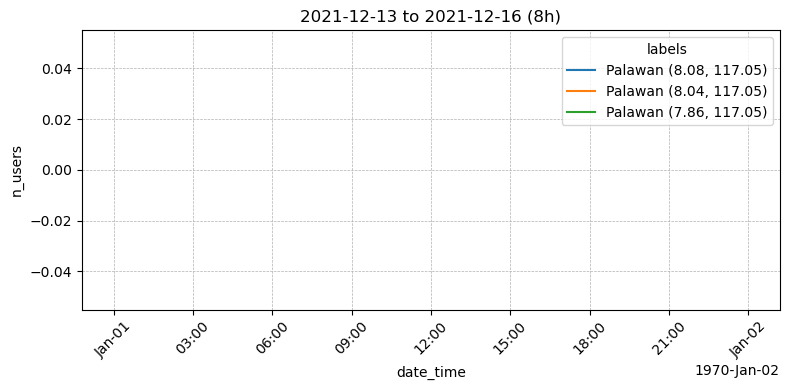

In [12]:
def plot_cuboidPoint_time(ds, geometry_indices, date_time_slice,variable = 'n_users', frequency='hourly'):
    """
    Create readable labels and plot the time series data for specified geometries in the xarray dataset.

    Parameters:
    ds_daily (xarray.Dataset): Xarray dataset containing ADM_NAME and geometry coordinates.
    geometry_indices (list): List of indices for the geometries to include in the plot.
    date_time_slice (slice): Slice object specifying the date range for the plot.

    Returns:
    None
    """
    def create_label(adm_name, point):
        return f"{adm_name} ({point.y:.2f}, {point.x:.2f})"

    # Create readable labels for the geometries
    labels = [create_label(adm, point) for adm, point in zip(ds.coords['ADM_NAME'].values, ds.coords['geometry'].values)]
    ds.coords['labels'] = ('geometry', labels)

    # Select the specified geometries and date range
    ds_time = ds.isel(geometry=geometry_indices, date_time=date_time_slice)[variable]

    # Extract date range for the title
    start_date = pd.to_datetime(ds.coords['date_time'].values[date_time_slice.start]).strftime('%Y-%m-%d')
    end_date = pd.to_datetime(ds.coords['date_time'].values[date_time_slice.stop - 1]).strftime('%Y-%m-%d')
    title = f"{start_date} to {end_date}"

    if frequency == 'daily':
        title += " (daily)"
    elif frequency == 'hourly':
        title += " (8h)"
    

    print(title)
    fig, ax = plt.subplots(figsize=(8, 4))
    # Plot the time series data with the customized legend
    lines = ds_time.plot.line(x='date_time', xincrease=True, yincrease=True,add_legend=True, hue="labels")

    geometry_indices = list(range(len(ds_time['geometry'])))
    for line, idx in zip(lines, geometry_indices):
        ds_adm = ds_time.isel(geometry=idx)
        color = line.get_color()
        ax.plot(ds_adm['date_time'], ds_adm, 'o', color=color, markersize=2, label=idx)

    ax.grid(True, which='major', linestyle='--', linewidth=0.5)
    plt.xticks(rotation=45)
    # Show the plot

    plt.title(title)
    plt.tight_layout()
    plt.show()

nan_geometries = ds['n_users'].isnull().any(dim='date_time')
ds_filtered = ds.sel(geometry=nan_geometries)

plot_cuboidPoint_time(ds_filtered, [1,2,3], slice(0,10),"n_users","hourly")

In [72]:
ds_filtered

<xarray.Dataset> Size: 24MB
Dimensions:         (date_time: 269, geometry: 5392)
Coordinates:
  * date_time       (date_time) datetime64[ns] 2kB 2021-12-31T16:00:00 ... 20...
  * geometry        (geometry) object 43kB POINT (117.00439453125 7.819846858...
    ADM_NAME        (geometry) object 43kB 'Palawan' ... 'Davao del Sur'
    labels          (geometry) <U34 733kB 'Palawan (7.82, 117.00)' ... 'Davao...
Data variables:
    n_users         (date_time, geometry) float64 12MB nan nan nan ... nan nan
    percent_change  (date_time, geometry) float64 12MB 4.091 13.72 ... 5.126

2022-01-01 to 2022-01-21 (8h)


ValueError: hue must be one of None, 'ADM_NAME', 'date_time', 'geometry'. Received 'labels' instead.

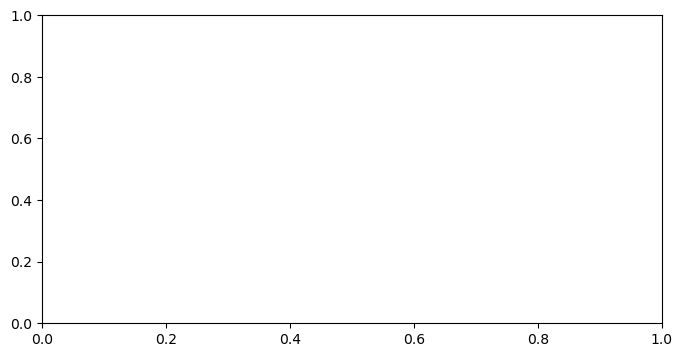

In [10]:
def plot_cuboidPoint_timeCloud(ds, geometry_indices, date_time_slice,variable = 'n_users', frequency='hourly'):
    """
    Create readable labels and plot the time series data for specified geometries in the xarray dataset.

    Parameters:
    ds_daily (xarray.Dataset): Xarray dataset containing ADM_NAME and geometry coordinates.
    geometry_indices (list): List of indices for the geometries to include in the plot.
    date_time_slice (slice): Slice object specifying the date range for the plot.

    Returns:
    None
    """
    # Select the specified geometries and date range
    ds_time = ds.isel(geometry=geometry_indices, date_time=date_time_slice)[variable]

    # Extract date range for the title
    start_date = pd.to_datetime(ds.coords['date_time'].values[date_time_slice.start]).strftime('%Y-%m-%d')
    end_date = pd.to_datetime(ds.coords['date_time'].values[date_time_slice.stop - 1]).strftime('%Y-%m-%d')
    title = f"{start_date} to {end_date}"

    if frequency == 'daily':
        title += " (daily)"
    elif frequency == 'hourly':
        title += " (8h)"
    

    print(title)
    fig, ax = plt.subplots(figsize=(8, 4))
    # Plot the time series data with the customized legend
    lines = ds_time.plot.line(x='date_time', xincrease=True, yincrease=True,add_legend=False, hue="labels",color='dodgerblue',alpha=0.2)

    geometry_indices = list(range(len(ds_time['geometry'])))
    for line, idx in zip(lines, geometry_indices):
        ds_adm = ds_time.isel(geometry=idx)
        color = line.get_color()

    ax.grid(True, which='major', linestyle='--', linewidth=0.5)
    plt.xticks(rotation=45)
    # Show the plot

    plt.title(title)
    plt.tight_layout()
    plt.show()

plot_cuboidPoint_timeCloud(ds, slice(0,300), slice(1,62),"n_users","hourly")

In [11]:
def load_cuboidPolygons(shapefile, ds):
    """
    Load geometries from a shapefile and map them to the ADM_NAME in the Xarray dataset.
    
    Parameters:
    shapefile_path (str): Path to the shapefile containing the geometries.
    tche (xarray.Dataset): Xarray dataset containing the ADM_NAME coordinate.

    Returns:
    xarray.Dataset: Updated dataset with geometries mapped to ADM_NAME.
    """
    ds = ds.groupby("ADM_NAME").mean()
    
    # Create a dictionary mapping ADM_NAME to geometry
    geometry_dict = shapefile.set_index('NAME_1')['geometry'].to_dict()
    
    # Map the geometries to the ADM_NAME in the Xarray dataset
    geometries = [geometry_dict[name] for name in ds.ADM_NAME.values]
    
    # Add geometries as a new coordinate to the Xarray dataset
    ds = ds.assign_coords(geometry=("ADM_NAME", geometries))
    
    return ds

ds_poly = load_cuboidPolygons(shapefile,ds)
ds_poly

<xarray.Dataset> Size: 352kB
Dimensions:         (ADM_NAME: 81, date_time: 269)
Coordinates:
  * date_time       (date_time) datetime64[ns] 2kB 2021-12-31T16:00:00 ... 20...
  * ADM_NAME        (ADM_NAME) object 648B 'Abra' ... 'Zamboanga del Sur'
    geometry        (ADM_NAME) object 648B POLYGON ((120.74772644100017 17.15...
Data variables:
    n_users         (ADM_NAME, date_time) float64 174kB 1.882 1.885 ... 1.852
    percent_change  (ADM_NAME, date_time) float64 174kB 42.26 41.59 ... 22.13

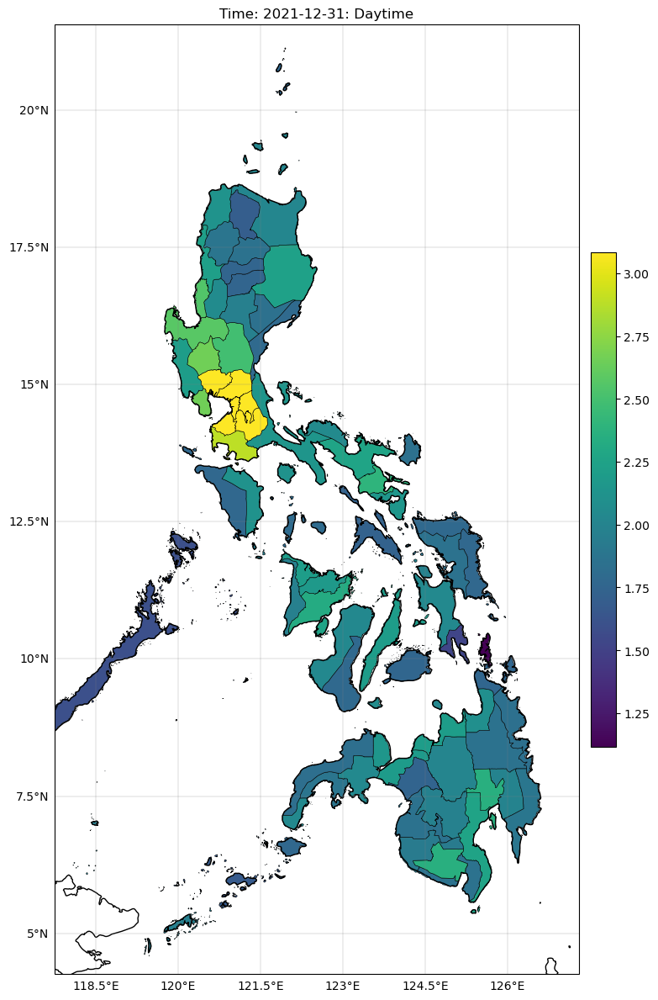

<Figure size 640x480 with 0 Axes>

In [12]:
def plot_cuboidPolygons_space(ds, variable, time_type, time_dim='date_time', geom_col='geometry', crs=crt.crs.PlateCarree(),gamma=0.5,percentile=90,cmap='viridis'):
    """
    Plots choropleth maps for each time slice in the Xarray dataset on subplots.

    Parameters:
    -----------
    ds : xarray.Dataset
        The input Xarray Dataset containing the data.
    variable : str
        The name of the variable to plot.
    time_dim : str, optional
        The name of the time dimension in the Xarray Dataset. Default is 'date_time'.
    geom_col : str, optional
        The name of the geometry column in the dataset. Default is 'geometry'.
    crs : cartopy.crs, optional
        The coordinate reference system for the plot. Default is ccrs.PlateCarree().

    Returns:
    --------
    None
        The function creates plots and does not return any value.
    """
    def categorize_time(time):
        if time.hour == 8:
            return "Nighttime"
        elif time.hour == 16:
            return "Daytime"
        elif time.hour == 0:
            return "Evening"
        else:
            return "other"
        
    if time_dim in ds:
        times = ds[time_dim].values
    else:
        times = [None]

    num_times = len(times)
    num_cols = 3 if num_times >= 3 else num_times  # Number of columns for subplots
    num_rows = math.ceil(num_times / num_cols) if num_times >= 4 else 1
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 12), subplot_kw={'projection': crs})
    axes = axes.flatten() if num_times > 1 else [axes]

    global_min = ds[variable].min().values
    #global_max = ds[variable].max().values
    
    global_max = np.nanpercentile(ds[variable].values, percentile)
    #boundaries = np.linspace(global_min, global_max, num=10)
    norm = colors.Normalize(global_min, global_max)

    for i, time in enumerate(times):
        ax = axes[i]

        data_at_time = ds.sel({time_dim: time})

        # Create a GeoDataFrame from the Xarray dataset
        gdf = gpd.GeoDataFrame(
            data={
                'ADM_NAME': data_at_time.ADM_NAME.values,
                variable: data_at_time[variable].values
            },
            geometry=data_at_time[geom_col].values
        )
        
        # Calculate the centroids of the geometries
        centroids = gdf.geometry.centroid

        # Determine the extent based on the centroids
        minx, miny, maxx, maxy = centroids.total_bounds

        # Define a margin (optional, to add some space around the extent)
        margin = 1.0  # degrees
        extent = [minx - margin, maxx + margin, miny - margin, maxy + margin]

        # Draw the map
        ax.set_extent(extent, crs=crs)
        ax.coastlines()
        
        # Add gridlines
        gl = ax.gridlines(draw_labels=True, linewidth=0.2, color='gray', alpha=1, linestyle='-')
        gl.top_labels = False
        gl.right_labels = False

        # Plotting with black boundaries
        gdf.plot(column=variable, ax=ax, cmap=cmap, norm=norm,
                    edgecolor='black', linewidth=0.4)
        
        # Set plot title
        time = pd.Timestamp(time)
        if time_type == "daily":
            pretty_format = time.strftime('%Y-%m-%d')
        elif time_type == "weekly":
            pretty_format = time.strftime('%Y-%m-%d')
        elif time_type == "monthly":
            pretty_format = time.strftime('%Y-%M')
        else: 
            pretty_format = time.strftime('%Y-%m-%d') + ": " + categorize_time(time)

        title = f'Time: {pretty_format}'
        ax.set_title(title)

    # Remove empty subplots if num_times < num_rows * num_cols
    for j in range(i + 1, num_rows * num_cols):
        fig.delaxes(axes[j])

    fig.tight_layout()
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Only needed for ScalarMappable
    cbar = fig.colorbar(sm, ax=axes, orientation='vertical', fraction=0.02, pad=0.01)
    plt.show()

    plt.tight_layout()
    plt.show()

plot_cuboidPolygons_space(ds_poly.isel(date_time=[0]),"n_users","hourly",gamma=0.5,percentile=95,cmap='viridis')

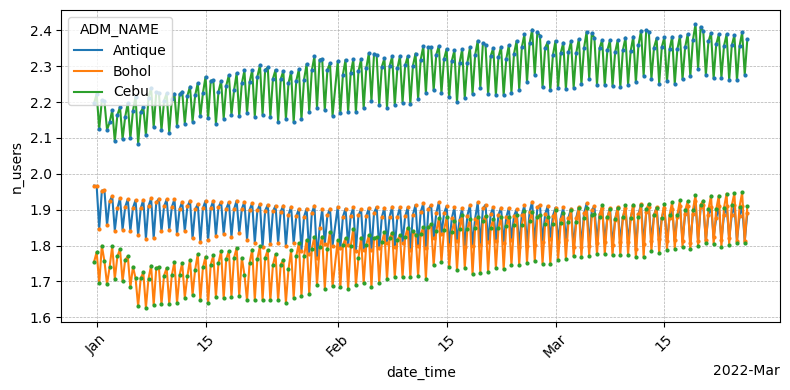

In [13]:
def plot_cuboidPolygon_time(ds, adm_names, date_time_slice):
    """
    Create readable labels and plot the time series data for specified geometries in the xarray dataset.

    Parameters:
    ds (xarray.Dataset): Xarray dataset containing ADM_NAME and geometry coordinates.
    adm_names (list): List of administrative names to include in the plot.
    date_time_slice (slice): Slice object specifying the date range for the plot.

    Returns:
    None
    """

    mask = ds.ADM_NAME.isin(adm_names)
    ds_filtered = ds.where(mask, drop=True)
    # Select the specified geometries by ADM_NAME and date range
    ds_time = ds_filtered.isel(date_time=date_time_slice)['n_users']

    fig, ax = plt.subplots(figsize=(8, 4))
    # Plot the time series data with the customized legend
    lines = ds_time.plot.line(x='date_time', xincrease=True, yincrease=True,add_legend=True)

    for line, adm_name in zip(lines, adm_names):
        ds_adm = ds_time.sel(ADM_NAME=adm_name)
        color = line.get_color()
        ax.plot(ds_adm['date_time'], ds_adm, 'o', color=color, markersize=2, label=adm_name)

    ax.grid(True, which='major', linestyle='--', linewidth=0.5)
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    # Show the plot

    plt.tight_layout()
    plt.show()

# Example usage:
plot_cuboidPolygon_time(ds_poly, ['Cebu','Antique','Bohol'], slice(0, 252))

In [14]:
from typing import Union

def rasterize_points(points: np.ndarray, res: Union[int, float], bbox: tuple) -> np.ndarray:
    """Rasterize points into a grid with a given resolution.

    Args:
        points (np.ndarray): Points to rasterize, with columns (x, y, value) (for
            geographic coordinates, use (lon, lat, value))
        res (Union[int, float]): Resolution of the grid
        bbox (tuple): Bounding box of the grid

    Returns:
        np.ndarray: Rasterized grid
    """
    width = int((bbox[2] - bbox[0]) / res)
    height = int((bbox[3] - bbox[1]) / res)

    rast = np.zeros((height, width), dtype=np.float32)
    count_array = np.zeros_like(rast)

    for x, y, value in points:
        col = int((x - bbox[0]) / res)
        row = int((bbox[3] - y) / res)
        
        # Clamp row and col to the valid range
        col = max(0, min(col, width - 1))
        row = max(0, min(row, height - 1))
        
        rast[row, col] += value
        count_array[row, col] += 1

    # Avoid division by zero
    count_array[count_array == 0] = -1

    # Calculate the average
    rast = rast / count_array

    rast[count_array == -1] = np.nan
    return rast

variables = ["n_crisis","percent_change"]
# Assuming ds is your original xarray.Dataset
# Step 1: Initialize an empty list to store individual DataArrays
all_dataarrays = {}


# Get the bounding box and resolution
gdf_sample = gpd.GeoDataFrame(ds.isel(date_time=0).to_dataframe().reset_index(), geometry='geometry')
bbox = gdf_sample.total_bounds  # (minx, miny, maxx, maxy)
resolution = 0.05

ds_test = ds.isel(date_time = [0,1,2])

for date_time in ds_test.date_time:
    df_selected = ds_test.sel(date_time=date_time).to_dataframe().reset_index()
    gdf = gpd.GeoDataFrame(df_selected, geometry='geometry')
    gdf['x'] = gdf.geometry.x
    gdf['y'] = gdf.geometry.y

    # Loop through each column to rasterize
    for column in gdf.columns:
        if column in variables:
            gdf['value'] = gdf[column]
            points = gdf[['x', 'y', 'value']].to_numpy()

            # Rasterize the points
            raster = rasterize_points(points, resolution, bbox)

            # Convert to xarray.DataArray
            height, width = raster.shape
            coords = {
                'lat': np.linspace(bbox[3], bbox[1], height),  # From maxy to miny
                'lon': np.linspace(bbox[0], bbox[2], width)   # From minx to maxx
            }
            data_array = xr.DataArray(raster, dims=('lat', 'lon'), coords=coords, name=column)
            data_array = data_array.expand_dims(dim={'date_time': [date_time.values]})

            # Store the DataArray in the dictionary
            if column not in all_dataarrays:
                all_dataarrays[column] = [data_array]
            else:
                all_dataarrays[column].append(data_array)

# Combine all DataArrays for each variable into a single xarray.Dataset
dataset_dict = {var: xr.concat(arrays, dim='date_time') for var, arrays in all_dataarrays.items()}
combined_dataset = xr.Dataset(dataset_dict)

# Display the combined xarray.Dataset
print(combined_dataset)
combined_dataset

<xarray.Dataset> Size: 725kB
Dimensions:         (date_time: 3, lat: 313, lon: 192)
Coordinates:
  * date_time       (date_time) datetime64[ns] 24B 2021-12-31T16:00:00 ... 20...
  * lat             (lat) float64 3kB 20.37 20.31 20.26 ... 4.776 4.725 4.675
  * lon             (lon) float64 2kB 117.0 117.0 117.1 ... 126.5 126.5 126.6
Data variables:
    percent_change  (date_time, lat, lon) float32 721kB nan nan nan ... nan nan


<xarray.Dataset> Size: 725kB
Dimensions:         (date_time: 3, lat: 313, lon: 192)
Coordinates:
  * date_time       (date_time) datetime64[ns] 24B 2021-12-31T16:00:00 ... 20...
  * lat             (lat) float64 3kB 20.37 20.31 20.26 ... 4.776 4.725 4.675
  * lon             (lon) float64 2kB 117.0 117.0 117.1 ... 126.5 126.5 126.6
Data variables:
    percent_change  (date_time, lat, lon) float32 721kB nan nan nan ... nan nan

In [15]:
all_dataarrays = {}


# Get the bounding box and resolution
gdf_sample = gpd.GeoDataFrame(ds.isel(date_time=0).to_dataframe().reset_index(), geometry='geometry')
bbox = gdf_sample.total_bounds  # (minx, miny, maxx, maxy)
resolution = 0.05

In [16]:
def load_cuboidRaster(ds: xr.Dataset, variables, resolution: float = 0.05) -> xr.Dataset:
    """
    Rasterize selected variables from an xarray.Dataset into a cuboid raster dataset.

    Args:
        ds (xr.Dataset): Input xarray.Dataset with point data.
        variables (List[str]): List of variable names to rasterize.
        resolution (float): Resolution of the grid. Default is 0.05.

    Returns:
        xr.Dataset: Combined xarray.Dataset with dimensions (lat, lon, date_time)
    """
    def rasterize_points(points: np.ndarray, res: float, bbox: tuple) -> np.ndarray:
   
        width = int((bbox[2] - bbox[0]) / res)
        height = int((bbox[3] - bbox[1]) / res)

        rast = np.zeros((height, width), dtype=np.float32)
        count_array = np.zeros_like(rast)

        for x, y, value in points:
            col = int((x - bbox[0]) / res)
            row = int((bbox[3] - y) / res)
            
            # Clamp row and col to the valid range
            col = max(0, min(col, width - 1))
            row = max(0, min(row, height - 1))
            
            rast[row, col] += value
            count_array[row, col] += 1

        # Avoid division by zero
        count_array[count_array == 0] = -1

        # Calculate the average
        rast = rast / count_array

        rast[count_array == -1] = np.nan
        return rast
    
    all_dataarrays = {}
    
    # Get the bounding box and resolution
    bbox = gdf_sample.total_bounds  # (minx, miny, maxx, maxy)
    print(bbox)
    for date_time in ds.date_time:
        df_selected = ds.sel(date_time=date_time).to_dataframe().reset_index()
        gdf = gpd.GeoDataFrame(df_selected, geometry='geometry')
        gdf['x'] = gdf.geometry.x
        gdf['y'] = gdf.geometry.y

        # Loop through each column to rasterize
        for column in gdf.columns:
            if column in variables:
                gdf['value'] = gdf[column]
                points = gdf[['x', 'y', 'value']].to_numpy()

                # Rasterize the points
                raster = rasterize_points(points, resolution, bbox)

                # Convert to xarray.DataArray
                height, width = raster.shape
                coords = {
                    'lat': np.linspace(bbox[3], bbox[1], height),  # From maxy to miny
                    'lon': np.linspace(bbox[0], bbox[2], width)   # From minx to maxx
                }
                data_array = xr.DataArray(raster, dims=('lat', 'lon'), coords=coords, name=column)
                data_array = data_array.expand_dims(dim={'date_time': [date_time.values]})

                # Store the DataArray in the dictionary
                if column not in all_dataarrays:
                    all_dataarrays[column] = [data_array]
                else:
                    all_dataarrays[column].append(data_array)

    # Combine all DataArrays for each variable into a single xarray.Dataset
    dataset_dict = {var: xr.concat(arrays, dim='date_time') for var, arrays in all_dataarrays.items()}
    combined_dataset = xr.Dataset(dataset_dict)
    return combined_dataset

# Example usage
variables = ["n_users", "percent_change"]
# Assuming ds is your original xarray.Dataset
ds_test = ds.isel(date_time=slice(0, 7)) 
combined_dataset = load_cuboidRaster(ds_test, variables,resolution=0.05)

# Display the combined xarray.Dataset
print(combined_dataset)
combined_dataset

[116.96044922   4.67497947 126.58447266  20.36522616]
<xarray.Dataset> Size: 3MB
Dimensions:         (date_time: 7, lat: 313, lon: 192)
Coordinates:
  * date_time       (date_time) datetime64[ns] 56B 2021-12-31T16:00:00 ... 20...
  * lat             (lat) float64 3kB 20.37 20.31 20.26 ... 4.776 4.725 4.675
  * lon             (lon) float64 2kB 117.0 117.0 117.1 ... 126.5 126.5 126.6
Data variables:
    n_users         (date_time, lat, lon) float32 2MB nan nan nan ... nan nan
    percent_change  (date_time, lat, lon) float32 2MB nan nan nan ... nan nan


<xarray.Dataset> Size: 3MB
Dimensions:         (date_time: 7, lat: 313, lon: 192)
Coordinates:
  * date_time       (date_time) datetime64[ns] 56B 2021-12-31T16:00:00 ... 20...
  * lat             (lat) float64 3kB 20.37 20.31 20.26 ... 4.776 4.725 4.675
  * lon             (lon) float64 2kB 117.0 117.0 117.1 ... 126.5 126.5 126.6
Data variables:
    n_users         (date_time, lat, lon) float32 2MB nan nan nan ... nan nan
    percent_change  (date_time, lat, lon) float32 2MB nan nan nan ... nan nan

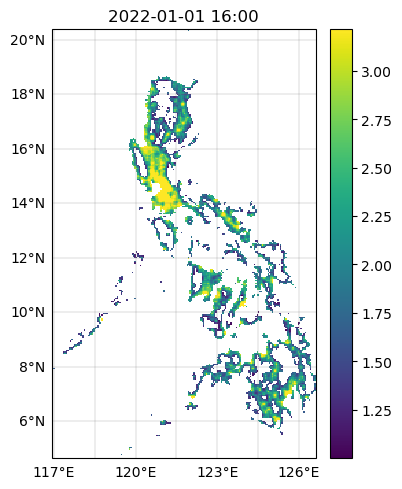

<Figure size 640x480 with 0 Axes>

In [17]:
def plot_cuboidRaster_space(ds: xr.Dataset, variable: str, time_dim: str = 'date_time', crs=crt.crs.PlateCarree()):
    """
    Plot the specified variable for multiple time steps in a grid of subplots.

    Args:
        ds (xr.Dataset): Input xarray.Dataset containing the data.
        variable (str): The name of the variable to plot.
        time_dim (str): The name of the time dimension. Default is 'date_time'.
        crs (cartopy.crs.CRS): The Cartopy coordinate reference system to use for plotting.
    """
    pretty_format = ds.date_time.dt.strftime('%Y-%m-%d %H:%M').values

    # Replace the existing time coordinates with the formatted strings
    ds = ds.assign_coords(date_time=pretty_format)
    if time_dim in ds:
        times = ds[time_dim].values
    else:
        times = [None]

    global_min = ds[variable].min().values
    #global_max = ds[variable].max().values
    global_max = np.nanpercentile(ds[variable].values, 95)
    norm = colors.Normalize(global_min,global_max)
    

    num_times = len(times)
    num_cols = 3 if num_times >= 3 else num_times  # Number of columns for subplots
    num_rows = math.ceil(num_times / num_cols) if num_times >= 4 else 1
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5), subplot_kw={'projection': crs})
    axes = axes.flatten() if num_times > 1 else [axes]
    
    for i, time in enumerate(times):
        ax = axes[i]
        data_to_plot = ds.sel({time_dim: time})
        data_to_plot[variable].plot(ax=ax,transform=crt.crs.PlateCarree(),norm=norm,add_colorbar=False)
        ax.set_title(f'{str(time)}')
        gl = ax.gridlines(draw_labels=True, linewidth=0.2, color='gray', alpha=1, linestyle='-')
        gl.top_labels = False
        gl.right_labels = False
        
        # Rotate x-axis labels for readability
        for label in ax.get_xticklabels():
            label.set_rotation(45)
            label.set_horizontalalignment('right')
    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
        
    fig.tight_layout()
    sm = ScalarMappable(cmap='viridis', norm=norm)
    sm.set_array([])  # Only needed for ScalarMappable
    cbar = fig.colorbar(sm, ax=axes, orientation='vertical', fraction=0.02, pad=0.01)
    
    plt.show()
    plt.tight_layout()
    plt.show()

# Example usage
variables = ["n_crisis", "percent_change"]
ds_test = ds.isel(date_time=slice(0, 50))  # Select the first 50 date_time entries

plot_cuboidRaster_space(combined_dataset.isel(date_time=[3]), 'n_users')

In [283]:
def plot_cuboidRaster_space_NT(ds: xr.Dataset, variable: str, min,max,title, crs=crt.crs.PlateCarree(), extent=1,shapefile=None):
    """
    Plot the specified variable for the spatial dimensions in the dataset.

    Args:
        ds (xr.Dataset): Input xarray.Dataset containing the data.
        variable (str): The name of the variable to plot.
        crs (cartopy.crs.CRS): The Cartopy coordinate reference system to use for plotting.
    """
    lon_grid, lat_grid = np.meshgrid(ds.lon.values, ds.lat.values)
    
    if shapefile is not None:
        # Load shapefile
        gdf = shapefile
        
        # Create mask
        mask = np.full(lon_grid.shape, False)
        for i in range(lon_grid.shape[0]):
            for j in range(lon_grid.shape[1]):
                if np.isnan(ds[variable].values[i, j]):
                    continue
                point = sp.Point(lon_grid[i, j], lat_grid[i, j])
                if gdf.intersects(point).any():
                    mask[i, j] = True
        # Apply mask to data
        ds[variable] = ds[variable].where(mask)

        
    global_min = min
    global_max = max
    norm = colors.Normalize(vmin=global_min, vmax=global_max)
    
    fig, ax = plt.subplots(figsize=(15, 10), subplot_kw={'projection': crs})
    
    data_to_plot = ds[variable]
    im = data_to_plot.plot(ax=ax, transform=crt.crs.PlateCarree(), norm=norm, add_colorbar=False, cmap='viridis')

    # Set extent using the bounds of the data
    lon_min, lon_max = ds.lon.min().item(), ds.lon.max().item()
    lat_min, lat_max = ds.lat.min().item(), ds.lat.max().item()
    ax.set_extent([lon_min - extent, lon_max + extent, lat_min - extent, lat_max + extent], crs=crt.crs.PlateCarree())
    # Add coastlines
    ax.coastlines()

    ax.set_title(title)
    gl = ax.gridlines(draw_labels=True, linewidth=0.2, color='gray', alpha=1, linestyle='-')
    gl.top_labels = False
    gl.right_labels = False
    
    # Rotate x-axis labels for readability
    for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_horizontalalignment('right')
    
    fig.tight_layout()
    sm = ScalarMappable(cmap='viridis', norm=norm)
    sm.set_array([])  # Only needed for ScalarMappable
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.01)
    
    plt.show()
    plt.tight_layout()
    plt.show()

Secon part : Temporal STUFF

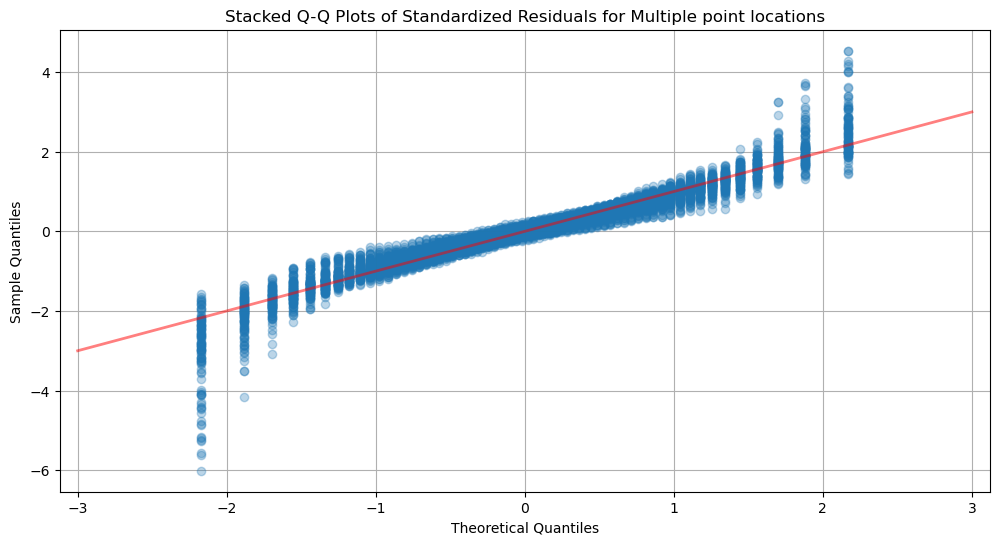

In [251]:
nan_geometries = ds['n_users'].isnull().any(dim='date_time')
ds_filtered = ds.isel(date_time=slice(200,269)).sel(geometry=~nan_geometries)
# Number of geometries available in ds_filtered
num_geometries = ds_filtered.geometry.size

# Select 5 random indices + the example index 350
random_indices = np.random.choice(range(num_geometries), size=100, replace=False)

# Include the example index (350)
selected_indices = np.concatenate(([350], random_indices))

# Initialize the plot
plt.figure(figsize=(12, 6))

# Iterate over the selected indices and fit the model, then plot residuals
for i, idx in enumerate(selected_indices):
    # Extract the time series data for this geometry
    time_data = ds_filtered.isel(geometry=idx)["n_users"]
    
    # Fit SARIMA model with seasonality every 3 days
    seasonal_order = (0, 1, 1, 3)  # Seasonal order for every 3 days
    order = (2, 0, 0)  # Non-seasonal order
    model = SARIMAX(time_data.values[0:90], order=order, seasonal_order=seasonal_order)
    model_fit = model.fit(disp=False, maxiter=200)
    
    # Standardize the residuals
    residuals = model_fit.resid[3:]  # Remove the first few values due to differencing
    standardized_residuals = (residuals - np.mean(residuals)) / np.std(residuals)
    
    # Generate the Q-Q plot data without the fitted red line
    sm.qqplot(standardized_residuals, line=None, alpha=0.3, color='blue', lw=0.5, ax=plt.gca())

# Add a red reference line for normality
x = np.linspace(-3, 3, 100)
plt.plot(x, x, color='red', lw=2, alpha=0.5)

# Finalize the plot
plt.title('Stacked Q-Q Plots of Standardized Residuals for Multiple point locations')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(True)
plt.show()

# Insérer passage residuals
# Insérer passage 

<xarray.Dataset> Size: 9MB
Dimensions:         (date_time: 69, geometry: 7654)
Coordinates:
  * date_time       (date_time) datetime64[ns] 552B 2022-03-08T16:00:00 ... 2...
  * geometry        (geometry) object 61kB POINT (117.04833984375 7.993956856...
    ADM_NAME        (geometry) object 61kB 'Palawan' ... 'Davao del Sur'
Data variables:
    n_users         (date_time, geometry) float64 4MB 1.628 1.415 ... 2.052
    percent_change  (date_time, geometry) float64 4MB 24.48 20.94 ... 13.44
7654


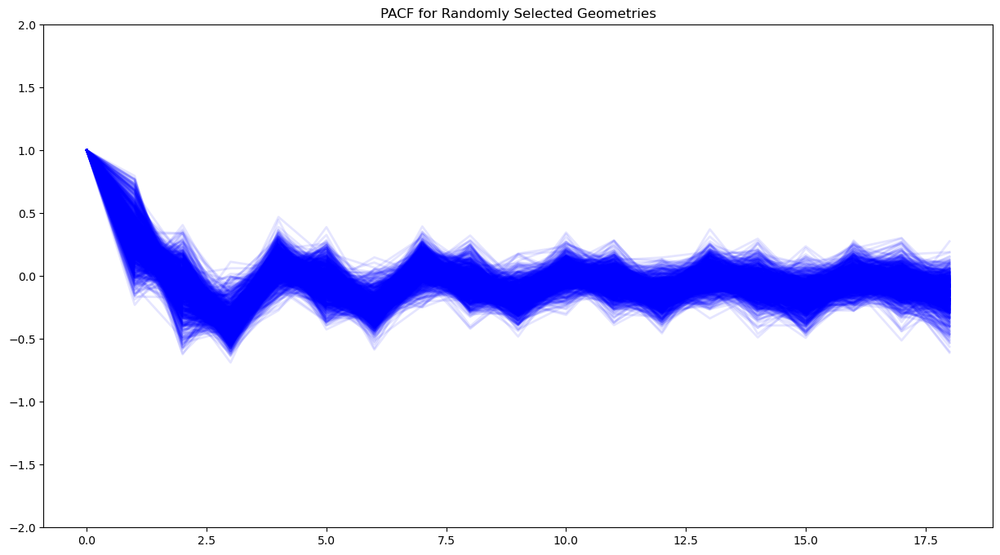

In [10]:
nan_geometries = ds['n_users'].isnull().any(dim='date_time')
ds_filtered = ds.isel(date_time=slice(200,269)).sel(geometry=~nan_geometries)

print(ds_filtered)
# Select 50 random geometries from the filtered dataset
num_geometries = len(ds_filtered.geometry)
print(num_geometries)
random_indices = random.sample(range(num_geometries), 1000)

# Create a figure and axes for the stacked plot
fig, ax1 = plt.subplots(1, figsize=(15, 8))

# Loop through the selected geometries and plot their gamma lines
for idx in random_indices:
    field_values = ds_filtered.isel(geometry=idx)["n_users"].values
    date_time_coords = ds_filtered.coords['date_time'].values

    # Create a pandas Series with the date_time_index and field_values
    time_series = pd.Series(field_values, index=date_time_coords)
    
    # Differentiation with lag of 3
    diff_3 = time_series.diff(periods=3).dropna()
    
    # Calculate the variance of the time series
    variance = np.var(diff_3)
    
    # Calculate ACF values
    acf_values = pacf(diff_3,method="ywm")

    # Convert ACF to covariance function
    gamma = (1 - acf_values) * variance
    
    ax1.plot(np.arange(19), acf_values, alpha=0.1,color="blue",linewidth=2)
    ax1.set_ylim([-2, 2])
    ax1.set_title("PACF for Randomly Selected Geometries")


In [13]:
def create_label(adm, point):
    return f"{adm} ({point.x:.2f}, {point.y:.2f})"

[ 1.          0.49331809  0.02543019 -0.42936959  0.00431937 -0.02931041
 -0.33833221  0.26550526 -0.10113025 -0.30103977  0.07691614  0.00701952
 -0.08157649 -0.13007018 -0.22801236 -0.32033681  0.01391314 -0.0230649
 -0.37352807  0.25262182  0.06031639 -0.05768325  0.01918728 -0.00957898
  0.00185363  0.10595518  0.00129763 -0.01957802 -0.0994343   0.04952987
  0.00223263]


C:\Users\Admin\AppData\Local\Temp\ipykernel_24248\355306859.py:2: RuntimeWarning: overflow encountered in exp
  return L / (1 + np.exp(-k * (x - x0))) + C
C:\Users\Admin\AppData\Local\Temp\ipykernel_24248\355306859.py:24: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(exp, lags_acf_len, lag_acf)


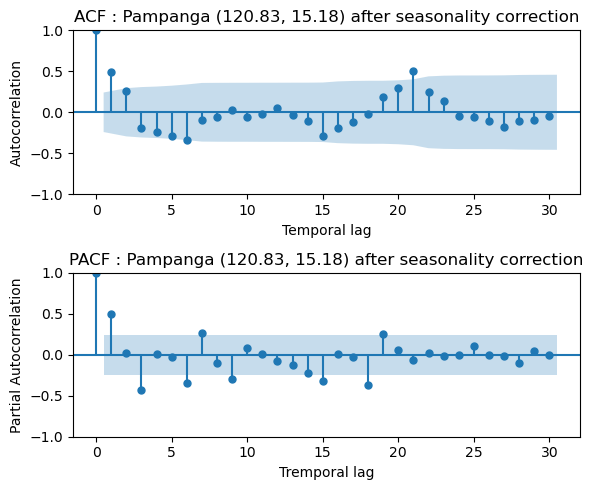

In [14]:

def exp(x, L, k, x0, C):
    return L / (1 + np.exp(-k * (x - x0))) + C

def create_label(adm, point):
    return f"{adm} ({point.x:.2f}, {point.y:.2f})"

def plot_acf_pacf_with_geometry(ds, geometry_index, coefficients, nlags=10):
    # Extract the ADM_NAME and geometry
    adm_name = ds.coords['ADM_NAME'].values[geometry_index]
    point = sp.Point(ds.coords['geometry'].values[geometry_index])

    # Create label for title
    label = create_label(adm_name, point) 
    
    # Select the time data for the specified geometry
    time_data = pd.Series(ds.isel(geometry=geometry_index)["n_users"])

    # Decompose the time series to remove seasonality
    decomposition = time_data.diff(periods=3).dropna()

    # Calculate ACF values
    lag_acf = acf(decomposition, nlags=nlags)
    lags_acf_len = np.arange(len(lag_acf))
    popt, pcov = curve_fit(exp, lags_acf_len, lag_acf)
    fitted_curve = exp(lags_acf_len, *popt)

    # Plot ACF and PACF
    fig, axes = plt.subplots(2, 1, figsize=(6, 5))

    plot_acf(decomposition, lags=nlags, ax=axes[0], alpha=0.05)
    #axes[0].plot(lags_acf_len, fitted_curve, color='red', linestyle='--', linewidth=2, label='Fitted Curve')
    axes[0].set_title(f'ACF : {label} after seasonality correction')
    axes[0].set_xlabel('Temporal lag')
    axes[0].set_ylabel('Autocorrelation')

    plot_pacf(decomposition, lags=nlags, method="ywm", ax=axes[1], alpha=0.05)
    print(pacf(decomposition, nlags=30,method="ywm"))
    axes[1].set_title(f'PACF : {label} after seasonality correction')
    axes[1].set_xlabel('Tremporal lag')
    axes[1].set_ylabel('Partial Autocorrelation')
    plt.tight_layout()
    plt.show()


plot_acf_pacf_with_geometry(ds_filtered, geometry_index=1500, coefficients=[1, -3],nlags=30)

In [15]:
import itertools

# Define the p, d, q, P, D, Q, s parameter ranges
p = range(0, 3)
d = range(0, 2)
q = range(0, 3)
P = range(0, 2)
D = range(0, 2)
Q = range(0, 2)
s = [3]  # Seasonal period

# Generate all different combinations of p, d, q, P, D, Q
pdq = list(itertools.product(p, d, q))
seasonal_pdq = list(itertools.product(P, D, Q, s))

# Function to evaluate SARIMA model
def evaluate_sarima_model(series, pdq, seasonal_pdq):
    results = []

    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                model = SARIMAX(series,
                                order=param,
                                seasonal_order=param_seasonal,
                                enforce_stationarity=True)
                model_fit = model.fit(disp=False)
                bic = model_fit.bic
                results.append((param, param_seasonal, bic))
            except:
                continue
    return results

# Evaluate SARIMA models and store the results
results = evaluate_sarima_model(ds_filtered.isel(geometry=350)["n_users"].values, pdq, seasonal_pdq)

# Convert the results into a DataFrame
results_df = pd.DataFrame(results, columns=['pdq', 'seasonal_pdq', 'bic'])
results_df

c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


,pdq,seasonal_pdq,bic
0,"(0, 0, 0)","(0, 0, 0, 3)",333.916259
1,"(0, 0, 0)","(0, 0, 1, 3)",254.977177
2,"(0, 0, 0)","(0, 1, 0, 3)",-413.024657
3,"(0, 0, 0)","(0, 1, 1, 3)",-423.977540
4,"(0, 0, 0)","(1, 0, 0, 3)",-394.399184
...,...,...,...
139,"(2, 1, 2)","(0, 1, 1, 3)",-410.420259
140,"(2, 1, 2)","(1, 0, 0, 3)",-390.260609
141,"(2, 1, 2)","(1, 0, 1, 3)",-406.579496
142,"(2, 1, 2)","(1, 1, 0, 3)",-396.169484


                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                   69
Model:             SARIMAX(1, 0, 0)x(0, 1, [1], 3)   Log Likelihood                 131.906
Date:                             Mon, 12 Aug 2024   AIC                           -257.811
Time:                                     17:31:24   BIC                           -251.242
Sample:                                          0   HQIC                          -255.216
                                              - 69                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4248      0.109      3.908      0.000       0.212       0.638
ma.S.L3       -0.9791      

<Figure size 1000x600 with 0 Axes>

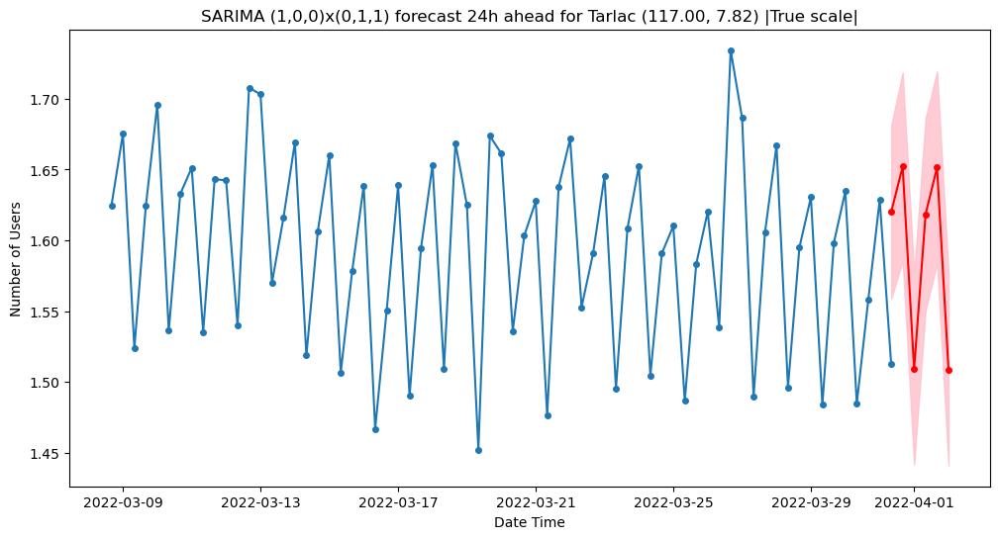

<Figure size 1000x600 with 0 Axes>

In [14]:
forecast_steps = 6
ts_series = ds_filtered.isel(geometry=2120)["n_users"].values
date_time = ds_filtered.isel(geometry=2120)["date_time"].values

adm_name = ds_filtered.isel(geometry=2120).coords['ADM_NAME'].values
point = sp.Point(ds.coords['geometry'].values[0])

# Create label for title
label = create_label(adm_name, point) 

forecast_dates = pd.date_range(start=date_time[-1], periods=forecast_steps, freq='8h')
# Define SARIMA model parameters (these should be chosen based on your specific use case)
order = (1, 0, 0)
seasonal_order = (0, 1, 1, 3)

# Fit SARIMA model
model = SARIMAX(ts_series, order=order, seasonal_order=seasonal_order)
model_fit = model.fit(disp=False)
print(model_fit.summary())

forecast = model_fit.get_forecast(steps=forecast_steps)
forecast_mean = forecast.predicted_mean
confidence_intervals = forecast.conf_int()

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(date_time[0:], ts_series[0:], label='Observed', marker='o', linestyle='-', markersize=4)
ax.set_xlabel("Date Time")
ax.set_ylabel("Number of Users")
ax.plot(forecast_dates, forecast_mean, label='Forecast', color='r', marker='o', linestyle='-', markersize=4)
plt.fill_between(forecast_dates, confidence_intervals[:, 0], confidence_intervals[:, 1], color='pink', alpha=0.8)
plt.title("SARIMA (1,0,0)x(0,1,1) forecast 24h ahead for " + label + " |True scale|")
plt.figure(figsize=(10, 6))



                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                   69
Model:             SARIMAX(1, 0, 0)x(0, 1, [1], 3)   Log Likelihood                 131.906
Date:                             Mon, 12 Aug 2024   AIC                           -257.811
Time:                                     17:31:31   BIC                           -251.242
Sample:                                          0   HQIC                          -255.216
                                              - 69                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4248      0.109      3.908      0.000       0.212       0.638
ma.S.L3       -0.9791      

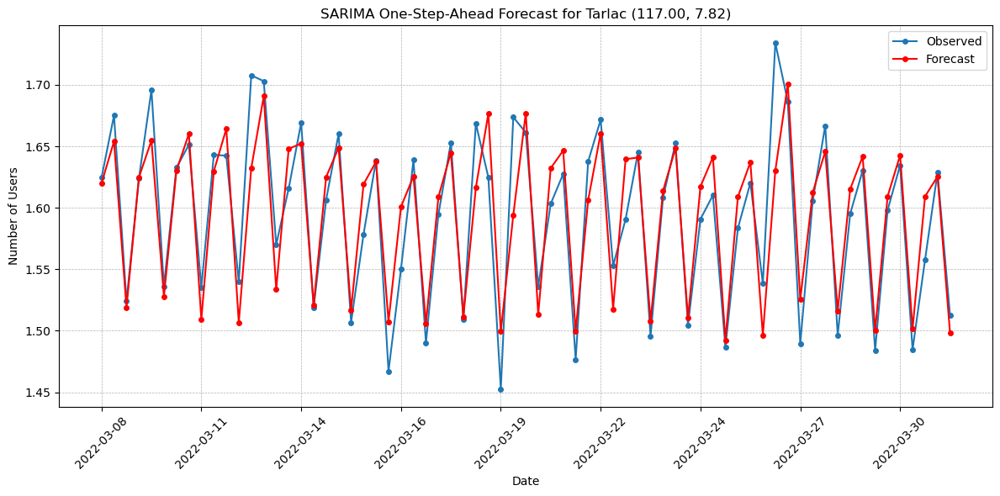

In [15]:
order = (1, 0, 0)
seasonal_order = (0, 1, 1, 3)

start_point = 0
history = ts_series
model = SARIMAX(history, order=order, seasonal_order=seasonal_order)
model_fit = model.fit(disp=False)
print(model_fit.summary())
predictions = []
conf_intervals = []

# Perform rolling forecast using append
for t in range(start_point, len(ts_series)):
    forecast = model_fit.get_forecast(steps=1)
    yhat = forecast.predicted_mean
    conf_int = forecast.conf_int(alpha=0.1)
    
    predictions.append(yhat[0])
    conf_intervals.append(conf_int[0].tolist())
    
    # Update the model with the new observation
    model_fit = model_fit.append([ts_series[t]], refit=False)

predictions = np.array(predictions)
conf_intervals = np.array(conf_intervals)

# Create a range for the forecast dates
forecast_dates = date_time[start_point:]

# Plotting
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the observed data
ax.plot(date_time[start_point:], ts_series[start_point:], label='Observed', marker='o', linestyle='-', markersize=4)

# Plot the forecasted data
ax.plot(forecast_dates, predictions, label='Forecast', color='r', marker='o', linestyle='-', markersize=4)

# Plot the confidence intervals
#ax.fill_between(forecast_dates, conf_intervals[:, 0], conf_intervals[:, 1], color='pink', alpha=0.3)

# Customize grid and labels
ax.grid(True, which='major', linestyle='--', linewidth=0.5)

# Formatting the x-axis for dates
ax.set_xticks(date_time[start_point::8])  # Adjust this based on your data frequency for better readability
ax.set_xticklabels(pd.to_datetime(date_time[start_point::8]).strftime('%Y-%m-%d'), rotation=45)

plt.xlabel('Date')
plt.ylabel('Number of Users')
plt.title('SARIMA One-Step-Ahead Forecast for ' + label)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [235]:
warnings.filterwarnings("ignore")

def forecast_sarima(ts_series, order, seasonal_order, steps=3):
    model = SARIMAX(ts_series, order=order, seasonal_order=seasonal_order)
    model_fit = model.fit(disp=False)
    forecast = model_fit.get_forecast(steps=steps)
    return forecast.predicted_mean

def create_forecast_dataset(ds_filtered, order, seasonal_order, steps=6):
    """
    Create a forecast dataset using SARIMA model.
    
    Parameters:
    ds_filtered (xarray.Dataset): The filtered input dataset containing 'n_users' and 'geometry' data.
    order (tuple): The (p,d,q) order of the model for the number of AR parameters, differences, and MA parameters.
    seasonal_order (tuple): The (P,D,Q,s) order of the seasonal component of the model.
    steps (int): Number of steps to forecast.
    
    Returns:
    ds_forecast (xarray.Dataset): A new xarray dataset containing the forecasts.
    """
    # Get the list of geometries and ADM_NAME
    geometries = ds_filtered.geometry.values
    ADM_NAME = ds_filtered.ADM_NAME.values

    # Create arrays to hold the forecast results
    forecast_data = np.zeros((steps, len(geometries)))

    # Loop through each geometry and apply the forecast function
    for i, geom in enumerate(geometries):
        ts_series = ds_filtered.sel(geometry=geom)["n_users"].values
        forecast_data[:, i] = forecast_sarima(ts_series, order, seasonal_order, steps=steps)

    # Create a new time index for the forecasted steps
    last_date = pd.to_datetime(ds_filtered.date_time.values[-1])
    forecast_dates = [last_date + pd.Timedelta(hours=8) * (i + 1) for i in range(steps)]

    # Create the new xarray dataset for forecasts
    ds_forecast = xr.Dataset(
        {
            "n_users": (("date_time", "geometry"), forecast_data)
        },
        coords={
            "geometry": geometries,
            "ADM_NAME": (("geometry"), ADM_NAME),
            "date_time": forecast_dates
        }
    )
    
    return ds_forecast

# Example usage
order = (1, 0, 0)
seasonal_order = (1, 1, 1, 3)  # Adjust seasonal period based on your data frequency
ds_filtered2 = ds_filtered.isel(date_time=slice(0, -3)) # Example filtering
ds_forecast = create_forecast_dataset(ds_filtered2, order, seasonal_order, steps=3)
print(ds_forecast)


<xarray.Dataset> Size: 306kB
Dimensions:    (date_time: 3, geometry: 7654)
Coordinates:
  * geometry   (geometry) object 61kB POINT (117.04833984375 7.99395685612795...
    ADM_NAME   (geometry) object 61kB 'Palawan' 'Palawan' ... 'Davao del Sur'
  * date_time  (date_time) datetime64[ns] 24B 2022-03-29T16:00:00 ... 2022-03...
Data variables:
    n_users    (date_time, geometry) float64 184kB 1.747 1.369 ... 1.608 2.055


In [17]:
warnings.filterwarnings("ignore")

ds_poly = load_cuboidPolygons(shapefile,ds)
ds_poly

def forecast_sarima(ts_series, order, seasonal_order, steps=3):
    model = SARIMAX(ts_series, order=order, seasonal_order=seasonal_order)
    model_fit = model.fit()
    forecast = model_fit.get_forecast(steps=steps)
    return forecast.predicted_mean

def create_forecast_dataset(ds_filtered, order, seasonal_order, steps=3):
    """
    Create a forecast dataset using SARIMA model.
    
    Parameters:
    ds_filtered (xarray.Dataset): The filtered input dataset containing 'n_users' and 'geometry' data.
    order (tuple): The (p,d,q) order of the model for the number of AR parameters, differences, and MA parameters.
    seasonal_order (tuple): The (P,D,Q,s) order of the seasonal component of the model.
    steps (int): Number of steps to forecast.
    
    Returns:
    ds_forecast (xarray.Dataset): A new xarray dataset containing the forecasts.
    """
    # Get the list of geometries and ADM_NAME
    geometries = ds_filtered.geometry.values
    ADM_NAME = ds_filtered.ADM_NAME.values

    # Create arrays to hold the forecast results
    forecast_data = np.zeros((len(geometries), steps))

    # Loop through each geometry and apply the forecast function
    for i, geom in enumerate(ADM_NAME):
        ts_series = ds_filtered.isel(ADM_NAME=i)["n_users"].values
        forecast_data[i,:] = forecast_sarima(ts_series, order, seasonal_order, steps=steps)

    # Create a new time index for the forecasted steps
    last_date = pd.to_datetime(ds_filtered.date_time.values[-1])
    forecast_dates = [last_date + pd.Timedelta(hours=8) * (i + 1) for i in range(steps)]

    # Create the new xarray dataset for forecasts
    ds_forecast = xr.Dataset(
        {
            "n_users": (("ADM_NAME", "date_time"), forecast_data)
        },
        coords={
            "ADM_NAME": ADM_NAME,
            "geometry": (("ADM_NAME"), geometries),
            "date_time": forecast_dates
        }
    )
    
    return ds_forecast

# Example usage
order = (1, 0, 0)
seasonal_order = (0, 1, 1, 3)  # Adjust seasonal period based on your data frequency
ds_filtered2 = ds_poly.isel(date_time=slice(0, -3)) # Example filtering
ds_forecast = create_forecast_dataset(ds_filtered2, order, seasonal_order, steps=3)
print(ds_forecast)


<xarray.Dataset> Size: 3kB
Dimensions:    (ADM_NAME: 81, date_time: 3)
Coordinates:
  * ADM_NAME   (ADM_NAME) object 648B 'Abra' ... 'Zamboanga del Sur'
    geometry   (ADM_NAME) object 648B POLYGON ((120.74772644100017 17.1575508...
  * date_time  (date_time) datetime64[ns] 24B 2022-03-30T16:00:00 ... 2022-03...
Data variables:
    n_users    (ADM_NAME, date_time) float64 2kB 1.79 1.818 ... 1.959 1.855


In [263]:
ds_poly = load_cuboidPolygons(shapefile,ds)
ds_poly

<xarray.Dataset> Size: 352kB
Dimensions:         (ADM_NAME: 81, date_time: 269)
Coordinates:
  * date_time       (date_time) datetime64[ns] 2kB 2021-12-31T16:00:00 ... 20...
  * ADM_NAME        (ADM_NAME) object 648B 'Abra' ... 'Zamboanga del Sur'
    geometry        (ADM_NAME) object 648B POLYGON ((120.74772644100017 17.15...
Data variables:
    n_users         (ADM_NAME, date_time) float64 174kB 1.882 1.885 ... 1.852
    percent_change  (ADM_NAME, date_time) float64 174kB 42.26 41.59 ... 22.13

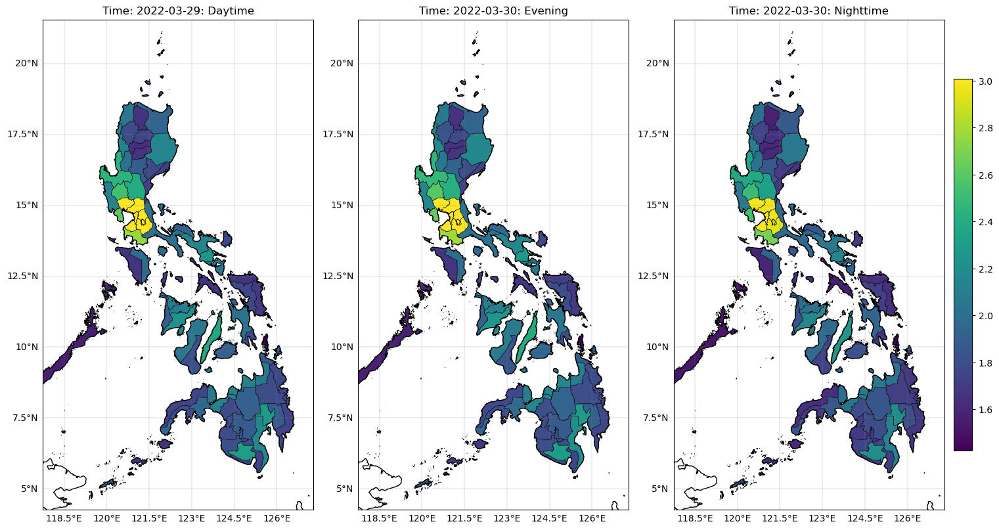

<Figure size 640x480 with 0 Axes>

In [288]:
#plot_cuboidPoint_space(ds_forecast.isel(date_time=slice(0,7)),ds, markersize=1, extent=0.2, time_type="hourly",variable="n_users",percentile=99)
plot_cuboidPolygons_space(ds_forecast.isel(date_time=slice(0,3)),"n_users","hourly",gamma=0.5,percentile=95,cmap="viridis")


A
loop
loop
loop
B


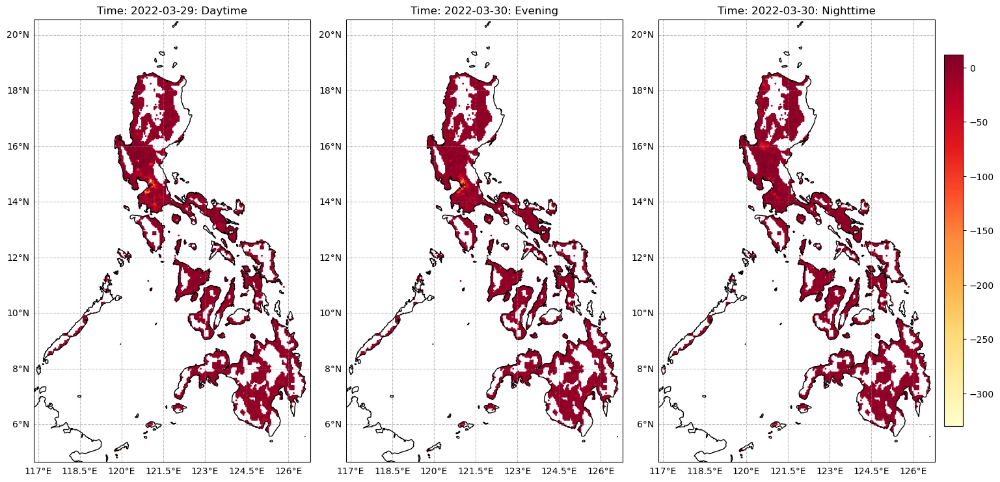

In [253]:
ds_res = (exp10(ds_filtered.isel(date_time=slice(-3, None)))-exp10(ds_forecast))
plot_cuboidPoint_space(ds_res,ds_res, markersize=1, extent=0.2, time_type="hourly",variable="n_users",percentile=95)

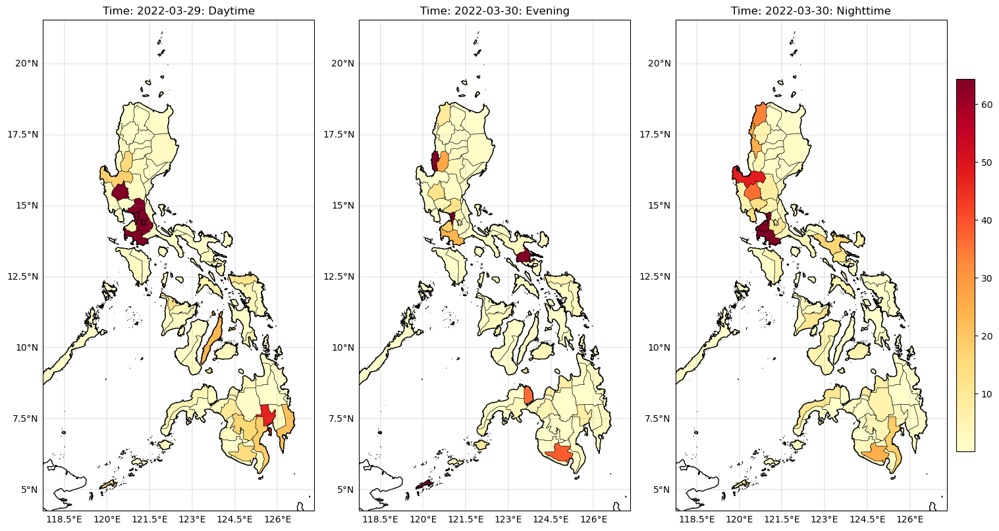

<Figure size 640x480 with 0 Axes>

In [285]:
ds_res = (exp10(ds_poly.isel(date_time=slice(-6, -3)))-exp10(ds_forecast.isel(date_time=slice(0,3))))**2
plot_cuboidPolygons_space(ds_res,"n_users","hourly",gamma=0.5,percentile=95)

In [279]:
(exp10(ds_poly.isel(date_time=slice(-3, None)))-exp10(ds_forecast.isel(date_time=slice(0, 3))))**2

<xarray.Dataset> Size: 1kB
Dimensions:    (date_time: 0, ADM_NAME: 81)
Coordinates:
  * date_time  (date_time) datetime64[ns] 0B 
  * ADM_NAME   (ADM_NAME) object 648B 'Abra' ... 'Zamboanga del Sur'
    geometry   (ADM_NAME) object 648B POLYGON ((120.74772644100017 17.1575508...
Data variables:
    n_users    (ADM_NAME, date_time) float64 0B

In [356]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import VAR
nan_adm = ds_poly['n_users'].isnull().any(dim='date_time')


df = ds_poly.sel(ADM_NAME=~nan_adm).to_dataframe().reset_index()
df.set_index('date_time', inplace=True)
df

detrended = {}
for adm in  ds_poly.sel(ADM_NAME=~nan_adm)["ADM_NAME"].values:
    series = df[df['ADM_NAME'] == adm]['n_users']

    result = seasonal_decompose(series, model='additive', period=3, extrapolate_trend='freq')
    detrended[adm] = series - result.trend - result.seasonal


detrended_df = pd.DataFrame(detrended)
detrended_df.dropna(inplace=True)
detrended_df

,Abra,Agusan del Norte,Agusan del Sur,Aklan,Albay,Antique,Apayao,Aurora,Basilan,Bataan,...,Sultan Kudarat,Sulu,Surigao del Norte,Surigao del Sur,Tarlac,Tawi-Tawi,Zambales,Zamboanga Sibugay,Zamboanga del Norte,Zamboanga del Sur
date_time,,,,,,,,,,,,,,,,,,,,,
2021-12-31 16:00:00,-0.001139,-0.003783,0.002557,0.011142,-0.002468,0.000661,0.002219,0.006926,-0.001168,0.004299,...,0.002294,-0.006508,-0.000961,0.001211,0.005458,0.085203,-0.002094,-0.004253,-0.000696,0.004527
2022-01-01 00:00:00,0.040624,0.044939,0.058466,0.056684,0.075860,0.064632,0.056339,0.035613,0.058751,0.069647,...,0.042649,0.038021,0.081583,0.069747,0.060495,-0.010674,0.057463,0.074284,0.064492,0.073006
2022-01-01 08:00:00,-0.037174,-0.037725,-0.058310,-0.064304,-0.074954,-0.064838,-0.056580,-0.038744,-0.052969,-0.076777,...,-0.043711,-0.032931,-0.075795,-0.070198,-0.064977,-0.050697,-0.055515,-0.064744,-0.061959,-0.073695
2022-01-01 16:00:00,-0.006916,-0.012361,-0.004227,0.002337,0.001438,-0.000476,-0.002726,-0.002561,-0.012703,0.011378,...,-0.000786,-0.002962,-0.013027,-0.000688,0.003017,0.025622,-0.001728,-0.017472,-0.005289,-0.005068
2022-01-02 00:00:00,0.040869,0.039977,0.053678,0.053724,0.062462,0.058312,0.056950,0.036826,0.054398,0.059581,...,0.031123,0.047597,0.082900,0.066169,0.059546,0.059402,0.054616,0.077997,0.063145,0.071879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-30 00:00:00,0.003245,0.006084,-0.000113,0.006907,0.009409,0.002064,-0.007054,-0.010271,-0.006951,0.001151,...,-0.004164,0.006327,0.002799,0.010677,0.004096,0.053223,0.007979,0.006177,0.007475,-0.000890
2022-03-30 08:00:00,-0.008392,-0.020639,-0.024621,-0.039028,-0.033554,-0.025123,-0.019856,0.000105,-0.015023,-0.029206,...,-0.012228,-0.019690,-0.025276,-0.037690,-0.027216,-0.043073,-0.039101,-0.037356,-0.030229,-0.031411
2022-03-30 16:00:00,-0.000284,0.012952,0.026768,0.037227,0.033617,0.022898,0.024223,0.007868,0.004703,0.027451,...,0.012926,0.009003,0.024501,0.028208,0.023101,-0.000589,0.034252,0.029317,0.027423,0.030452


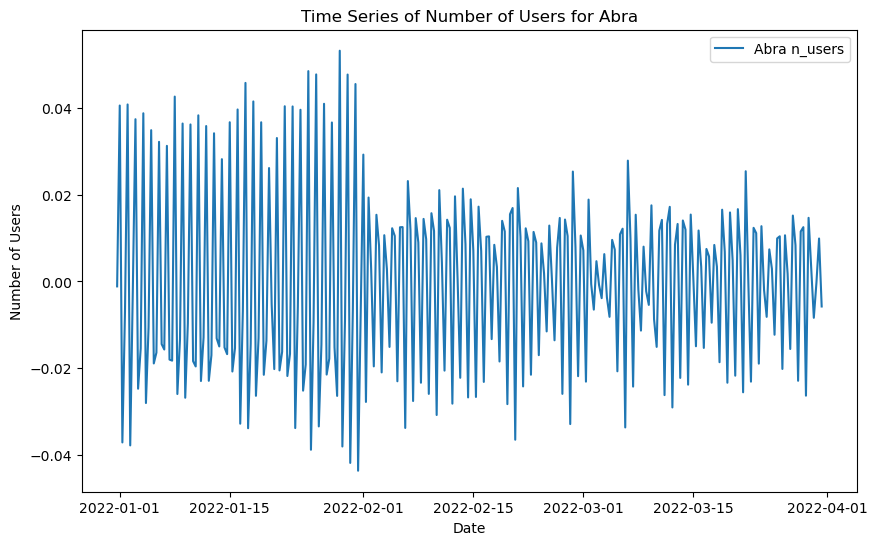

In [357]:
plt.figure(figsize=(10, 6))
plt.plot(detrended_df.index, detrended_df['Abra'], label='Abra n_users')
plt.xlabel('Date')
plt.ylabel('Number of Users')
plt.title('Time Series of Number of Users for Abra')
plt.legend()
plt.show()

VAR

In [465]:
import numpy as np
import pandas as pd
from statsmodels.tsa.api import VAR
import libpysal
from pysal.model.spreg import GM_Error
# Parameters for synthetic data
num_time_steps = 100
num_locations = 10

# Generate AR(1) synthetic data with slightly different processes for each location
np.random.seed(42)
phis = np.random.uniform(0.5, 0.9, num_locations)  # AR(1) coefficients for each location
sigma = 0.1  # standard deviation of noise
time_series_data = np.zeros((num_time_steps, num_locations))

for loc in range(num_locations):
    time_series_data[0, loc] = np.random.rand()  # initial value
    for t in range(1, num_time_steps):
        time_series_data[t, loc] = phis[loc] * time_series_data[t-1, loc] + np.random.normal(0, sigma)

# Convert to DataFrame
dates = pd.date_range(start='2000-01-01', periods=num_time_steps, freq='M')
data = pd.DataFrame(time_series_data, index=dates, columns=[f'loc_{i}' for i in range(num_locations)])

print("Synthetic Data Head:")
print(data.head())

# Fit the VAR model using the synthetic data
var_model = VAR(data)
var_results = var_model.fit(maxlags=1, ic='bic')

# Print VAR model summary
print(var_results.summary())

# Get the residuals
residuals = var_results.resid

print("Residuals Shape:", residuals.shape)  # Shape: (num_time_steps, num_locations)
# Get residuals for the last temporal step
last_step_residuals = residuals.values[-1]
print("Residuals for the Last Temporal Step:")
print(last_step_residuals)

Synthetic Data Head:
               loc_0     loc_1     loc_2     loc_3     loc_4     loc_5  \
2000-01-31  0.020584  0.300878  0.798295  0.010838  0.520308  0.285095   
2000-02-29 -0.044712  0.097508  0.765975  0.093412  0.304111  0.118992   
2000-03-31 -0.081571  0.091858  0.706083  0.101491  0.326161  0.071773   
2000-04-30 -0.110144  0.327186  0.583011  0.062035  0.200432 -0.042730   
2000-05-31 -0.163982  0.268781  0.479827  0.055572  0.228049  0.003014   

               loc_6     loc_7     loc_8     loc_9  
2000-01-31  0.251799  0.409412  0.076953  0.287038  
2000-02-29  0.025911  0.205252 -0.047269  0.225158  
2000-03-31 -0.037734 -0.034453  0.092793  0.195460  
2000-04-30 -0.002684  0.140482  0.042605  0.157734  
2000-05-31  0.082152  0.140016  0.045045 -0.012444  
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Thu, 08, Aug, 2024
Time:                     20:17:12
-----------------------------------------

In [472]:
# Create spatial weights matrix
num_time_steps = 100
num_locations = 10

w = libpysal.weights.lat2W(1, num_locations)
w.transform = 'r'

print("Residuals for the Last Temporal Step:")
print(last_step_residuals)
print("Spatial Weights Matrix W:")
print(w.full()[0])

X = np.ones((num_locations,1))

# Reshape residuals to be a column vector
y = last_step_residuals.reshape(-1, 1)
assert y.shape[0] == w.n, "Mismatch in dimensions between y and W"
# Fit the SEM
sem_model = GM_Error(y, x=X, w=w)
lambda_ = sem_model.betas[-1][0]
print("Estimated lambda:", lambda_)
print(sem_model.summary)

Residuals for the Last Temporal Step:
[ 0.02371423  0.31825536  0.00094541 -0.11834766 -0.01744632  0.22376811
  0.03601533 -0.03297448 -0.02256226  0.10273088]
Spatial Weights Matrix W:
[[0.  1.  0.  0.  0.  0.  0.  0.  0.  0. ]
 [0.5 0.  0.5 0.  0.  0.  0.  0.  0.  0. ]
 [0.  0.5 0.  0.5 0.  0.  0.  0.  0.  0. ]
 [0.  0.  0.5 0.  0.5 0.  0.  0.  0.  0. ]
 [0.  0.  0.  0.5 0.  0.5 0.  0.  0.  0. ]
 [0.  0.  0.  0.  0.5 0.  0.5 0.  0.  0. ]
 [0.  0.  0.  0.  0.  0.5 0.  0.5 0.  0. ]
 [0.  0.  0.  0.  0.  0.  0.5 0.  0.5 0. ]
 [0.  0.  0.  0.  0.  0.  0.  0.5 0.  0.5]
 [0.  0.  0.  0.  0.  0.  0.  0.  1.  0. ]]
Estimated lambda: -0.11676063855306694
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: GM SPATIALLY WEIGHTED LEAST SQUARES
------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :     dep_var                Number of Observations:          10
Mean dependent var  :      0.0514        

In [476]:
forecast_steps = 1
last_values = data.values[-1].reshape(1, -1)
var_forecast = var_results.forecast(y=last_values, steps=forecast_steps)
print("VAR Forecast for the next time step:")
print(var_forecast)

predicted_residuals = var_forecast - last_values
print("Predicted Residuals for the next time step:")
print(predicted_residuals)

predicted_residuals = predicted_residuals.reshape(-1, 1)
adjusted_residuals = lambda_ * np.dot(w.full()[0], predicted_residuals)
print(adjusted_residuals)

final_prediction = var_forecast + adjusted_residuals.T
print("Final Prediction:")
print(final_prediction)

VAR Forecast for the next time step:
[[-0.07281664  0.41677127  0.03272123  0.10060344 -0.09514546  0.17129899
   0.03725038 -0.05487009  0.0123034   0.19265633]]
Predicted Residuals for the next time step:
[[-0.06711766 -0.03447305 -0.03740647  0.15926243  0.00037298 -0.09234737
   0.03622937  0.01239519 -0.01534504 -0.04285766]]
[[ 0.0040251 ]
 [ 0.00610215]
 [-0.00728524]
 [ 0.00216203]
 [-0.00390652]
 [-0.00213686]
 [ 0.00466763]
 [-0.00121923]
 [ 0.00177841]
 [ 0.0017917 ]]
Final Prediction:
[[-0.06879154  0.42287342  0.02543598  0.10276547 -0.09905198  0.16916213
   0.04191802 -0.05608932  0.01408181  0.19444803]]


In [460]:
var_results.coefs

array([], shape=(0, 10, 10), dtype=float64)

Temporal multivariate

Third Part : Spatial stuff


In [272]:
import rasterio
import geopandas as gpd
from rasterio.features import geometry_mask
import numpy as np
from scipy.ndimage import map_coordinates

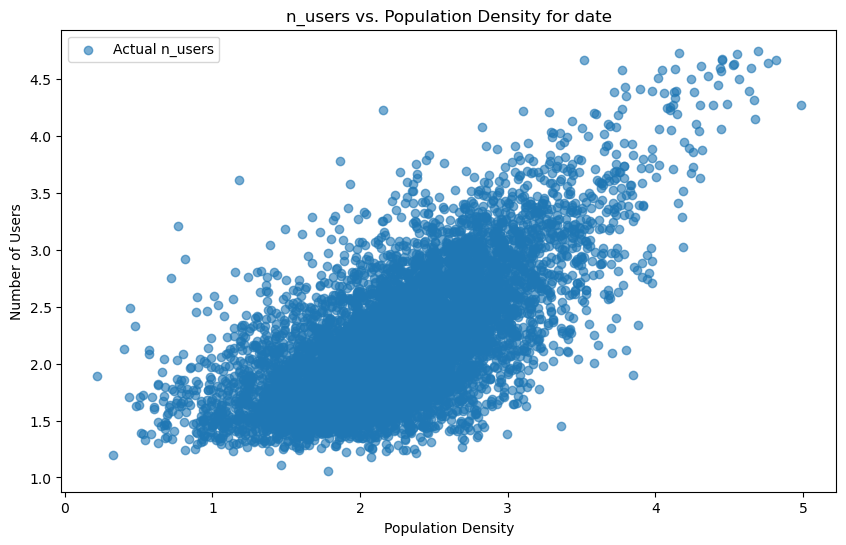

,n_users,geometry,pop_density
0,1.615987,POINT (117.04834 7.99396),1.999093
1,1.331759,POINT (117.35596 8.51583),1.855815
2,1.602716,POINT (117.39990 8.55929),2.278020
3,1.711846,POINT (117.39990 8.51583),1.575826
4,2.415846,POINT (117.44385 8.51583),2.830973
...,...,...,...
7649,1.537793,POINT (125.57373 6.33714),2.065474
7650,1.917093,POINT (125.57373 6.38081),2.199263
7651,1.568664,POINT (125.61768 6.29346),1.543113
7652,1.880606,POINT (125.61768 6.33714),1.850972


In [273]:
def xarray_to_geodataframe(xr_dataset):

    # Extract latitude and longitude coordinates
    points = xr_dataset.geometry.values
    n_users = xr_dataset["n_users"].values
    
    # Create the GeoDataFrame
    gdf = gpd.GeoDataFrame({'n_users': n_users, 'geometry': points})
    
    return gdf


ds_filtered = ds.sel(geometry=~ds['n_users'].isnull().any(dim='date_time')).isel(date_time=0)
def raster_values_at_points(raster_path, points_gdf: gpd.GeoDataFrame, column_name: str) -> gpd.GeoDataFrame:

    new_gdf = points_gdf.copy()  # do not change original gdf
    coords = points_gdf.get_coordinates().values

    with rasterio.open(raster_path) as src:
        new_gdf[column_name] = [x[0] for x in src.sample(coords)]

    return new_gdf


raster_path = r'c:\Thesis\Data\phl_pd_2020_1km.tif'
points_gdf = xarray_to_geodataframe(ds_filtered)
raster_values_gdf = raster_values_at_points(raster_path, points_gdf, column_name="pop_density")

raster_values_gdf = raster_values_gdf[raster_values_gdf["pop_density"] > 0]
    
# Increment all remaining raster values by 1
raster_values_gdf["pop_density"] = np.log10(raster_values_gdf["pop_density"] + 1)
raster_values_gdf

plt.figure(figsize=(10, 6))
plt.scatter(raster_values_gdf['pop_density'], raster_values_gdf['n_users'], label='Actual n_users', alpha=0.6)
plt.xlabel('Population Density')
plt.ylabel('Number of Users')
plt.title(f'n_users vs. Population Density for date')
plt.legend()
plt.show()
raster_values_gdf


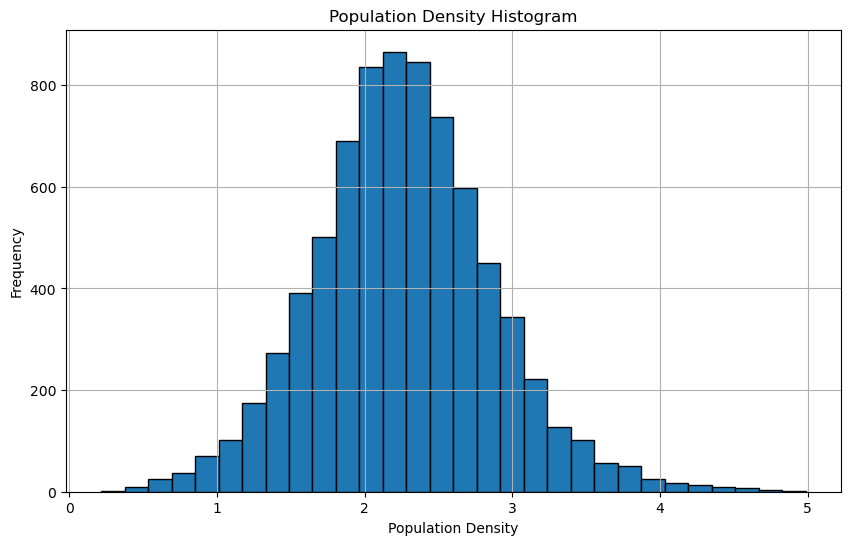

In [274]:
plt.figure(figsize=(10, 6))
plt.hist(raster_values_gdf["pop_density"], bins=30, edgecolor='black')
plt.title('Population Density Histogram')
plt.xlabel('Population Density')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_18956\1310430358.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercepts.append(model.params[0])
C:\Users\Admin\AppData\Local\Temp\ipykernel_18956\1310430358.py:33: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  coef1.append(model.params[1])
C:\Users\Admin\AppData\Local\Temp\ipykernel_18956\1310430358.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercepts.append(model.param

(269, 7589)
A
loop
B


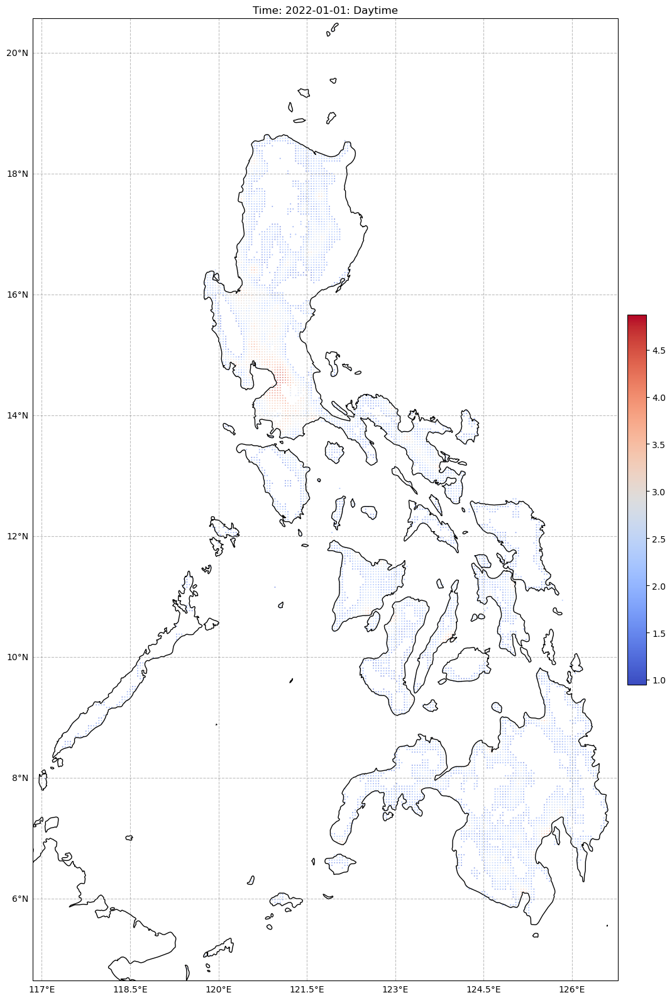

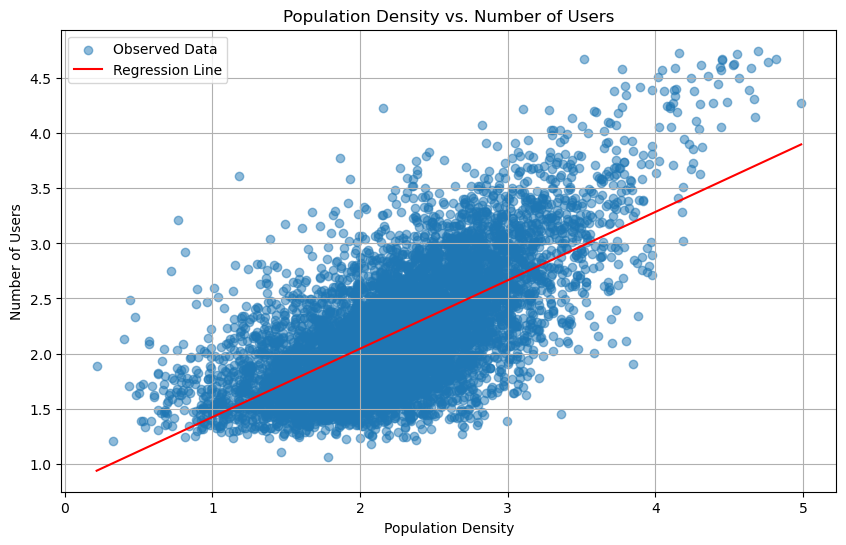

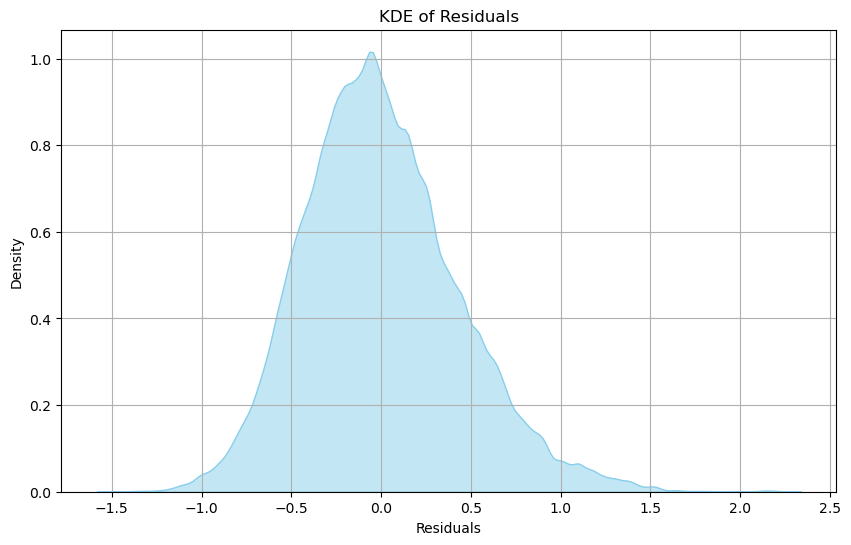

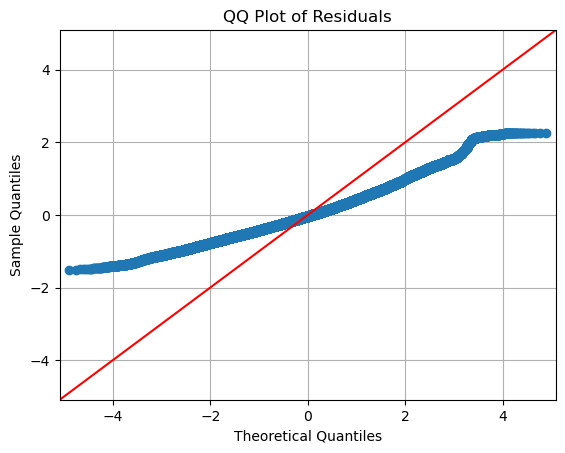

In [275]:
import seaborn as sns

n_users = []
intercepts = []
coef1 = []

gdf_geometries_set = set(raster_values_gdf['geometry'])
ds_test = ds.sel(geometry=[geom for geom in ds.geometry.values if geom in gdf_geometries_set])

ds_test = ds_test.assign(pop_density=xr.DataArray(np.array(raster_values_gdf["pop_density"]), dims=['geometry']))
# Perform the regression for each date_time
for date in ds_test.date_time.values:
    df = ds_test.sel(date_time=date).to_dataframe().reset_index()
    X = df[['pop_density']]
    X = sm.add_constant(X)  # Adds a constant term to the predictor
    y = df['n_users']
    
    # Perform the regression
    model = sm.GLS(y, X).fit()
    #print(f"Model summary for date {date}:")
    #print(model.summary())
    # Predict the regressed n_users values
    df['n_users_regressed'] = model.predict(X)
    
    # Calculate the residuals
    df['residuals'] = df['n_users'] - df['n_users_regressed']
    
    # Store the residuals
    n_users.append(df['residuals'].values)

        # Store the intercept and coefficient
    intercepts.append(model.params[0])
    coef1.append(model.params[1])

# Convert lists to numpy arrays
intercepts = np.array(intercepts)
coef1 = np.array(coef1)

# Calculate mean parameters
mean_intercept = np.mean(intercepts)
mean_coef1 = np.mean(coef1)

print(np.array(n_users).shape)
dataset = xr.Dataset(
    {"n_users": (("date_time","geometry"), np.array(n_users))},
    coords={
            "geometry": ds_test.coords["geometry"],
            "date_time": ds_test.coords["date_time"]
        }
    )


pop_density = ds_test['pop_density']
a = dataset + mean_intercept + mean_coef1*pop_density

plot_cuboidPoint_space(a.isel(date_time = [3]),a, markersize=0.1, extent=0.2, time_type="hourly",variable="n_users",percentile=100)

# Select the first date_time for plotting
df_plot = ds_test.isel(date_time=0).to_dataframe().reset_index()

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df_plot['pop_density'], df_plot['n_users'], alpha=0.5, label='Observed Data')

# Regression line
x_vals = np.linspace(df_plot['pop_density'].min(), df_plot['pop_density'].max(), 100)
y_vals = intercepts[0] + coef1[0] * x_vals
plt.plot(x_vals, y_vals, color='red', label='Regression Line')

plt.title('Population Density vs. Number of Users')
plt.xlabel('Population Density')
plt.ylabel('Number of Users')
plt.legend()
plt.grid(True)
plt.show()

residuals = np.concatenate(n_users)
plt.figure(figsize=(10, 6))
sns.kdeplot(residuals, fill=True, color="skyblue", alpha=0.5)
plt.title('KDE of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.grid(True)
plt.show()


sm.qqplot(residuals, line='45')
plt.title('QQ Plot of Residuals')
plt.grid(True)
plt.show()

A
loop
B


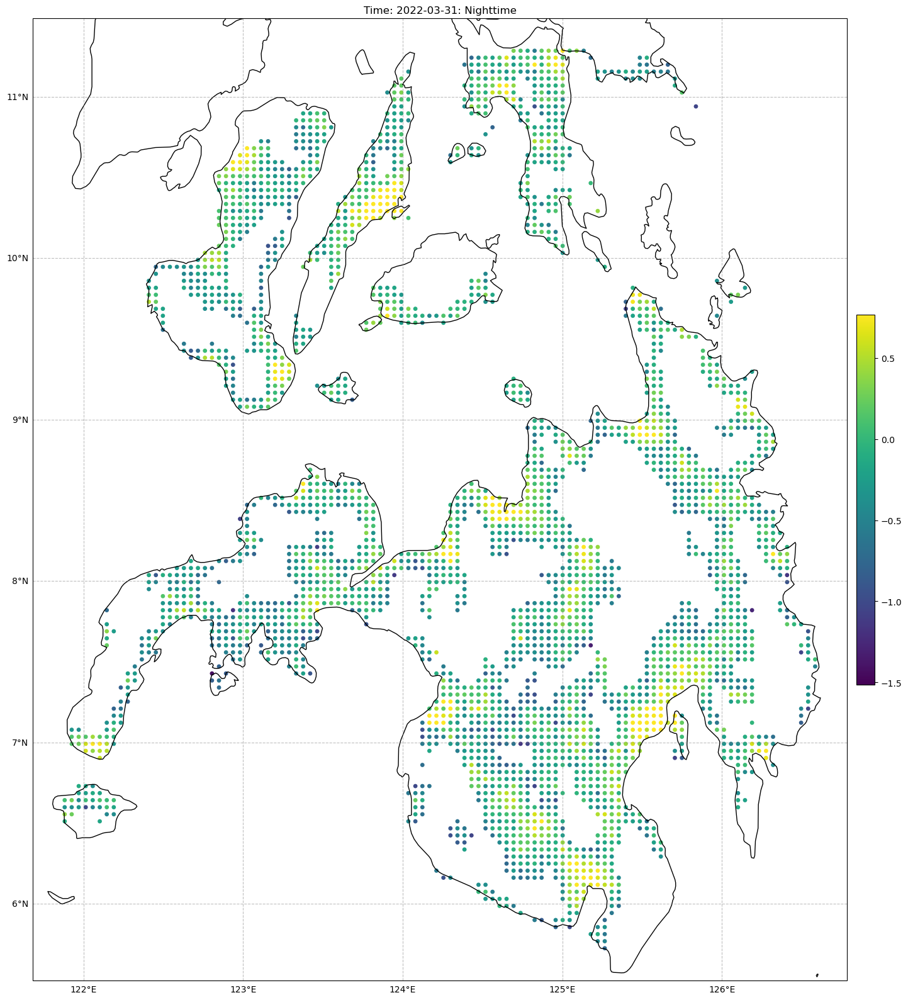

In [342]:
center_coordinates = (125,7.8)  
radius = 3.5
ds_filtered = dataset.sel(geometry=~dataset['n_users'].isnull().any(dim='date_time'))
ds_masked_circle = mask_cuboidPoints_circle(ds_filtered, center_coordinates, radius)

ds_masked_circle
plot_cuboidPoint_space(ds_masked_circle.isel(date_time = [268]),dataset, markersize=15, extent=0.2, time_type="hourly",variable="n_users")

c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\skgstat\plotting\variogram_plot.py:123: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\skgstat\plotting\variogram_dd_plot.py:46: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


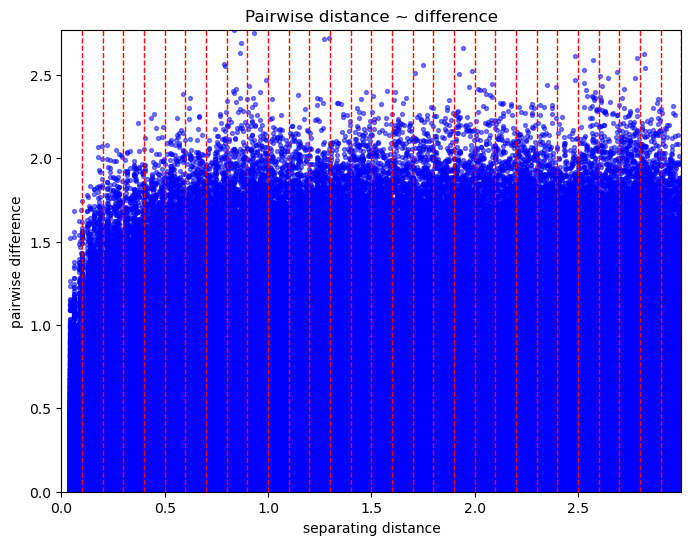

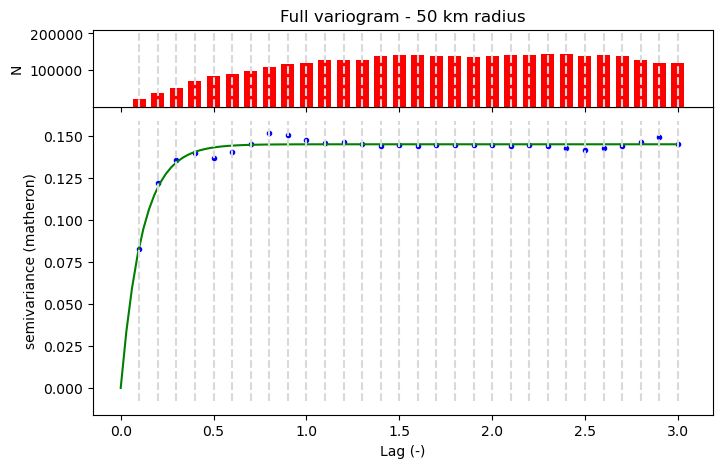

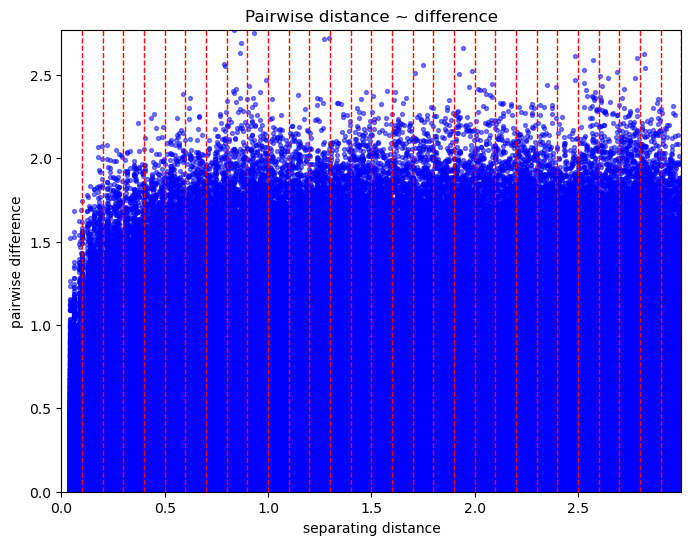

In [309]:
import skgstat as skg

coords = np.array([[p.x, p.y] for p in ds_masked_circle.coords['geometry'].values])
values = ds_masked_circle.isel(date_time=0)['n_users'].values

V = skg.Variogram(coords, values,n_lags=30,use_nugget=True,maxlag=3)
V.model = 'exponential'
V.plot()
plt.title('Full variogram - 50 km radius')
V.distance_difference_plot()

Let's try to : - get variogram model for each daytime and plot them each

In [310]:
from skgstat.models import spherical
from skgstat import OrdinaryKriging
from scipy.spatial.distance import pdist, squareform

ok = OrdinaryKriging(V, min_points=1, max_points=50, mode='exact')

In [311]:
lon = np.array([p.x for p in ds_masked_circle.coords['geometry'].values])
lat = np.array([p.y for p in ds_masked_circle.coords['geometry'].values])

lat_min, lat_max = lat.min(), lat.max()
lon_min, lon_max = lon.min(), lon.max()

num_points = 100000  # Total number of points you want to generate
lat_new = np.linspace(lat_min, lat_max, int(np.sqrt(num_points)))
lon_new = np.linspace(lon_min, lon_max, int(np.sqrt(num_points)))
lon_grid, lat_grid = np.meshgrid(lon_new, lat_new)


# Flatten the grid to get arrays of latitudes and longitudes
lat_grid_flat = lat_grid.flatten()
lon_grid_flat = lon_grid.flatten()

predicted_values = ok.transform(lon_grid_flat, lat_grid_flat).reshape(lat_grid.shape)


In [335]:
squared_sigma = (ok.sigma ** 2).reshape(lat_grid.shape)

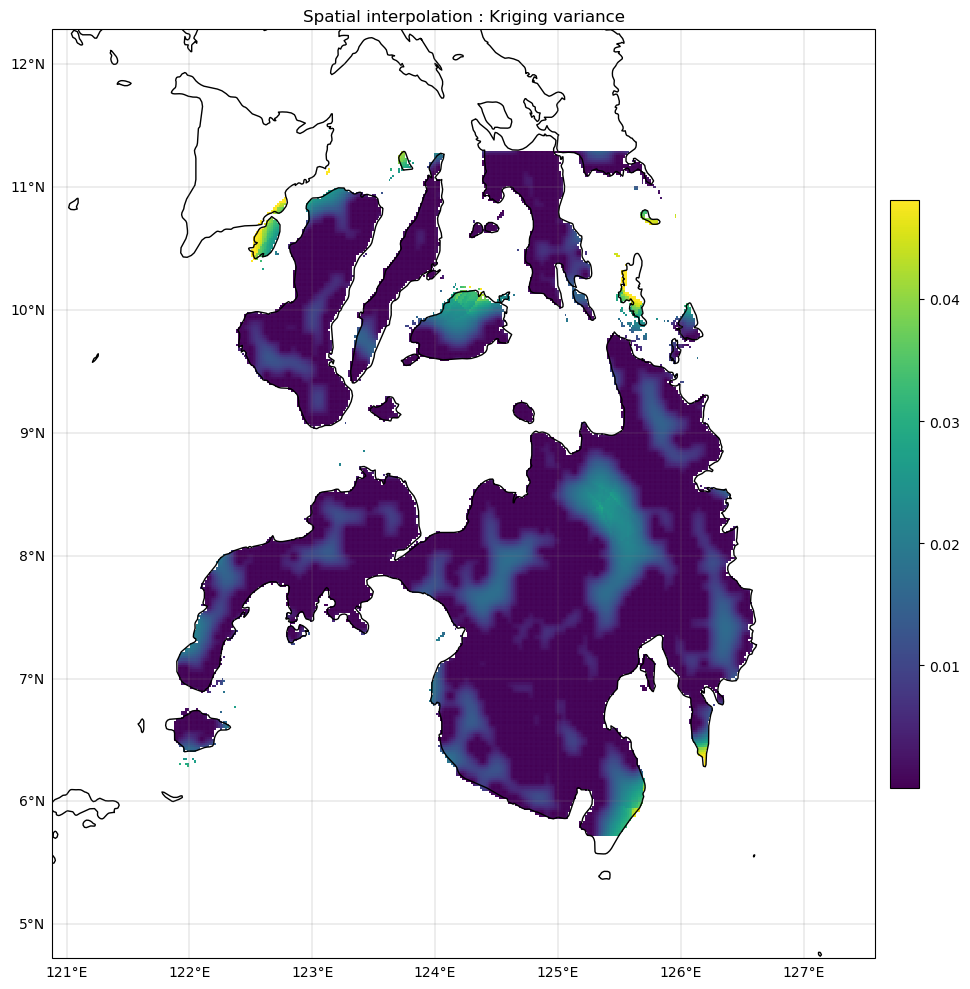

<Figure size 640x480 with 0 Axes>

In [337]:
ds_j = xr.Dataset(
    {
        "n_users": (["lat", "lon"], predicted_values),
        "var" : (["lat", "lon"], squared_sigma)
    },
    coords={
        "lon": lon_new,
        "lat": lat_new
    }
)
plot_cuboidRaster_space_NT(ds_j, 'var',shapefile= shapefile,min=np.nanpercentile(ds_j['var'].values, 0), max=np.nanpercentile(ds_j['var'].values, 95),title="Spatial interpolation : Kriging variance")

C:\Users\Admin\AppData\Local\Temp\ipykernel_18956\3296561787.py:6: RuntimeWarning: invalid value encountered in log10
  new_n_users = mean_intercept + np.log10(raster_gdf['pop_density'].values.reshape(ds_e['n_users'].shape) + 1) * mean_coef1


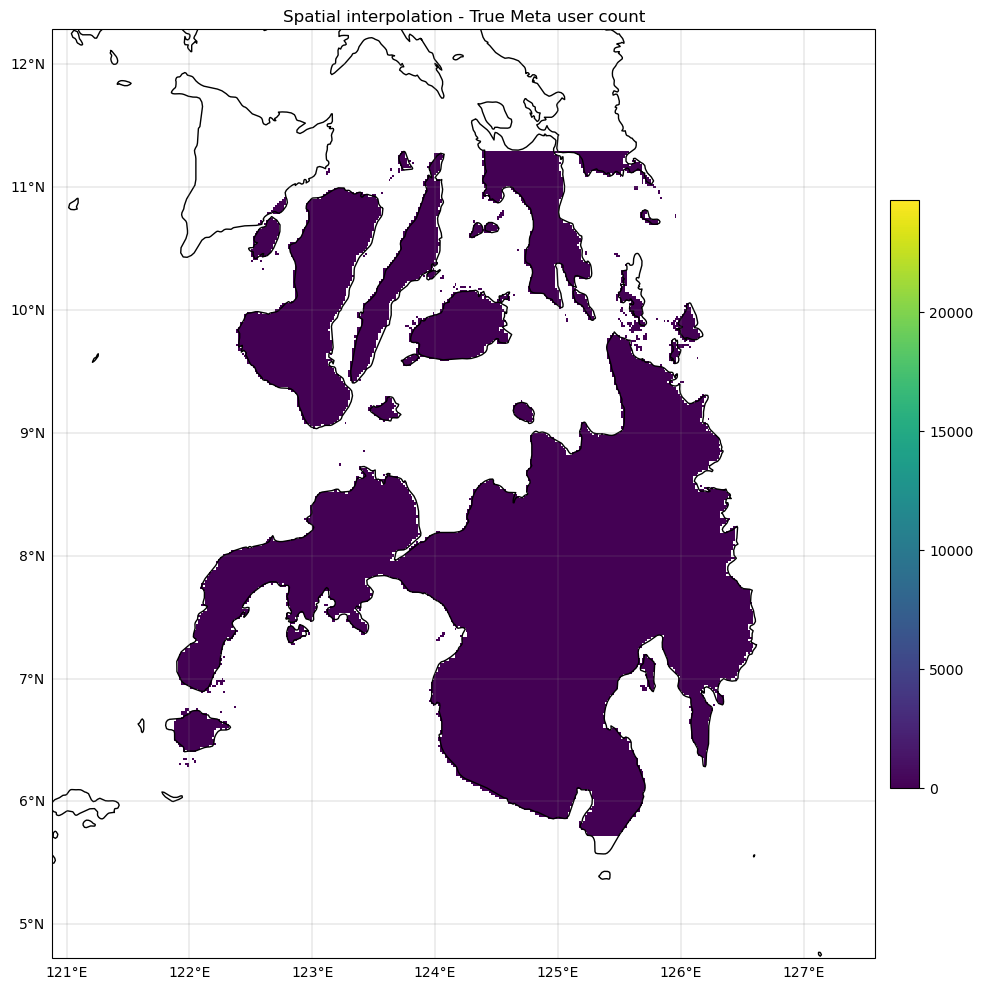

<Figure size 640x480 with 0 Axes>

In [320]:
points = [sp.Point(lon, lat) for lat in lat_new for lon in lon_new]
gdf = gpd.GeoDataFrame(geometry=points)
raster_gdf = raster_values_at_points(raster_path, gdf, column_name="pop_density")
raster_gdf

new_n_users = mean_intercept + np.log10(raster_gdf['pop_density'].values.reshape(ds_e['n_users'].shape) + 1) * mean_coef1
new_n_users = new_n_users + ds_e["n_users"].values
new_n_users = new_n_users**10

ds_e['n_users'] = (["lat", "lon"], new_n_users)


plot_cuboidRaster_space_NT(ds_e, 'var',shapefile= shapefile,min=np.nanpercentile(ds_e['n_users'].values, 0), max=np.nanpercentile(ds_e['n_users'].values, 95),title="Spatial interpolation - True Meta user count")

In [319]:
ds_e

<xarray.Dataset> Size: 2MB
Dimensions:  (lat: 316, lon: 316)
Coordinates:
  * lon      (lon) float64 3kB 121.9 121.9 121.9 121.9 ... 126.6 126.6 126.6
  * lat      (lat) float64 3kB 5.725 5.743 5.761 5.778 ... 11.25 11.27 11.29
Data variables:
    n_users  (lat, lon) float64 799kB nan nan nan nan nan ... nan nan nan nan
    var      (lat, lon) float64 799kB nan nan nan nan nan ... nan nan nan nan

In [286]:
lat_new = ds_e.coords['lat'].values
lon_new = ds_e.coords['lon'].values
points = [sp.Point(lon, lat) for lat in lat_new for lon in lon_new]
gdf = gpd.GeoDataFrame(geometry=points)

raster_values_at_points(shapefile, gdf, column_name="pop_density")

TypeError: invalid path or file:                  NAME_1                                           geometry
0                  Abra  POLYGON ((120.74773 17.15755, 120.73747 17.156...
1      Agusan del Norte  POLYGON ((125.51141 8.70021, 125.49689 8.70089...
2        Agusan del Sur  POLYGON ((126.05209 7.93625, 126.04572 7.93504...
3                 Aklan  MULTIPOLYGON (((122.28702 11.74581, 122.28805 ...
4                 Albay  MULTIPOLYGON (((123.44640 13.02776, 123.44541 ...
..                  ...                                                ...
76            Tawi-Tawi  MULTIPOLYGON (((119.93195 4.89917, 119.93195 4...
77             Zambales  MULTIPOLYGON (((120.29529 14.80142, 120.29581 ...
78  Zamboanga del Norte  MULTIPOLYGON (((121.90389 7.15028, 121.90417 7...
79    Zamboanga del Sur  MULTIPOLYGON (((122.06706 6.86892, 122.06729 6...
80    Zamboanga Sibugay  MULTIPOLYGON (((122.85913 7.27263, 122.85863 7...

[81 rows x 2 columns]

In [287]:
ds_e['n_users'] = ds_e['n_users']**10

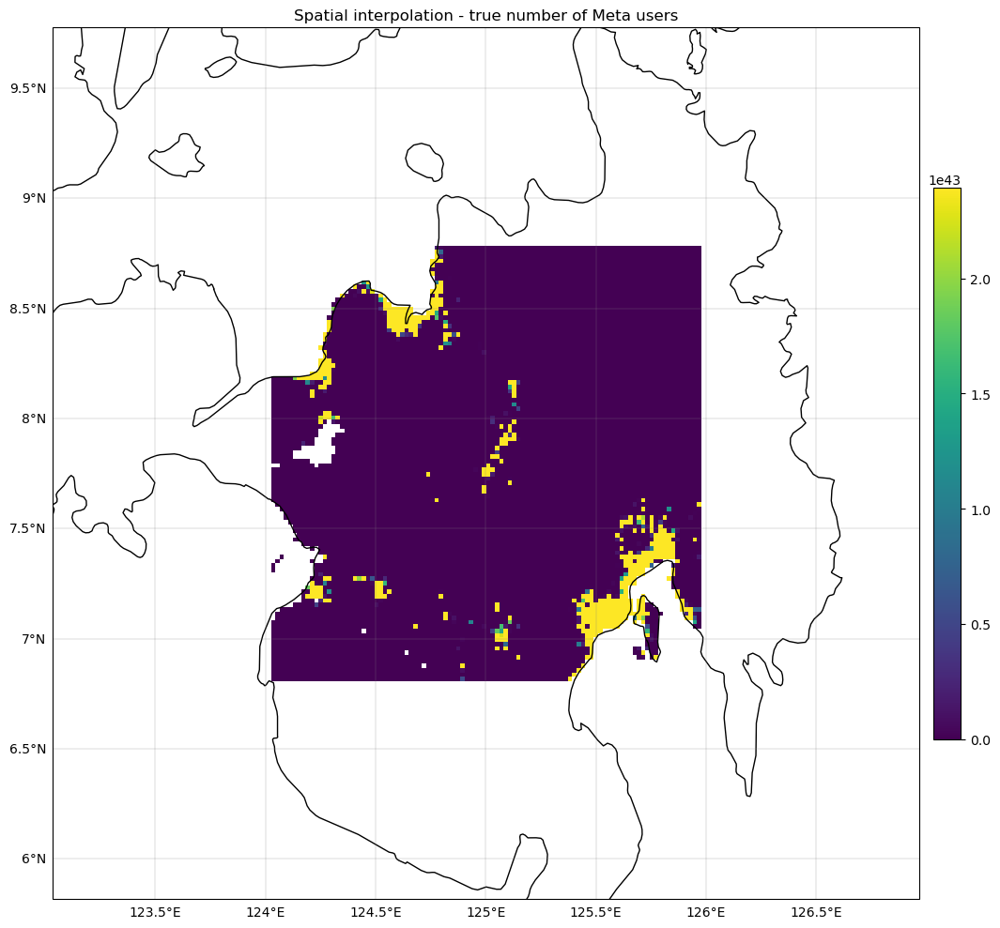

<Figure size 640x480 with 0 Axes>

In [291]:
plot_cuboidRaster_space_NT(ds_e, 'n_users',shapefile= shapefile, min=np.nanpercentile(ds_e['n_users'].values, 0), max=np.nanpercentile(ds_e['n_users'].values, 95),title="Spatial interpolation - true number of Meta users")

Generate gaussian processes

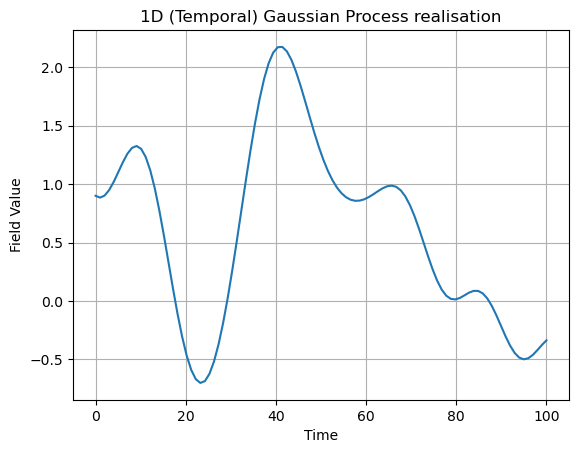

<Figure size 640x480 with 0 Axes>

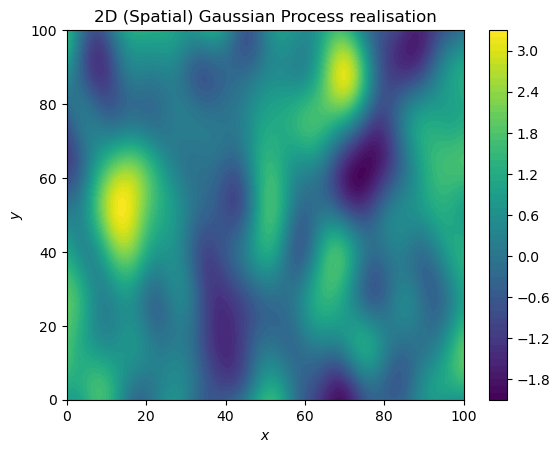

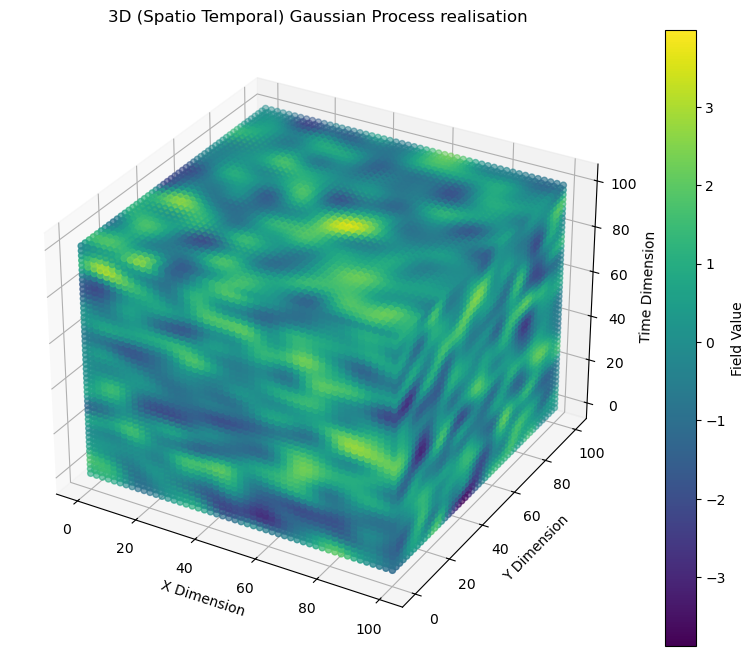

In [92]:
time = np.linspace(0, 100, 100)
model_1d = gs.Gaussian(dim=1, var=1, len_scale=10)
srf_1d = gs.SRF(model_1d, seed=123)
field_1d = srf_1d(time)

plt.figure()
plt.plot(time, field_1d)
plt.title("1D (Temporal) Gaussian Process realisation")
plt.xlabel("Time")
plt.ylabel("Field Value")
plt.grid(True)
plt.show()

# 2D spatial Gaussian process
x = y = np.linspace(0, 100, 100)
model_2d = gs.Gaussian(dim=2, var=1, len_scale=8, anis=2, angles=0)
srf_2d = gs.SRF(model_2d, seed=123)
field_2d = srf_2d.structured([x, y])

plt.figure()
srf_2d.plot()
plt.title("2D (Spatial) Gaussian Process realisation")
plt.show()

# 3D space-time Gaussian process
x = y = np.linspace(0, 100, 50)
t = np.linspace(0, 100, 50)
X, Y, T = np.meshgrid(x, y, t, indexing='ij')

model_3d = gs.Gaussian(dim=3, var=1, len_scale=[10, 8, 5], anis=[1, 2, 1], angles=[0, 0, 35])
srf_3d = gs.SRF(model_3d, seed=123)
field_3d = srf_3d.structured([x, y, t])

# Plotting the 3D field
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Flatten the arrays for scatter plot
X_flat = X.flatten()
Y_flat = Y.flatten()
T_flat = T.flatten()
field_flat = field_3d.flatten()

# Scatter plot
sc = ax.scatter(X_flat, Y_flat, T_flat, c=field_flat, cmap='viridis')

ax.set_xlabel('X Dimension')
ax.set_ylabel('Y Dimension')
ax.set_zlabel('Time Dimension')
plt.title("3D (Spatio Temporal) Gaussian Process realisation")

# Add color bar
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Field Value')


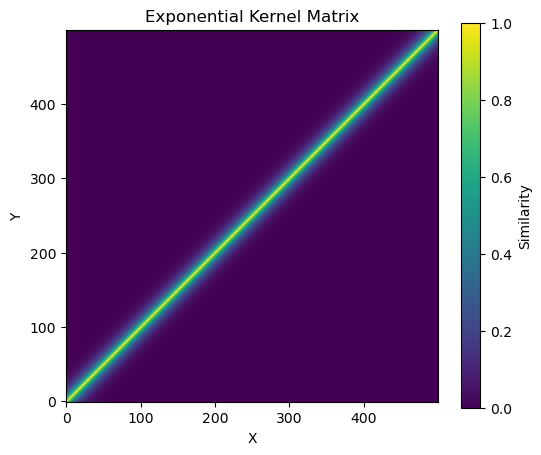

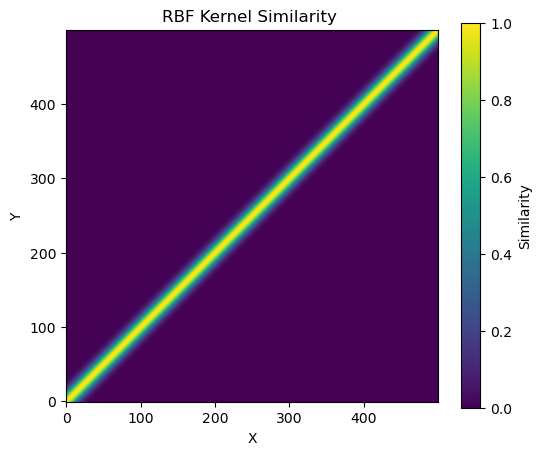

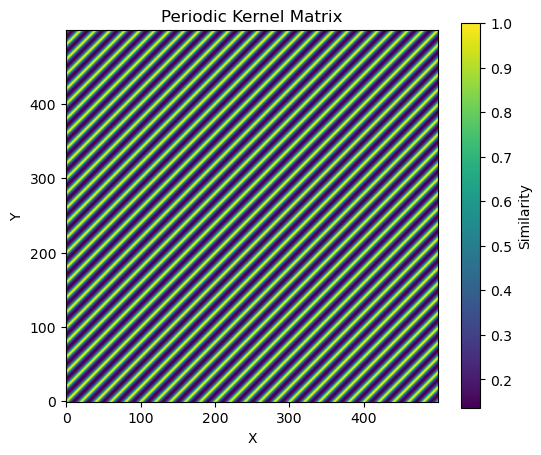

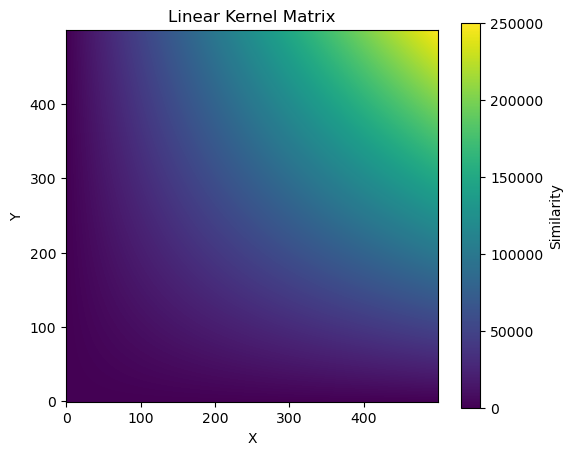

In [103]:
# Function to compute similarity matrix for the Exponential kernel
def exponential_kernel(h, sigma=1.0, ell=10.0):
    return sigma ** 2 * np.exp(-np.abs(h) / ell)

# Function to compute similarity matrix for the RBF kernel
def rbf_kernel(h, sigma=1.0, ell=10.0):
    return sigma ** 2 * np.exp(-h**2 / (2 * ell**2))

# Function to compute similarity matrix for the Periodic kernel
def periodic_kernel(tau, sigma=1.0, ell=1.0, T=20):
    return sigma ** 2 * np.exp(-2 * np.sin(np.pi * np.abs(tau) / T) ** 2 / ell**2)

# Function to compute similarity matrix for the Linear kernel
def linear_kernel(t1, t2, sigma=1.0):
    return sigma ** 2 * np.outer(t1, t2)

# Generate a range of values
x = np.linspace(0, 500, 500)
h = x[:, None] - x[None, :]

# Create similarity matrices for each kernel
exponential_matrix = exponential_kernel(h)
rbf_matrix = rbf_kernel(h)
periodic_matrix = periodic_kernel(h)
linear_matrix = linear_kernel(x, x)

# Plotting function
def plot_similarity_matrix(matrix, title):
    plt.figure(figsize=(6, 5))
    plt.imshow(matrix, origin='lower', cmap='viridis')
    plt.colorbar(label='Similarity')
    plt.title(title)
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.show()

# Plot all kernels
plot_similarity_matrix(exponential_matrix, "Exponential Kernel Matrix")
plot_similarity_matrix(rbf_matrix, "RBF Kernel Similarity ")
plot_similarity_matrix(periodic_matrix, "Periodic Kernel Matrix")
plot_similarity_matrix(linear_matrix, "Linear Kernel Matrix")

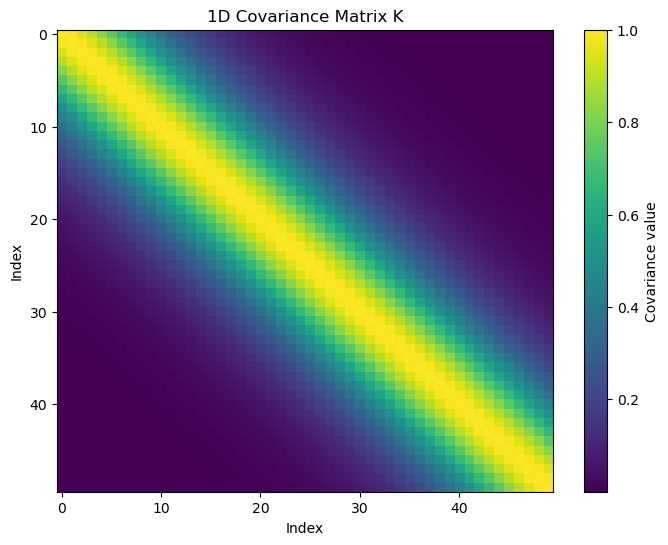

In [178]:
import numpy as np
import matplotlib.pyplot as plt
import pymc as pm

# Set the random seed for reproducibility
RANDOM_SEED = 12345
rng = np.random.default_rng(RANDOM_SEED)

# Define a 1D grid
x1 = np.linspace(0, 5, 50)  # Using only x1 as the 1D input
# (No need for x2 here)

# Reshape x1 to be a 2D array where each row is a point in 1D space
X = x1[:, None]  # Now X is (50, 1) rather than a 2D grid

# Define the kernel with 1D input
l_true = 0.8
eta_true = 1.0
cov = eta_true**2 * pm.gp.cov.Matern52(1, l_true)  # 1D input

# Compute the covariance matrix
K = cov(X).eval()

# Plot K as an image
plt.figure(figsize=(8, 6))
plt.imshow(K, cmap='viridis', aspect='auto')
plt.colorbar(label='Covariance value')
plt.title('1D Covariance Matrix K')
plt.xlabel('Index')
plt.ylabel('Index')
plt.show()

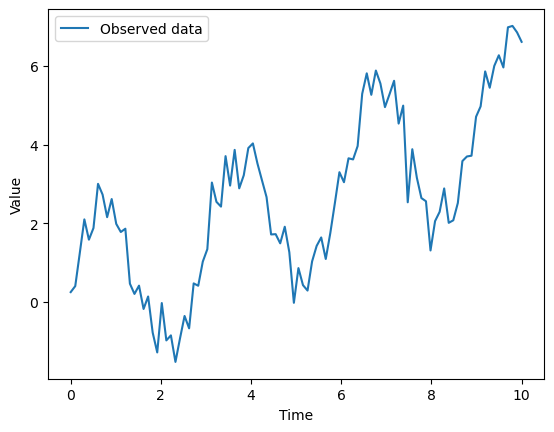

In [287]:
import numpy as np
import matplotlib.pyplot as plt

# Seed for reproducibility
np.random.seed(42)

# Generate time points
n = 100
t = np.linspace(0, 10, n)

# Create trend (linear)
trend = 0.5 * t

# Create seasonality (sine wave)
seasonality = 2 * np.sin(2 * np.pi * t / 3)

# Add noise
noise = np.random.normal(0, 0.5, n)

# Combine to create the time series
y = trend + seasonality + noise

# Plot the synthetic data
plt.plot(t, y, label="Observed data")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.show()

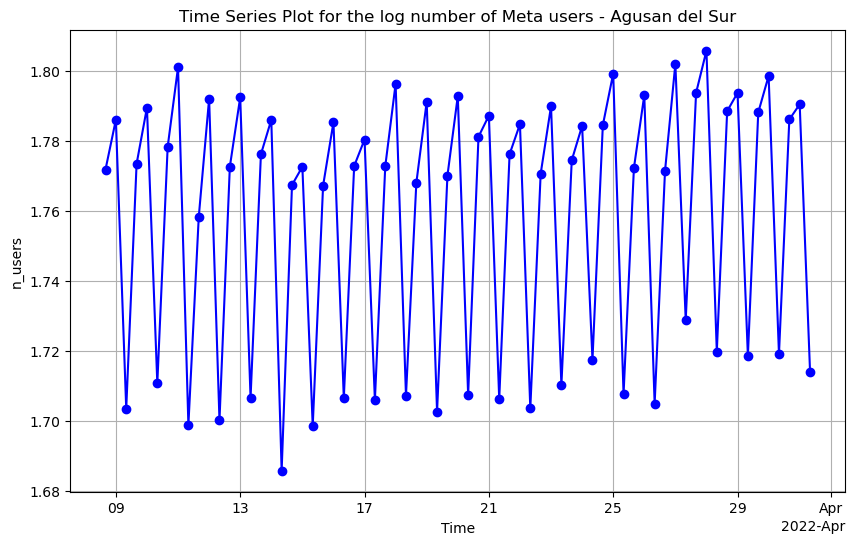

In [309]:
adm = 2
adm_name = ds_poly.isel(ADM_NAME=adm).ADM_NAME.values.item()
ds_poly.isel(ADM_NAME=adm).isel(date_time=slice(200,269))["n_users"].plot.line(marker='o', linestyle='-', color='b', figsize=(10, 6))

plt.title(f'Time Series Plot for the log number of Meta users - {adm_name}')
plt.xlabel('Time')
plt.ylabel('n_users')
plt.grid(True)
plt.show()

y = ds_poly.isel(ADM_NAME=2).isel(date_time=slice(200,269))["n_users"].values
t = np.arange(len(y))

In [412]:
import pymc as pm


# Center the time variable
t_centered = t - np.mean(t)

# Start building the PyMC model
with pm.Model() as model:
    # GP for the weak trend
    # Use a very small slope for the linear trend
    mean_trend = pm.gp.mean.Linear(coeffs=pm.Normal("slope", mu=0, sigma=0.1), intercept=0)
    
    # GP for the seasonality
    ls_seasonal = pm.Gamma("l_seasonal", alpha=2, beta=1)
    cov_seasonal = pm.gp.cov.Periodic(input_dim=1, period=3, ls=ls_seasonal)

    ls_trend = pm.Gamma("ls_trend", alpha=5, beta=1)  # Larger mean length scale for a weak trend
    cov_trend = pm.gp.cov.ExpQuad(input_dim=1, ls=ls_trend)
    # Combine the weak trend and seasonal covariance functions
    cov_combined = cov_seasonal
    
    # Create the GP using the combined mean and covariance functions
    gp = pm.gp.Marginal(mean_func=mean_trend, cov_func=cov_combined)
    
    # Define the likelihood
    sigma = pm.HalfNormal("noise", sigma=1)
    y_obs = gp.marginal_likelihood("z_obs", X=t_centered[:, None], y=y, noise=sigma)
    
    # Inference
    trace = pm.sample(1000, return_inferencedata=True, target_accept=0.8)
    
    # Posterior predictive
    y_pred = gp.conditional("z_pred", t_centered[:, None])
    pred_samples = pm.sample_posterior_predictive(trace, var_names=["z_pred"])

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [slope, l_seasonal, ls_trend, noise]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 26 seconds.
Sampling: [z_pred]


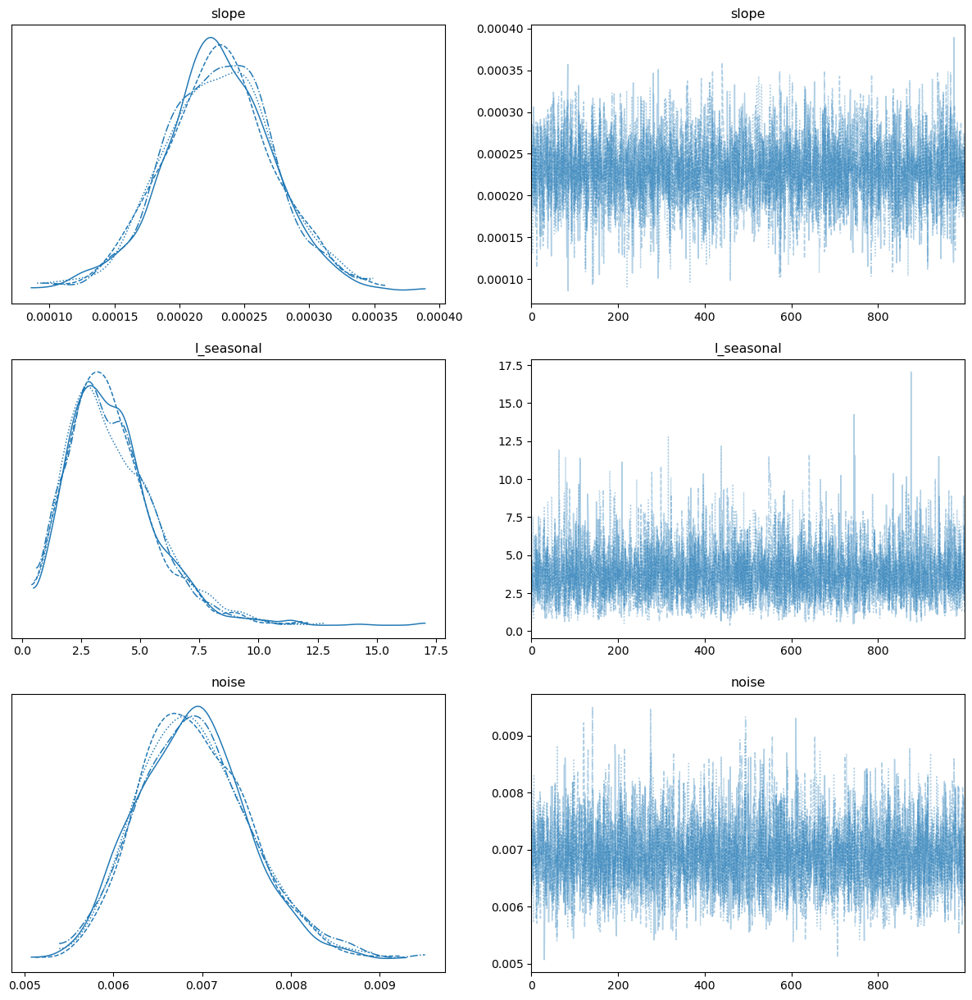

<Figure size 640x480 with 0 Axes>

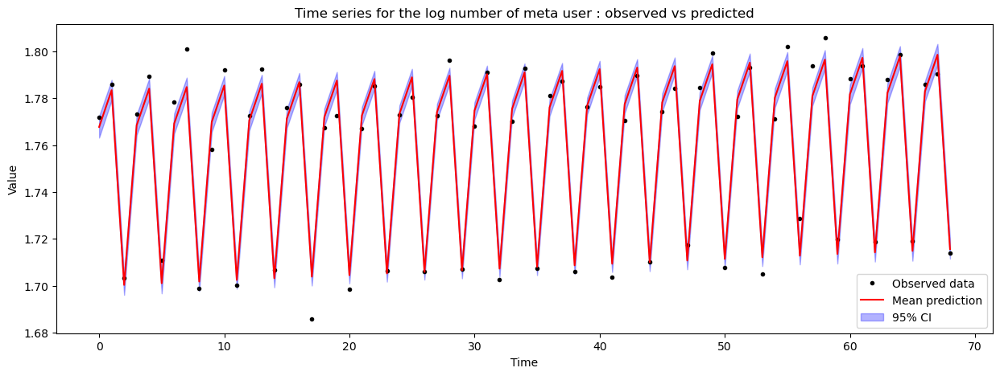

In [416]:
import pymc as pm
import arviz as az
# Plot parameter chains
az.plot_trace(trace, var_names=["slope", "l_seasonal", "noise"], figsize=(15, 15))
plt.show()
plt.suptitle("Trace Plots for Slope, Seasonal Length Scale, and Noise Parameters", fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.9)

plt.show()
mean_pred = pred_samples.posterior_predictive["z_pred"].isel(chain=3).mean(axis=0)
lower_bound = np.percentile(pred_samples.posterior_predictive["z_pred"].isel(chain=3), 2.5, axis=0)
upper_bound = np.percentile(pred_samples.posterior_predictive["z_pred"].isel(chain=3), 97.5, axis=0)

# Plot the results
plt.figure(figsize=(15, 5))

# Plot observed data
plt.plot(t, y, 'k.', label="Observed data")

# Plot the mean prediction
plt.plot(t, mean_pred, 'r', label="Mean prediction")

# Plot the 95% confidence interval
plt.fill_between(t, lower_bound, upper_bound, color='b', alpha=0.3, label="95% CI")

plt.xlabel("Time")
plt.ylabel("Value")
plt.title("Time series for the log number of meta user : observed vs predicted")
plt.legend()
plt.show()


In [413]:
# Define future time points for forecasting
t_future = np.linspace(68, 150, 100)  # Predicting from time 10 to 15
t_all = np.concatenate([t, t_future])  # Combine past and future time points

# Center the future time points
t_future_centered = t_future - np.mean(t)
t_all_centered = t_all - np.mean(t)

with model:
    y_future = gp.conditional("y_future", t_future_centered[:, None])
    future_samples = pm.sample_posterior_predictive(trace, var_names=["y_future"])

Sampling: [y_future]


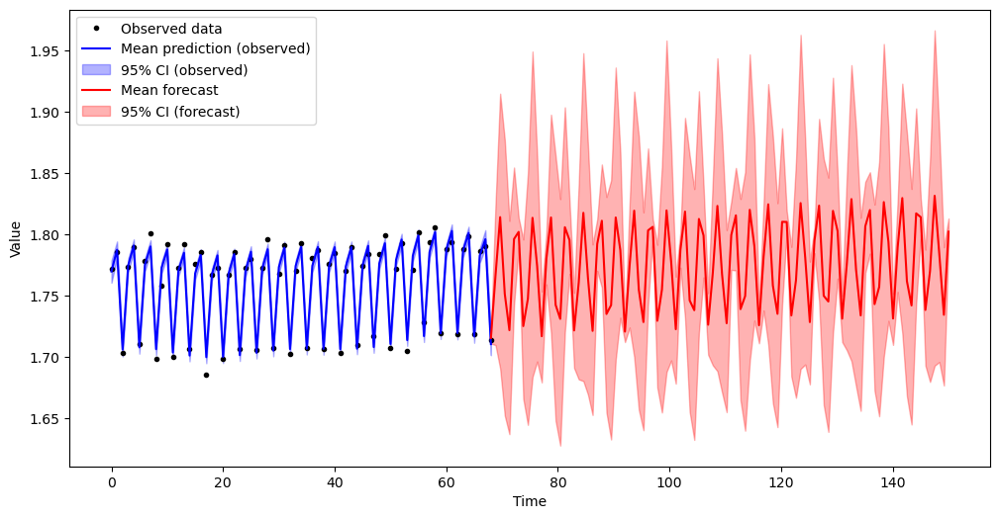

In [414]:
mean_future = future_samples.posterior_predictive["y_future"].isel(chain=3).mean(axis=0)
lower_future = np.percentile(future_samples.posterior_predictive["y_future"].isel(chain=3), 2.5, axis=0)
upper_future = np.percentile(future_samples.posterior_predictive["y_future"].isel(chain=3), 97.5, axis=0)

# Plot the results
plt.figure(figsize=(12, 6))

# Plot observed data
plt.plot(t, y, 'k.', label="Observed data")

# Plot the mean prediction for observed data
plt.plot(t, mean_pred, 'b', label="Mean prediction (observed)")

# Plot the 95% confidence interval for observed data
plt.fill_between(t, lower_bound, upper_bound, color='b', alpha=0.3, label="95% CI (observed)")

# Plot the mean forecast for future data
plt.plot(t_future, mean_future, 'r', label="Mean forecast")

# Plot the 95% confidence interval for future data
plt.fill_between(t_future, lower_future, upper_future, color='r', alpha=0.3, label="95% CI (forecast)")

plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.show()

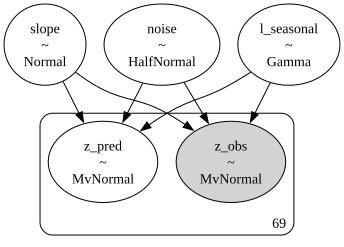

In [376]:
import graphviz

# Build the graph representation of the PyMC model
graph = pm.model_to_graphviz(model)
graph

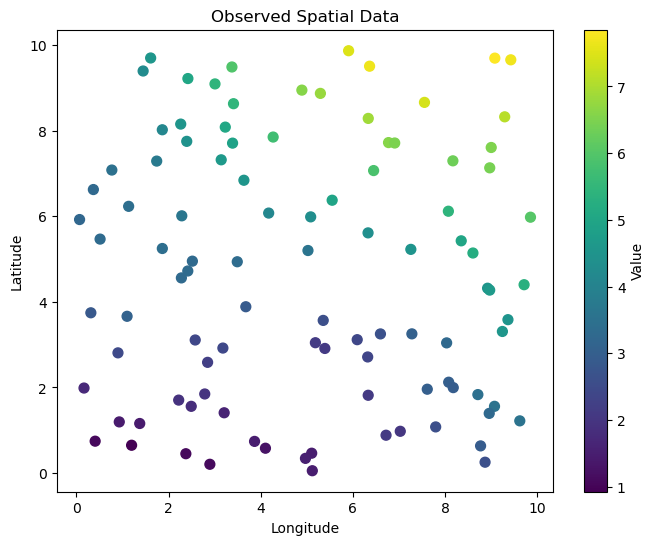

In [18]:
# Seed for reproducibility
np.random.seed(42)

# Generate random spatial coordinates (latitude and longitude)
n = 100
lat = np.random.uniform(0, 10, n)
lon = np.random.uniform(0, 10, n)

# Stack lat and lon to create spatial points
spatial_points = np.stack([lat, lon], axis=1)

# Create a synthetic spatial field with trend and smooth variation
trend = 0.5 * lat + 0.3 * lon
spatial_variation = np.sin(0.5 * lat) * np.cos(0.5 * lon)
noise = np.random.normal(0, 0.1, n)

# Combine to create the synthetic spatial data
z = trend + spatial_variation + noise

# Scatter plot of the spatial data
plt.figure(figsize=(8, 6))
plt.scatter(lon, lat, c=z, cmap="viridis", s=50)
plt.colorbar(label="Value")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Observed Spatial Data")
plt.show()

In [19]:
nan_geometries = ds['n_users'].isnull().any(dim='date_time')
ds_filtered = ds.isel(date_time = slice(200,269))
ds_spatial =  mask_cuboidPoints_ADM(ds_filtered, ["Bohol"]).isel(date_time=-1)
ds_spatial

s = np.array([geom.coords[0] for geom in ds_spatial.geometry.values])

# Extract the n_users data
z = ds_spatial.n_users.values


valid_indices = ~np.isnan(z)

# Step 2: Filter both s and z to remove NaNs and their associated indices
s = s[valid_indices]
z = z[valid_indices]

In [21]:
import pymc as pm
import arviz as az

raster_path = r'c:\Thesis\Data\phl_pd_2020_1km.tif'
points_gdf = xarray_to_geodataframe(ds_spatial)
gdf = raster_values_at_points(raster_path, points_gdf, column_name="pop_density")

# Convert `s` to Shapely Point objects
s_points = [sp.Point(coords) for coords in s]

# Assuming `gdf` is your GeoDataFrame containing the geometries and pop_density
# Example: gdf = gpd.read_file('your_file.shp')  # or however you load your geodataframe

# Initialize an empty list to store matched pop_density values
matched_pop_densities = []

# Iterate through each Point in s_points and find the closest match in gdf
for point in s_points:
    # Calculate the distance to all geometries in gdf and get the closest one
    gdf['distance'] = gdf.geometry.distance(point)
    closest_row = gdf.loc[gdf['distance'].idxmin()]
    
    # Append the corresponding pop_density value
    matched_pop_densities.append(closest_row['pop_density'])

# Convert the list to a NumPy array with shape (236, 1)
X_ext = np.array(matched_pop_densities).reshape(-1, 1)
X_ext.shape

NameError: name 'xarray_to_geodataframe' is not defined

In [59]:
import pymc as pm
import arviz as az

# Center the spatial coordinates
s_centered = s 

with pm.Model() as spatial_model:
    # GP mean function (optional; here using a constant mean)
    mean_func = pm.gp.mean.Constant(c=0)
    
    # Matérn 5/2 covariance function for spatial data
    ls = pm.Gamma("l_exp", alpha=2, beta=2)
    cov_func = pm.gp.cov.Exponential(input_dim=2, ls=ls)
    
    # Define the GP using the mean and covariance functions
    gp = pm.gp.Marginal(mean_func=mean_func, cov_func=cov_func)
    
    # Define the likelihood
    sigma = pm.HalfNormal("noise", sigma=0.1)
    z_obs = gp.marginal_likelihood("z_obs", X=s_centered, y=z, noise=sigma)
    
    # Inference
    trace = pm.sample(1000, return_inferencedata=True)
    
    # Posterior predictive
    z_pred = gp.conditional("z_pred", s_centered)
    pred_samples = pm.sample_posterior_predictive(trace, var_names=["z_pred"])

c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\pymc\gp\gp.py:56: FutureWarning: The 'noise' parameter has been been changed to 'sigma' in order to standardize the GP API and will be deprecated in future releases.
  warnings.warn(_noise_deprecation_warning, FutureWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [l_exp, noise]


c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 38 seconds.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [z_pred]


c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

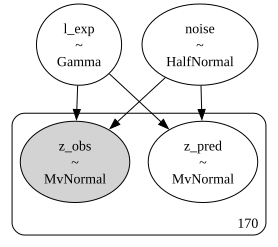

In [61]:

# Build the graph representation of the PyMC model
graph = pm.model_to_graphviz(spatial_model)
graph

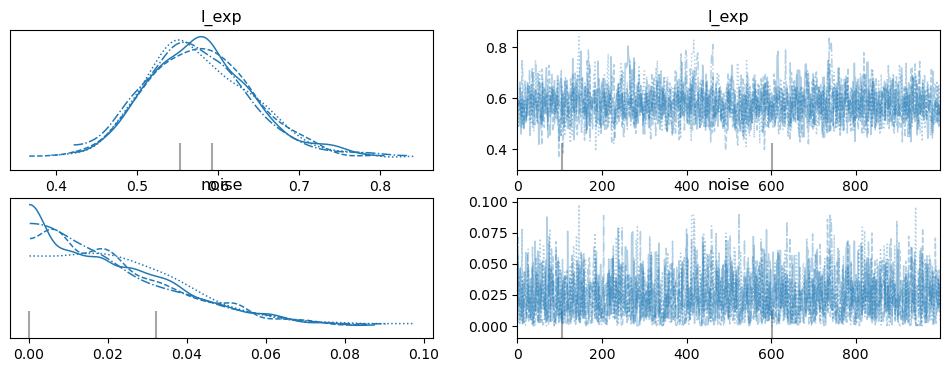

In [60]:
import arviz as az

# Plot parameter chains
az.plot_trace(trace)
plt.show()

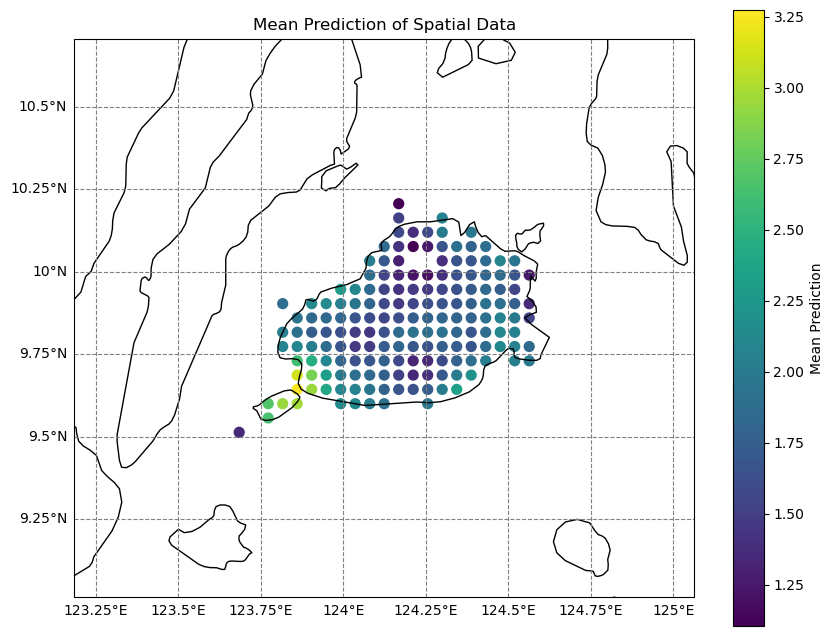

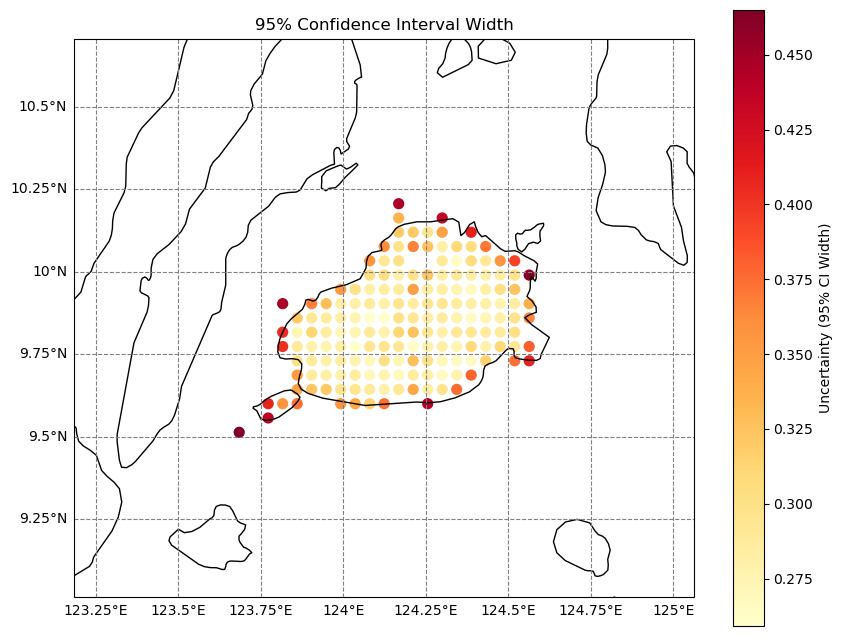

In [53]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np

# Assuming 's' is your spatial coordinates array, and 'mean_pred', 'lower_bound', and 'upper_bound' are already calculated.

# Set up the projection
projection = ccrs.PlateCarree()

# Define the extent of the map (min_lon, max_lon, min_lat, max_lat)
extent = [np.min(s[:, 0])-0.5, np.max(s[:, 0])+0.5, np.min(s[:, 1])-0.5, np.max(s[:, 1])+0.5]

# Plot the mean prediction on a spatial map
plt.figure(figsize=(10, 8))
ax = plt.axes(projection=projection)
ax.set_extent(extent, crs=projection)
ax.coastlines()

# Add gridlines
gl = ax.gridlines(draw_labels=True, color='gray', linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Scatter plot for the mean prediction
sc = ax.scatter(s[:, 0], s[:, 1], c=mean_pred, cmap="viridis", s=50, transform=projection)
plt.colorbar(sc, ax=ax, orientation="vertical", label="Mean Prediction")
plt.title("Mean Prediction of Spatial Data")
plt.show()

# Plot the 95% confidence interval width on a spatial map
plt.figure(figsize=(10, 8))
ax = plt.axes(projection=projection)
ax.set_extent(extent, crs=projection)
ax.coastlines()

# Add gridlines
gl = ax.gridlines(draw_labels=True, color='gray', linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Scatter plot for the 95% confidence interval width
ci_width = upper_bound - lower_bound
sc = ax.scatter(s[:, 0], s[:, 1], c=ci_width, cmap="YlOrRd", s=50, transform=projection)
plt.colorbar(sc, ax=ax, orientation="vertical", label="Uncertainty (95% CI Width)")
plt.title("95% Confidence Interval Width")
plt.show()

In [44]:
lat_min, lat_max = 123.85, 124.6
lon_min, lon_max = 9.6, 10.1

# Create a grid of new spatial points within the existing data extent
lat_new = np.linspace(lat_min, lat_max, 10)  # Adjust the number of points as needed
lon_new = np.linspace(lon_min, lon_max, 10)  # Adjust the number of points as needed
lon_new, lat_new = np.meshgrid(lon_new, lat_new)
spatial_points_new = np.stack([lat_new.ravel(), lon_new.ravel()], axis=1)


# Conditional GP prediction at new spatial points
with spatial_model:
    z_future = gp.conditional("z1", spatial_points_new)
    future_samples = pm.sample_posterior_predictive(trace, var_names=["z1"])

Sampling: [z1]


c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

In [45]:
lon_min, lon_max 

(9.6, 10.1)

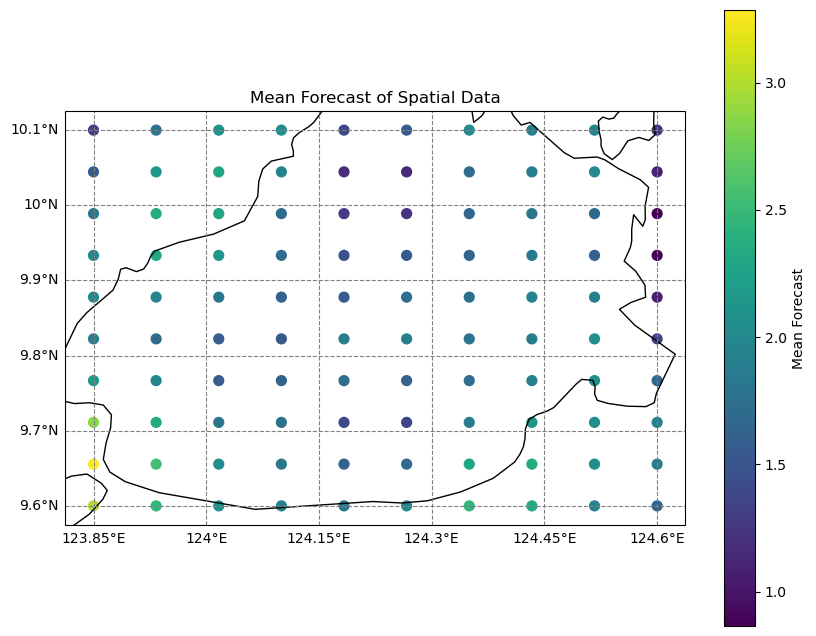

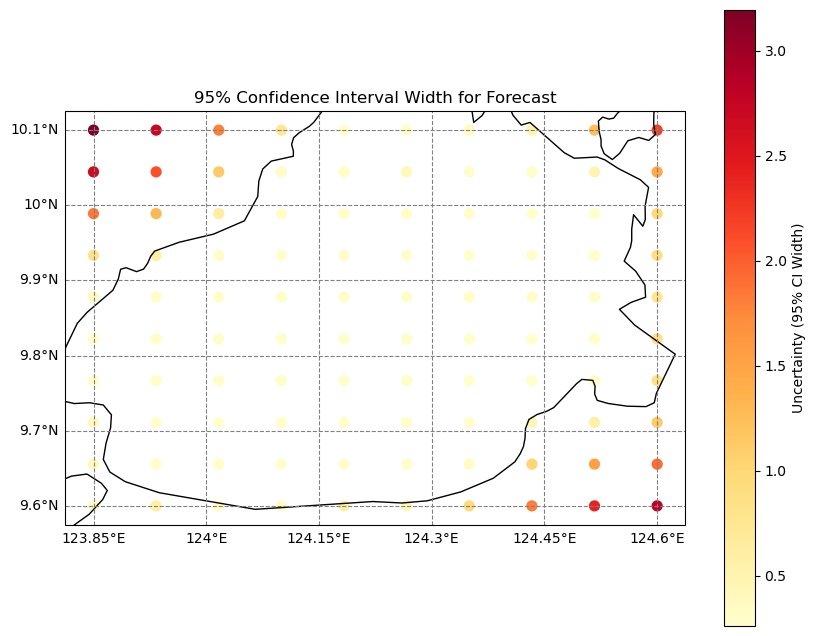

In [51]:
# Assuming 'spatial_points_new' is your new spatial coordinates array,
# and 'mean_future', 'lower_future', and 'upper_future' are already calculated.

# Calculate the mean and 95% confidence interval for the future predictions
mean_future = future_samples.posterior_predictive["z1"].isel(chain=3).mean(axis=0)
lower_future = np.percentile(future_samples.posterior_predictive["z1"].isel(chain=3), 2.5, axis=0)
upper_future = np.percentile(future_samples.posterior_predictive["z1"].isel(chain=3), 97.5, axis=0)

# Plot the mean forecast on a map with coastlines
plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()

# Add gridlines
gl = ax.gridlines(draw_labels=True, color='gray', linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Scatter plot for the mean forecast
sc = ax.scatter(spatial_points_new[:, 0], spatial_points_new[:, 1], c=mean_future, cmap="viridis", s=50, transform=ccrs.PlateCarree())
plt.colorbar(sc, ax=ax, label="Mean Forecast")
plt.title("Mean Forecast of Spatial Data")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Plot the 95% confidence interval width on a map with coastlines
plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(resolution='10m')

# Add gridlines
gl = ax.gridlines(draw_labels=True, color='gray', linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Scatter plot for the 95% confidence interval width
ci_width = upper_future - lower_future
sc = ax.scatter(spatial_points_new[:, 0], spatial_points_new[:, 1], c=ci_width, cmap="YlOrRd", s=50, transform=ccrs.PlateCarree())
plt.colorbar(sc, ax=ax, label="Uncertainty (95% CI Width)")
plt.title("95% Confidence Interval Width for Forecast")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [50]:
(upper_future - lower_future).shape

(100,)

Use GS for better manipulation

Variogram - Fitting variogram - Plotting different covariance functions - 

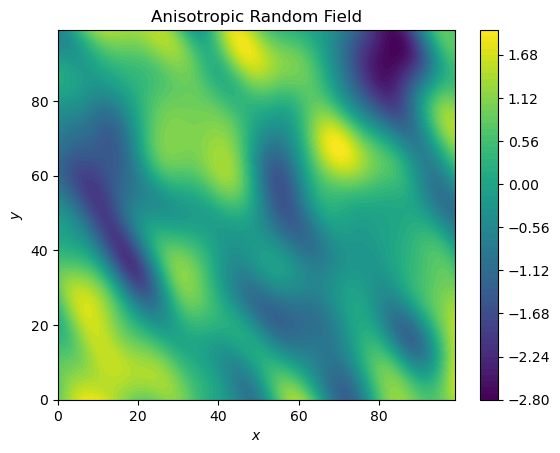

In [24]:
x = y = range(100)
model = gs.Gaussian(dim=2, var=1, len_scale=8,anis=2, angles=35)
srf = gs.SRF(model, seed=123)
field = srf.structured([x, y])
srf.plot()
plt.title("Anisotropic Random Field")
plt.show()

In [ ]:
# Step 1 purely spatial variogram model fitting

import numpy as np
import gstools as gs
import matplotlib.pyplot as plt

# Assuming lat, lon, and val are already defined as per your given data
lat = np.array([[p.y] for p in ds_masked_circle.coords['geometry'].values])
lon = np.array([[p.x] for p in ds_masked_circle.coords['geometry'].values])
val = ds_masked_circle.isel(date_time=0)['n_users'].values

# Compute the empirical variogram
bin_center, gamma = gs.vario_estimate(pos=(lon, lat), field=val)

# Define the variogram models
models = {
    "Exponential": gs.Exponential(dim=2),
    "Spherical": gs.Spherical(dim=2),
    "Gaussian": gs.Gaussian(dim=2),
    "Matérn": gs.Matern(dim=2, nu=0.5)  # nu is the smoothness parameter for Matérn model
}

# Fit each model and plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot empirical variogram
ax.scatter(bin_center, gamma, label='Empirical', color='black')

scores = {}
# Fit and plot each model
for name, model in models.items():
    _,_,r2 = model.fit_variogram(bin_center, gamma, nugget=True, return_r2=True)
    scores[name] = r2
    model.plot(x_max=max(bin_center), ax=ax, label=name)


# Extract range and sill for the Matérn model
last_model = list(models.values())[-1]


# Add labels and legend
ax.set_xlabel('Lag')
ax.set_ylabel('Semivariance')
ax.legend()
ax.set_title('Variogram Models Fit')
plt.show()


# Print the fitted models
for name, model in models.items():
    print(f"{name} Model:")
    print(model)
    print()

ranking = sorted(scores.items(), key=lambda item: item[1], reverse=True)
print("RANKING by Pseudo-r2 score")
for i, (model, score) in enumerate(ranking, 1):
    print(f"{i:>6}. {model:>15}: {score:.5}")

plt.show()

In [ ]:
# Compute directional variograms
angle = [np.pi / 2]
angle2 = [np.pi / 8]

bin_center, dir_vario = gs.vario_estimate(
    pos=(lon, lat),
    field=val,
    direction=gs.rotated_main_axes(dim=2, angles=angle),
    angles_tol=np.pi / 16,
)

bin_center2, dir_vario2 = gs.vario_estimate(
    pos=(lon, lat),
    field=val,
    direction=gs.rotated_main_axes(dim=2, angles=angle2),
    angles_tol=np.pi / 16,
)



# Plot directional variograms
fig, ax1 = plt.subplots(1, figsize=[10, 5])

ax1.scatter(bin_center, dir_vario[0], label=r"$\frac{\pi}{2}$", color='red')
ax1.scatter(bin_center2, dir_vario[1], label=r"$\frac{\pi}{4}$", color='orange')
ax1.scatter(bin_center, dir_vario2[0], label=r"$\frac{\pi}{8}$", color='blue')
ax1.scatter(bin_center2, dir_vario2[1], label=r"$\frac{5\pi}{8}$", color='green')

ax1.set_xlabel('Lag')
ax1.set_ylabel('Semivariance')
ax1.legend(loc="lower right")
ax1.set_title("Directionnal variograms")

plt.show()

In [ ]:
def generate_covariance_matrix(points, model):
    """
    Generate a covariance matrix for a given set of points and covariance model.

    Parameters:
    points (ndarray): An array of shape (n_points, 2) representing the coordinates of the points.
    model: The covariance model to use (e.g., gs.Exponential).
    var (float): The variance parameter for the covariance model (default is 0.1).
    len_scale (float): The length scale parameter for the covariance model (default is 5).

    Returns:
    ndarray: The covariance matrix.
    """
    # Calculate pairwise distances (lags) between points
    num_points = points.shape[0]
    distance_matrix = np.zeros((num_points, num_points))

    for i in range(num_points):
        for j in range(num_points):
            distance_matrix[i, j] = np.linalg.norm(points[i] - points[j])
            
    # Calculate the covariance matrix using the distances
    covariance_matrix = model.covariance(distance_matrix)
    
    return covariance_matrix


def generate_covariance(points, new_point, model):
    """
    Generate a covariance matrix between a new point and a set of existing points.

    Parameters:
    points (ndarray): An array of shape (n_points, 2) representing the coordinates of the existing points.
    new_point (array-like): The coordinates of the new point (e.g., [x, y]).
    model: The covariance model to use (e.g., gs.Exponential).
    var (float): The variance parameter for the covariance model (default is 0.1).
    len_scale (float): The length scale parameter for the covariance model (default is 5).

    Returns:
    ndarray: The covariance vector of size (n_points, 1).
    """
    # Ensure new_point is a numpy array
    new_point = np.array(new_point)
    
    # Calculate distances between the new point and all existing points
    num_points = points.shape[0]
    distances = np.zeros((num_points, 1))
    
    for i in range(num_points):
        distances[i] = np.linalg.norm(points[i] - new_point)
    
    # Calculate the covariance between the new point and itself
    
    # Calculate the covariance vector using the distances
    covariance_vector = model.covariance(distances)
    
    return covariance_vector

In [ ]:
gs.covmodel.plot.plot_covariance(models["Exponential"])
print(models["Exponential"].covariance(0.1))

n_points = 500
dist_between_points = 0.001
x_coords = np.linspace(0, (n_points - 1) * dist_between_points, n_points)
y_coords = np.linspace(0, (n_points - 1) * dist_between_points, n_points)
points = np.vstack((x_coords, y_coords)).T

# Order points by distance from the first point
distances_from_first = np.linalg.norm(points - points[0], axis=1)
sorted_indices = np.argsort(distances_from_first)
points = points[sorted_indices]

a = generate_covariance(points,[0,0.3],models["Exponential"])
print(a)

num_points = points.shape[0]
distance_matrix = np.zeros((num_points, num_points))

for i in range(num_points):
    for j in range(num_points):
        distance_matrix[i, j] = np.linalg.norm(points[i] - points[j])

# Calculate the covariance matrix using the distances
covariance_matrix = models["Exponential"].covariance(distance_matrix)


# Display the covariance matrix
print("Distance Matrix:\n", distance_matrix)
print("Covariance Matrix:\n", covariance_matrix)

plt.figure(figsize=(10, 8))
plt.imshow(covariance_matrix, extent=(0, 100, 0, 100))
plt.colorbar(label='Covariance')
plt.title('Covariance Matrix')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

In [ ]:
new_point = [0, 0.05]
cov_vector = generate_covariance(points,new_point,models["Matérn"])

plt.scatter(points[:, 0], points[:, 1], c=cov_vector, cmap='viridis', s=100)
plt.colorbar(label='Covariance')
plt.scatter(new_point[0], new_point[1], color='red', label='New Point', s=100)
plt.title('Covariance of Points with New Point [0, 0]')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend()
plt.show()

In [ ]:
lon = np.array([p.x for p in ds_masked_circle.coords['geometry'].values])
lat = np.array([p.y for p in ds_masked_circle.coords['geometry'].values])

points = np.vstack((lon, lat)).T

cov_matrix = generate_covariance_matrix(points,models["Matérn"])
cov_vector = generate_covariance(points,[124,8],models["Matérn"])
plt.scatter(points[:, 0], points[:, 1], c=cov_vector, cmap='viridis', s=5)
plt.colorbar(label='Covariance')
plt.scatter(124, 8, color='red', label='New Point', s=10)
plt.title('Covariance for a new point location')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend()
plt.show()

Get weights

In [ ]:
n = covariance_matrix.shape[0]
M = np.zeros((n + 1, n + 1))
M[:n, :n] = covariance_matrix; M[n, :n] = 1; M[:n, n] = 1; M[n, n] = 0
V = np.zeros(n + 1); V[:n] = cov_vector.reshape(-1); V[n] = 1
lamda = np.linalg.solve(M, V)


In [ ]:

lat_min, lat_max = lat.min(), lat.max()
lon_min, lon_max = lon.min(), lon.max()

num_points = 1000 # Total number of points you want to generate
lat_new = np.linspace(lat_min, lat_max, int(np.sqrt(num_points)))
lon_new = np.linspace(lon_min, lon_max, int(np.sqrt(num_points)))
lon_grid, lat_grid = np.meshgrid(lon_new, lat_new)

# Flatten the grid to get arrays of latitudes and longitudes
lat_grid_flat = lat_grid.flatten()
lon_grid_flat = lon_grid.flatten()


Space time

In [ ]:
import numpy as np
import gstools as gs
import matplotlib.pyplot as plt

model2 = gs.Exponential(dim=2)

var2 = []
len_scale2 = []
nugget2 = []
# Assuming ds_masked_circle is your dataset containing 'date_time', 'geometry', and 'n_users'
lat = np.array([[p.y] for p in ds_masked_circle.coords['geometry'].values])
lon = np.array([[p.x] for p in ds_masked_circle.coords['geometry'].values])

fig, ax = plt.subplots(figsize=(10, 6))

# Loop through each date_time index and plot the variograms
for i in range(100):
    val = ds_masked_circle.isel(date_time=i)['n_users'].values
    
    # Compute the empirical variogram
    bin_center, gamma = gs.vario_estimate(pos=(lon, lat), field=val)

    # Fit the model to the variogram
    model2.fit_variogram(bin_center, gamma, nugget=True, return_r2=True)
    var2.append(model2.var);len_scale2.append(model2.len_scale);nugget2.append(model2.var)
    # Plot the fitted model with alpha for transparency
    model2.plot(x_max=max(bin_center), ax=ax, alpha=0.5, label=f'Time step {i+1}', color = "green")

# Add labels and legend
ax.set_xlabel('Lag')
ax.set_ylabel('Semivariance')
ax.set_title('Space-time variograms fixed time')
ax.legend().remove()
plt.show()

In [ ]:
model1 = gs.Exponential(dim=1)

var1 = []
len_scale1 = []
nugget1 = []

# Select 50 random geometries from the filtered dataset
num_geometries = len(ds_masked_circle.geometry)
random_indices = random.sample(range(num_geometries), 100)

# Create a figure and axes for the stacked plot
fig, ax1 = plt.subplots(1, figsize=(15, 20))

# Loop through the selected geometries and plot their gamma lines
for idx in random_indices:
    field_values = ds_masked_circle.isel(geometry=idx)["n_users"].values
    date_time_coords = ds_masked_circle.coords['date_time'].values

    # Create a pandas Series with the date_time_index and field_values
    time_series = pd.Series(field_values, index=date_time_coords)
    
    # Differentiation with lag of 3
    diff_3 = time_series.diff(periods=3).dropna()
    
    # Calculate the variance of the time series
    variance = np.var(diff_3)
    
    # Calculate ACF values
    acf_values = acf(diff_3, nlags=40)
    
    # Convert ACF to covariance function
    gamma = (1 - acf_values) * variance
    
    # Fit the variogram model and plot
    model1.fit_variogram(np.arange(41), gamma, nugget=False, return_r2=True)
    var1.append(model1.var);len_scale1.append(model1.len_scale);nugget1.append(model1.var)
    model1.plot(x_max=max(np.arange(41)), alpha=0.5, color="blue", ax=ax1)
# Set labels and title for the gamma plot
ax1.set_xlabel('Lag')
ax1.set_ylabel('Covariance')
ax1.set_title('Space-time variograms fixed space')
ax1.grid()
ax1.legend().remove()


In [ ]:
lon = np.array([p.x for p in ds_masked_circle.coords['geometry'].values])
lat = np.array([p.y for p in ds_masked_circle.coords['geometry'].values])
points = np.vstack((lon, lat)).T

cov_t = gs.Exponential(dim=1, var=np.median(var1), len_scale=np.median(len_scale1), nugget=np.median(nugget1))
cov_s = gs.Exponential(dim=2, var=np.mean(var2), len_scale=np.mean(len_scale2), nugget=np.mean(nugget2))

Sigma_t = generate_covariance_matrix(np.array([200, 201]),model1)
sig_t = generate_covariance(points=np.array([0,1]),new_point=np.array([2]),model=model1)
Sigma_s = generate_covariance_matrix(points,model2)
sig_s = generate_covariance(points,[125.33,8],model2)

In [ ]:
Sigma_full = np.kron(Sigma_t, Sigma_s)
sig_full = np.kron(sig_t,sig_s)

lamda = np.linalg.solve(Sigma_full, sig_full)
lamda

In [ ]:
import matplotlib

shape = points[:, 1].shape[0]

np.sum(lamda)
lamda

global_min = lamda[1*shape:2*shape].min()
global_max = lamda[1*shape:2*shape].max()

# Create a Normalize object
norm = matplotlib.colors.Normalize(global_min,global_max)

plt.scatter(points[:, 0], points[:, 1], c=lamda[1*shape:2*shape], cmap='viridis', s=15, norm=norm)
plt.colorbar(label='Weights')
plt.title("Space time interpolation weights at $t$ = 0 | Random process separability",fontsize=7)

In [ ]:
def space_time_covariance(tau, h, model1,model2):
    #Where points 1 is a (n,) and points 2 is a (m,2)
    """
    Generate a covariance matrix for a given set of points and covariance model.

    Parameters:
    points (ndarray): An array of shape (n_points, 2) representing the coordinates of the points.
    model: The covariance model to use (e.g., gs.Exponential).
    var (float): The variance parameter for the covariance model (default is 0.1).
    len_scale (float): The length scale parameter for the covariance model (default is 5).

    Returns:
    ndarray: The covariance matrix.
    """

    return model2.var * (model1.covariance(tau)/model1.var) * (model2.covariance(h)/model2.var) 
    
space_time_covariance(10,0,model1,model2)

def generate_covariance_matrix(spatial_points, temporal_points, model1, model2):
    """
    Generate a space-time covariance matrix for given spatial and temporal points.

    Parameters:
    spatial_points (ndarray): An array of shape (n, 2) representing the coordinates of the spatial points.
    temporal_points (ndarray): An array of shape (m,) representing the temporal points.
    model1: The covariance model for temporal distance.
    model2: The covariance model for spatial distance.

    Returns:
    ndarray: The space-time covariance matrix of shape (mn, mn).
    """
    n = len(spatial_points)
    m = len(temporal_points)
    
    # Compute spatial distances (h) between all pairs of spatial locations
    spatial_distances = np.linalg.norm(spatial_points[:, np.newaxis, :] - spatial_points[np.newaxis, :, :], axis=2)
    # Compute temporal distances (tau) between all pairs of temporal points
    temporal_distances = np.abs(temporal_points[:, np.newaxis] - temporal_points[np.newaxis, :])

    # Initialize the covariance matrix
    covariance_matrix = np.zeros((n * m, n * m))
    
    # Calculate the space-time covariance for each combination
    for i in range(m):
        for j in range(m):
            for k in range(n):
                for l in range(n):
                    h = spatial_distances[k, l]
                    tau = temporal_distances[i, j]
                    covariance_matrix[i * n + k, j * n + l] = space_time_covariance(tau, h, model1, model2)
    
    return covariance_matrix


spatial_points = np.array([[124, 8], [124.5, 8]])
temporal_points = np.array([0, 1])
covariance_matrix = generate_covariance_matrix(spatial_points, temporal_points, model1, model2)
print(covariance_matrix)

In [ ]:
def generate_covariance_vector(single_spatial_point, single_temporal_point, spatial_points, temporal_points, model1, model2):
    """
    Generate a space-time covariance vector for a given spatial and temporal point
    with respect to a set of spatial and temporal neighbors.

    Parameters:
    single_spatial_point (ndarray): An array of shape (1, 2) representing the coordinates of the spatial point.
    single_temporal_point (float): A single temporal point.
    spatial_points (ndarray): An array of shape (n, 2) representing the coordinates of the spatial points.
    temporal_points (ndarray): An array of shape (m,) representing the temporal points.
    model1: The covariance model for temporal distance.
    model2: The covariance model for spatial distance.

    Returns:
    ndarray: The space-time covariance vector of shape (nm,).
    """
    n = len(spatial_points)
    m = len(temporal_points)
    
    # Compute spatial distances (h) between the single spatial point and all spatial locations
    spatial_distances = np.linalg.norm(spatial_points - single_spatial_point, axis=1)
    
    # Compute temporal distances (tau) between the single temporal point and all temporal points
    temporal_distances = np.abs(temporal_points - single_temporal_point)
    
    # Initialize the covariance vector
    covariance_vector = np.zeros(n * m)
    
    # Calculate the space-time covariance for each combination
    for i in range(m):
        for j in range(n):
            h = spatial_distances[j]
            tau = temporal_distances[i]
            covariance_vector[i * n + j] = space_time_covariance(tau, h, model1, model2)
    
    return covariance_vector

single_spatial_point = np.array([124, 8])
single_temporal_point = 0

covariance_vector = generate_covariance_vector(single_spatial_point, single_temporal_point, spatial_points, temporal_points, model1, model2)
print(covariance_vector)
print(space_time_covariance(1,0,model1,model2))

In [ ]:
Sigma = generate_covariance_matrix(spatial_points=points, temporal_points=np.array([0, 1]),model1=model1,model2=model2)
sig = generate_covariance_vector(single_spatial_point=points[0],single_temporal_point=np.array([2]),spatial_points=points,temporal_points=np.array([0, 1]),model1=model1,model2=model2)

In [ ]:
shape = points.shape[0]

n = Sigma.shape[0]
M = np.zeros((n + 1, n + 1))
M[:n, :n] = Sigma; M[n, :n] = 1; M[:n, n] = 1; M[n, n] = 0
V = np.zeros(n + 1); V[:n] = sig.reshape(-1); V[n] = 1
lamda = np.linalg.solve(M, V)
lamda = np.linalg.solve(Sigma, sig)
np.sum(lamda)

global_min = lamda[0*shape:1*shape].min()
global_max = lamda[0*shape:1*shape].max()

# Create a Normalize object
norm = colors.Normalize(global_min, global_max)

# Scatter plot of the first n weights
plt.scatter(points[:, 0], points[:, 1], c=lamda[0*shape:1*shape], cmap='viridis', s=15, norm=norm)
plt.colorbar(label='Weights')
plt.title('Space time interpolation weights at $t$ = 2 | Covariance separability', fontsize=7.5)
plt.show()

In [ ]:
sum_1 = np.sum(lamda[1*shape:2*shape])
sum_0 = np.sum(lamda[0*shape:1*shape])

# Calculate the percentage
percentage = (sum_1 / sum_0) * 100

# Output the results
sum_1, sum_0, percentage

Crisis stuff

In [13]:
del colors

In [18]:
colorss = [
    "#F08080",  # Light Coral
    "#90EE90",  # Light Green
    "#6495ED",  # Cornflower Blue
    "#FFA07A",  # Light Salmon
    "#D8BFD8",  # Thistle
    "#87CEEB",  # Sky Blue
    "#FFB6C1",  # Light Pink
    "#FFD700",  # Gold
    "#FF69B4",  # Hot Pink
    "#7B68EE",  # Medium Slate Blue
    "#00FA9A",  # Medium Spring Green
    "#EE82EE",  # Violet
    "#20B2AA",  # Light Sea Green
    "#ADFF2F",  # Green Yellow
    "#FF6347",  # Tomato
]

In [15]:
ds

<xarray.Dataset> Size: 3MB
Dimensions:         (date_time: 15, geometry: 12974)
Coordinates:
  * date_time       (date_time) datetime64[ns] 120B 2021-12-13T16:00:00 ... 2...
  * geometry        (geometry) object 104kB POINT (117.00439453125 7.81984685...
    ADM_NAME        (geometry) object 104kB nan 'Palawan' ... 'Davao del Sur'
Data variables:
    n_users         (date_time, geometry) float64 2MB nan nan nan ... nan nan
    percent_change  (date_time, geometry) float64 2MB nan 37.59 ... -17.04 -16.9

2021-12-13 to 2021-12-18 (8h)


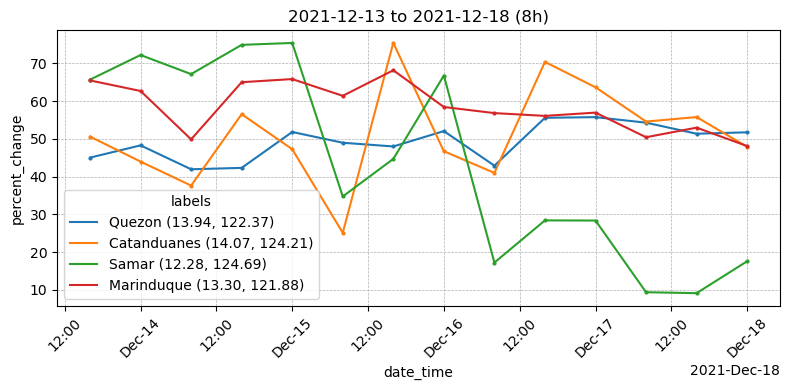

In [71]:

plot_cuboidPoint_time(ds, [4800,6127,7646,4735], slice(0,18),"percent_change","hourly")


A
loop
B


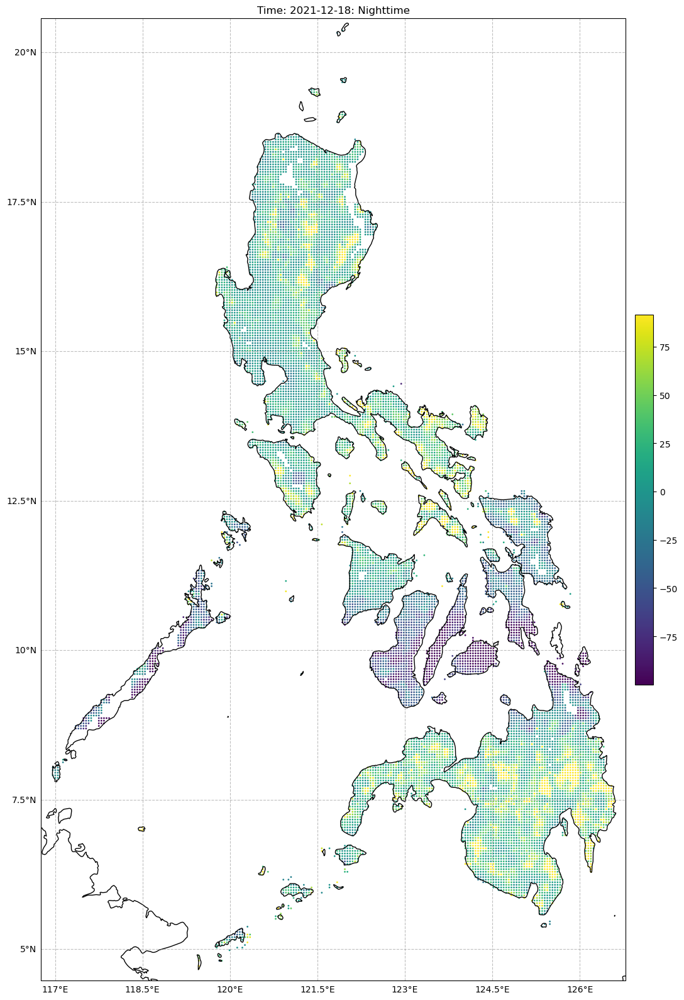

A
loop
B


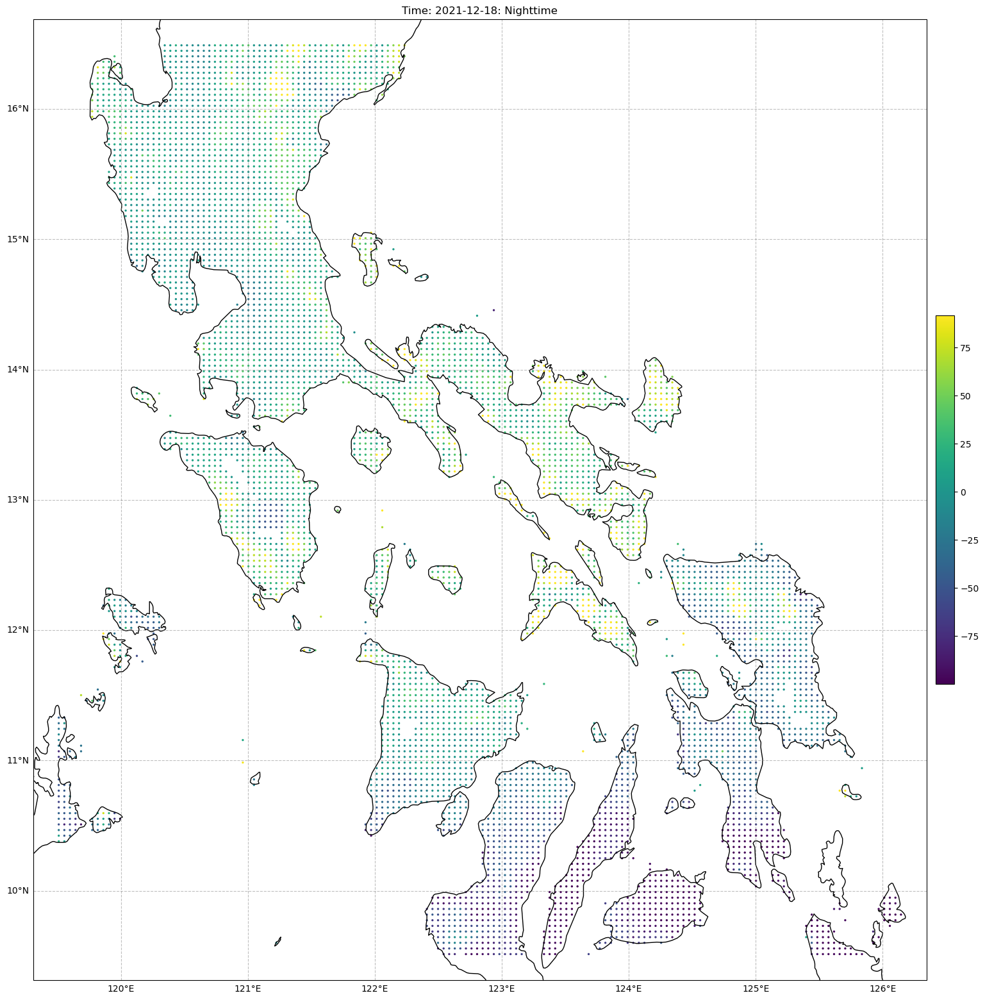

In [13]:
plot_cuboidPoint_space(ds.isel(date_time = [14]),ds, markersize=1, extent=0.2, time_type="hourly",variable="percent_change")
ds_masked_square = mask_cuboidPoints_square(ds,  (123, 13), side_length)
plot_cuboidPoint_space(ds_masked_square.isel(date_time = [14]),ds, markersize=2, extent=0.2, time_type="hourly",variable="percent_change")

In [15]:

def plot_cuboidPoint_space_CAT(dssel, ds, markersize, extent, variable="Cluster", time_type="hourly", time_dim='date_time', percentile=95):
    """
    Plot geometries from an xarray dataset with a time dimension. If the time dimension has multiple values,
    create multiple subplots, one for each time step.

    Parameters:
    dssel (xarray.Dataset): The input dataset containing geometries and data to be plotted.
    ds (xarray.Dataset): The original dataset.
    markersize (int): Size of the markers in the plot.
    extent (float): Extent to add to the plot bounds.
    variable (str): The column name to be used for coloring the points. Default is 'Cluster'.
    time_type (str): Type of time for formatting ('hourly', 'daily', 'weekly', 'monthly'). Default is 'hourly'.
    time_dim (str): The name of the time dimension in the dataset. Default is 'date_time'.
    percentile (int): Percentile for data selection. Default is 95.
    """
    
    def categorize_time(time):
        if time.hour == 8:
            return "Nighttime"
        elif time.hour == 16:
            return "Daytime"
        elif time.hour == 0:
            return "Evening"
        else:
            return "other"

    # Convert dataset to dataframe
    df_selected = dssel.to_dataframe().reset_index()
    gdf = gpd.GeoDataFrame(df_selected, geometry='geometry')
    
    # Get bounds for plotting
    minx, miny, maxx, maxy = gdf.total_bounds
    
    # Check if the dataset has a time dimension
    if time_dim in dssel:
        times = dssel[time_dim].values
    
    num_times = len(times)
    num_cols = 3 if num_times >= 3 else num_times # Number of columns for subplots
    num_rows = math.ceil(num_times / num_cols) if num_times >= 4 else 1
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, num_rows * 10), subplot_kw={'projection': crt.crs.PlateCarree()})
    axes = axes.flatten() if num_times > 1 else [axes]

    for i, time in enumerate(times):
        ax = axes[i]
        if time is not None:
            gdf_time = gdf[gdf[time_dim] == time]
        else:
            gdf_time = gdf
        
        ax.set_extent([minx - extent, maxx + extent, miny - extent, maxy + extent], crs=crt.crs.PlateCarree())
        
        # Plot GeoDataFrame with colors from 'Color' column
        gdf_time.plot(ax=ax, marker='o', color=gdf["Color"], markersize=markersize, alpha=1)
        
        # Add a background map with Cartopy
        ax.coastlines()
        gl = ax.gridlines(draw_labels=True, crs=crt.crs.PlateCarree(), linestyle='--')
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 10, 'color': 'black'}
        gl.ylabel_style = {'size': 10, 'color': 'black'}
        
        # Set plot title
        time = pd.Timestamp(time)
        if time_type == "daily":
            pretty_format = time.strftime('%Y-%m-%d')
        elif time_type == "weekly":
            pretty_format = time.strftime('%Y-%m-%d')
        elif time_type == "monthly":
            pretty_format = time.strftime('%Y-%M')
        else: 
            pretty_format = time.strftime('%Y-%m-%d') + ": " + categorize_time(time)

        title = f'Time: {pretty_format}'
        ax.set_title(title)

    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
        
    # Adjust layout and add legend
    fig.tight_layout()
    
    plt.show()

In [16]:
def load_cuboidPoints(df, date_time_col='date_time'):
    """
    BASE FUNCTION
    
    Create an xarray.Dataset with Point geometries from a DataFrame with a date_time column as the time dimension.

    This function converts a Pandas DataFrame into an xarray.Dataset, setting the specified date_time column
    as the time dimension and renaming it to 'time'.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    date_time_col (str): The name of the column in the DataFrame that represents the date_time dimension.

    Returns:
    xarray.Dataset: An xarray Dataset with 'time' andd geometry as the dimension + information about geometries.

    Notes:
    ------
    - The function assumes that the date_time column is in a format that can be converted to pandas datetime.
    - All columns in the DataFrame, except the date_time column, will be included as data variables in the xarray Dataset.
    """
    # Ensure the date_time column is in datetime format
    df[date_time_col] = pd.to_datetime(df[date_time_col])

    # Set the date_time column as the index
    df = df.set_index([date_time_col,'geometry'])

    # Convert the DataFrame to an xarray Dataset
    ds = df.to_xarray()

    # Rename the date_time dimension to time
    ds = ds.rename({date_time_col: 'date_time'})
    name1s = ds.NAME_1.isel(date_time=0)

    # Drop these variables from the dataset as we will be creating new dimensions
    ds = ds.drop_vars(['geometry_id', 'NAME_1'])
    ds = ds.assign_coords(ADM_NAME=('geometry', name1s.data))

    return ds

ds = load_cuboidPoints(DATA_SHAPE)

# Display the Dataset
print(ds)

<xarray.Dataset> Size: 3MB
Dimensions:         (date_time: 15, geometry: 12974)
Coordinates:
  * date_time       (date_time) datetime64[ns] 120B 2021-12-13T16:00:00 ... 2...
  * geometry        (geometry) object 104kB POINT (117.00439453125 7.81984685...
    ADM_NAME        (geometry) object 104kB nan 'Palawan' ... 'Davao del Sur'
Data variables:
    n_users         (date_time, geometry) float64 2MB nan nan nan ... nan nan
    percent_change  (date_time, geometry) float64 2MB nan 37.59 ... -17.04 -16.9


In [220]:
from sklearn.manifold import TSNE
import matplotlib 
from sklearn.preprocessing import StandardScaler
import joblib

def preprocess_dataset(ds):
    # Ensure the original dataset is not modified
    ds_copy = ds.copy()
    ds_copy = ds_copy.sel(geometry=~ds_copy['percent_change'].isnull().any(dim='date_time'))
    ds_copy['percent_change'] = np.log(ds_copy['percent_change'] + 100)
    df = ds_copy.to_dataframe().reset_index().pivot(index='geometry', columns='date_time', values='percent_change')
    return df

# Function to fit the GaussianMixture model
def fit_gmm(df, n_components=6, random_state=69):
    df_copy = df.copy()
    gmm = joblib.load(r'C:/Thesis/models/gmm_model.pkl')
    clusters = gmm.predict(df_copy)
    df_copy['Cluster'] = clusters

    colors = colorss
    cluster_colors = {i: colors[i % len(colors)] for i in range(n_components)}
    df_copy['Color'] = df_copy['Cluster'].map(cluster_colors)
    return df_copy, gmm

# Preprocess the dataset without modifying the original `ds`
df = preprocess_dataset(ds.resample(date_time='1D').mean().isel(date_time=slice(0,6)))
scaler = StandardScaler()
df_normalized = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
# Fit the model
df_gmm, gmm = fit_gmm(df)

# Print cluster assignments and model convergence information
print("Cluster assignments:\n", df_gmm['Cluster'].value_counts())
print("Converged:", gmm.converged_)
print("Number of iterations:", gmm.n_iter_)

Cluster assignments:
 Cluster
0    6421
2    3983
3    1589
4     519
1     190
5      26
Name: count, dtype: int64
Converged: True
Number of iterations: 52


In [174]:
from tslearn.clustering import KernelKMeans

def fit_kernel_kmeans(df, n_clusters=15, kernel="rbf", random_state=0):
    df_copy = df.copy()
    kmeans = KernelKMeans(n_clusters=n_clusters, kernel_params={"gamma":0.5}, kernel=kernel, random_state=random_state)
    clusters = kmeans.fit_predict(df_copy.values)
    df_copy['Cluster'] = clusters

    colors = colorss
    cluster_colors = {i: colors[i % len(colors)] for i in range(n_clusters)}
    df_copy['Color'] = df_copy['Cluster'].map(cluster_colors)
    
    return df_copy, kmeans

df_kmm, kmm = fit_kernel_kmeans(df)

c:\Users\Admin\miniconda3\envs\pymc_env\Lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 12599 1-dimensional timeseries
  warnings.warn(


KeyboardInterrupt: 

In [221]:
from sklearn.decomposition import PCA
import pandas as pd

tsne = TSNE(n_components=2, random_state=69,perplexity=200)
tsne_results = tsne.fit_transform(df)

# Create a DataFrame for the t-SNE results

In [256]:
#clusters = df['Cluster'].values
df_tsne = pd.DataFrame(tsne_results, columns=['TSNE1', 'TSNE2'])
df_tsne["Color"] = df_gmm["Color"].values

C:\Users\Admin\AppData\Local\Temp\ipykernel_18956\663972053.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


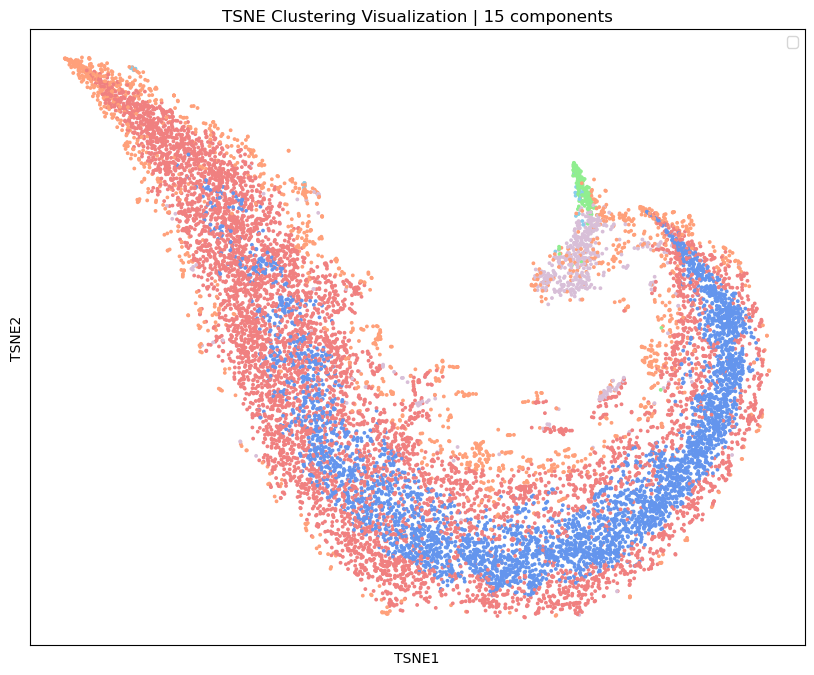

In [257]:
plt.figure(figsize=(10, 8))
plt.scatter(df_tsne['TSNE1'], df_tsne['TSNE2'], color=df_tsne['Color'], s=3)

plt.title('TSNE Clustering Visualization | 15 components')
plt.xlabel(f'TSNE1')
plt.ylabel(f'TSNE2')
plt.legend()
plt.grid(False)
plt.xticks([])  # Remove x-axis labels
plt.yticks([])  # Remove y-axis labels
plt.show()

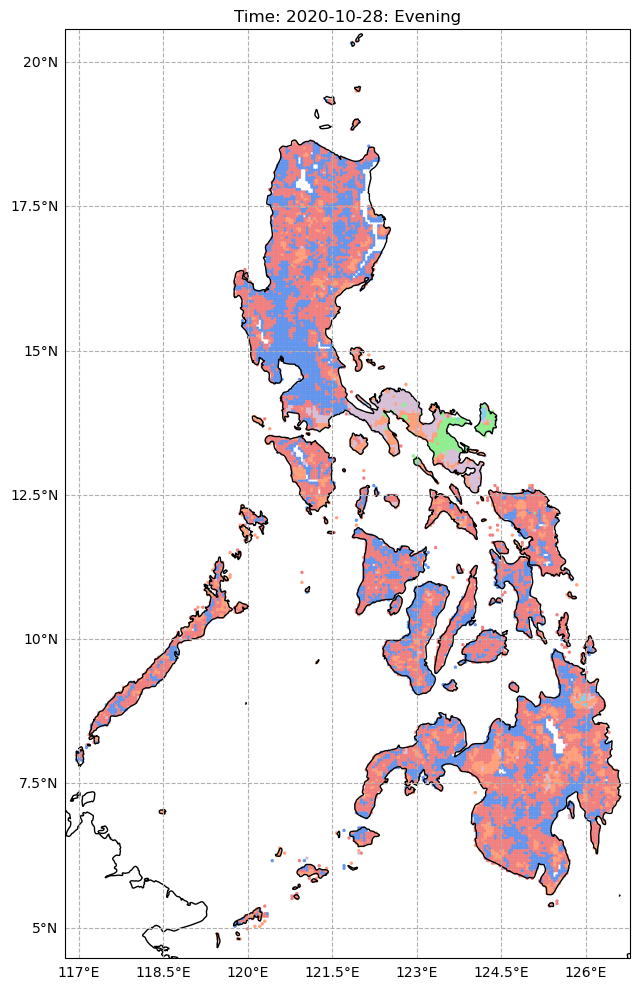

In [258]:
# Convert the DataFrame back to xarray
df_melted = df_gmm.reset_index().melt(id_vars=['geometry', 'Cluster','Color'], var_name='date_time', value_name='percent_change')
ds_updated = df_melted.set_index(['geometry', 'date_time']).to_xarray()

#plot_cuboidPoint_space(ds_updated.isel(date_time = [0]),ds_updated, markersize=0.8, extent=0.2, time_type="hourly",variable="Cluster")
plot_cuboidPoint_space_CAT(ds_updated.isel(date_time=[0]), ds_updated, markersize=2, extent=0.2, time_type="hourly")

In [136]:
ds.resample(date_time='1D').mean()

<xarray.Dataset> Size: 1MB
Dimensions:         (date_time: 6, geometry: 12974)
Coordinates:
  * geometry        (geometry) object 104kB POINT (117.00439453125 7.81984685...
    ADM_NAME        (geometry) object 104kB nan 'Palawan' ... 'Davao del Sur'
  * date_time       (date_time) datetime64[ns] 48B 2021-12-13 ... 2021-12-18
Data variables:
    n_users         (date_time, geometry) float64 623kB nan nan nan ... nan nan
    percent_change  (date_time, geometry) float64 623kB nan 37.59 ... -18.12

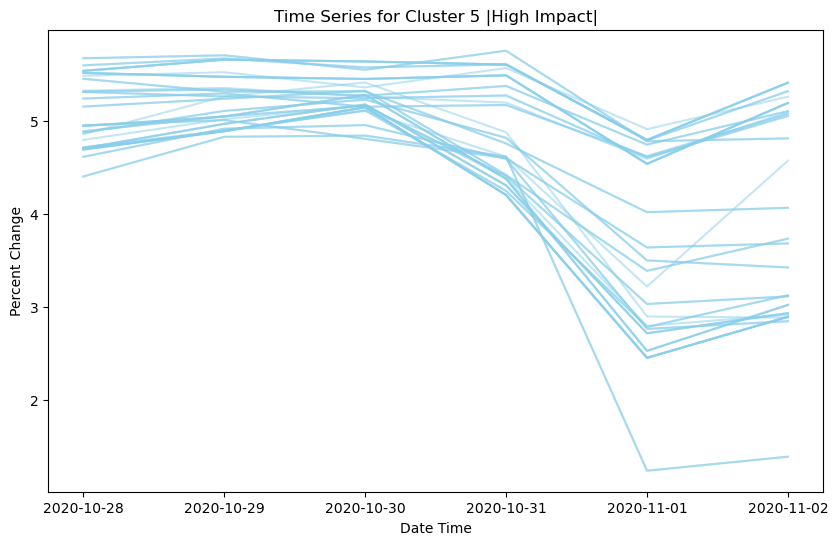

In [261]:

# Find unique clusters
clusters = np.unique(ds_updated['Cluster'].values)

# Create a dictionary to store the arrays per cluster
cluster_data = {cluster: [] for cluster in clusters}
cluster_colors = {cluster: None for cluster in clusters}

# Extract 10 random data points per cluster
for cluster in clusters:
    cluster_indices = np.where(ds_updated.isel(date_time=1)['Cluster'].values == cluster)[0]
    random_indices = np.random.choice(cluster_indices, 50, replace=True)  # Randomly select 10 indices
    cluster_data[cluster] = ds_updated['percent_change'].values[random_indices]
    cluster_colors[cluster] = ds_updated.isel(date_time=1)['Color'].values[random_indices][0]  # Save the color for this cluster

# Plotting the time series for one cluster (for example, cluster 4)
selected_cluster = clusters[5]  # Choose a cluster to plot
time_series_data = cluster_data[selected_cluster]
color = cluster_colors[selected_cluster]

# Plotting
plt.figure(figsize=(10, 6))
for i in range(time_series_data.shape[0]):
    plt.plot(ds_updated['date_time'].values, time_series_data[i], label=f"Series {i+1}", c=color, alpha = 0.5)

plt.title(f"Time Series for Cluster {selected_cluster}" + " |High Impact|")
plt.xlabel("Date Time")
plt.ylabel("Percent Change")
plt.show()


In [262]:
cluster_mapping = {
    0: "Low",
    3: "Low",
    1: "Very high",
    2: "None",
    4: "Moderate",
    5: "High"
}

# Apply the mapping to the 'Cluster' data variable to create a new categorical variable
category = np.vectorize(cluster_mapping.get)(ds_updated['Cluster'].isel(date_time=0).values)

# Add this new category as a data variable to the xarray dataset
ds_cluster = ds_updated.assign(Categorized_Cluster=(('geometry'), category))


In [263]:
# Convert geometry objects to strings for comparison
geometries_clusters_str = np.array([str(g) for g in ds_updated['geometry'].values])
geometries_target_str = np.array([str(g) for g in ds['geometry'].values])

# Find the common geometries using their string representation
common_geometries_str = np.intersect1d(geometries_target_str, geometries_clusters_str)

# Convert back the string representations to original geometry objects for selection
common_geometries = [g for g in ds['geometry'].values if str(g) in common_geometries_str]

# Select only the entries in target_ds that have geometries in common_geometries
ds_final = ds.sel(geometry=common_geometries)


categorized_cluster = ds_cluster['Categorized_Cluster']

# Align the geometries between ds_updated and target_ds
# This step ensures that the data aligns correctly based on the geometry dimension
aligned_categorized_cluster = categorized_cluster.sel(geometry=ds_final['geometry'])

# Add the Categorized_Cluster variable to target_ds
ds_final = ds_final.assign(Categorized_Cluster=aligned_categorized_cluster)

# Now target_ds_filtered contains only the entries with geometries in ds_clusters
print(ds_final)



<xarray.Dataset> Size: 4MB
Dimensions:              (date_time: 18, geometry: 12728)
Coordinates:
  * date_time            (date_time) datetime64[ns] 144B 2020-10-28T16:00:00 ...
  * geometry             (geometry) object 102kB POINT (117.04833984375 8.080...
    ADM_NAME             (geometry) object 102kB 'Palawan' ... 'Davao del Sur'
Data variables:
    n_users              (date_time, geometry) float64 2MB nan nan ... nan nan
    percent_change       (date_time, geometry) float64 2MB 82.06 51.54 ... 24.67
    Categorized_Cluster  (geometry) <U9 458kB 'Low' 'Low' 'Low' ... 'Low' 'Low'


In [264]:
ds_final

<xarray.Dataset> Size: 4MB
Dimensions:              (date_time: 18, geometry: 12728)
Coordinates:
  * date_time            (date_time) datetime64[ns] 144B 2020-10-28T16:00:00 ...
  * geometry             (geometry) object 102kB POINT (117.04833984375 8.080...
    ADM_NAME             (geometry) object 102kB 'Palawan' ... 'Davao del Sur'
Data variables:
    n_users              (date_time, geometry) float64 2MB nan nan ... nan nan
    percent_change       (date_time, geometry) float64 2MB 82.06 51.54 ... 24.67
    Categorized_Cluster  (geometry) <U9 458kB 'Low' 'Low' 'Low' ... 'Low' 'Low'

In [265]:

# Assign numerical values to the crisis categories
category_mapping = {
    "None": 0,
    "Low": 1,
    "Moderate":3,
    "High": 5,
    "Very high": 8
}

# Map the categories in the dataset to numerical intensity scores
intensity_scores = np.vectorize(category_mapping.get)(ds_final['Categorized_Cluster'].values)

# Handle NaN or missing values in n_users by replacing them with 0
n_users_filled = np.nan_to_num(ds_final['n_users'].values, nan=np.log10(5))

# Calculate the Crisis Sensibility Index (CSI)
CSI = intensity_scores * n_users_filled

# Add the CSI to the dataset
ds_NUTS = ds_final.assign(Crisis_Sensibility_Index=(('date_time', 'geometry'), CSI))

In [266]:
ds_NUTS

<xarray.Dataset> Size: 6MB
Dimensions:                   (date_time: 18, geometry: 12728)
Coordinates:
  * date_time                 (date_time) datetime64[ns] 144B 2020-10-28T16:0...
  * geometry                  (geometry) object 102kB POINT (117.04833984375 ...
    ADM_NAME                  (geometry) object 102kB 'Palawan' ... 'Davao de...
Data variables:
    n_users                   (date_time, geometry) float64 2MB nan nan ... nan
    percent_change            (date_time, geometry) float64 2MB 82.06 ... 24.67
    Categorized_Cluster       (geometry) <U9 458kB 'Low' 'Low' ... 'Low' 'Low'
    Crisis_Sensibility_Index  (date_time, geometry) float64 2MB 0.699 ... 0.699

A
loop
loop
B


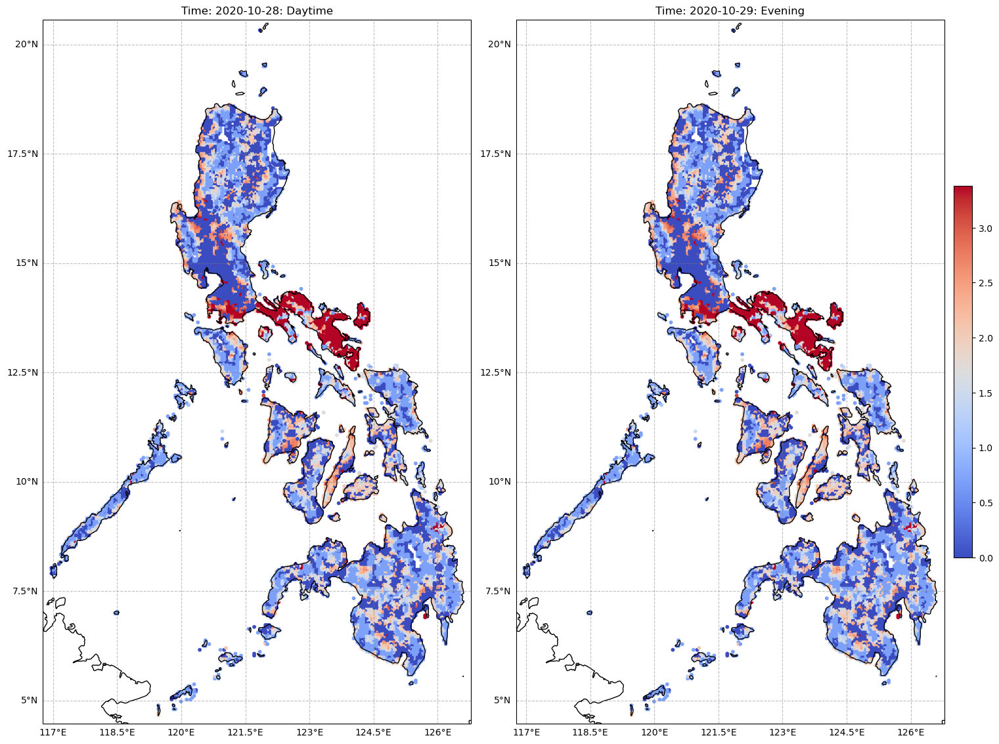

In [267]:
plot_cuboidPoint_space(ds_NUTS.isel(date_time = [0,1]),ds_NUTS, markersize=10, extent=0.2, time_type="hourly",variable="Crisis_Sensibility_Index")